In [1]:
#import all packages needed 
import pandas as pd
import numpy as np 
import re
from datetime import datetime 
import ast
from collections import Counter
from collections import OrderedDict
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import geopandas as gpd
from scipy.stats import ttest_ind
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from pysal.lib.weights import KNN
from pysal.explore import esda
!pip install urbanaccess pandana

#insert file_path for the data
file_path = 'C:/Users/anton/Documents/2de_master/Thesis/Code/analysis/Code/Airbnb_Spatiotemporal_Analysis/Data Exploration Listings/cleaned_dataset.xlsx'
#read data, and quickly check if it is correctly read in
dataframe1= pd.read_excel(file_path)

C:\Users\anton\anaconda3\Lib\site-packages\pysal\lib\cg\alpha_shapes.py:33: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
C:\Users\anton\anaconda3\Lib\site-packages\pysal\lib\cg\alpha_shapes.py:154: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
C:\Users\anton\anaconda3\Lib\site-packages\pysal\lib\cg\alpha_shapes.py:187: NumbaDeprecationWarning: The 'no

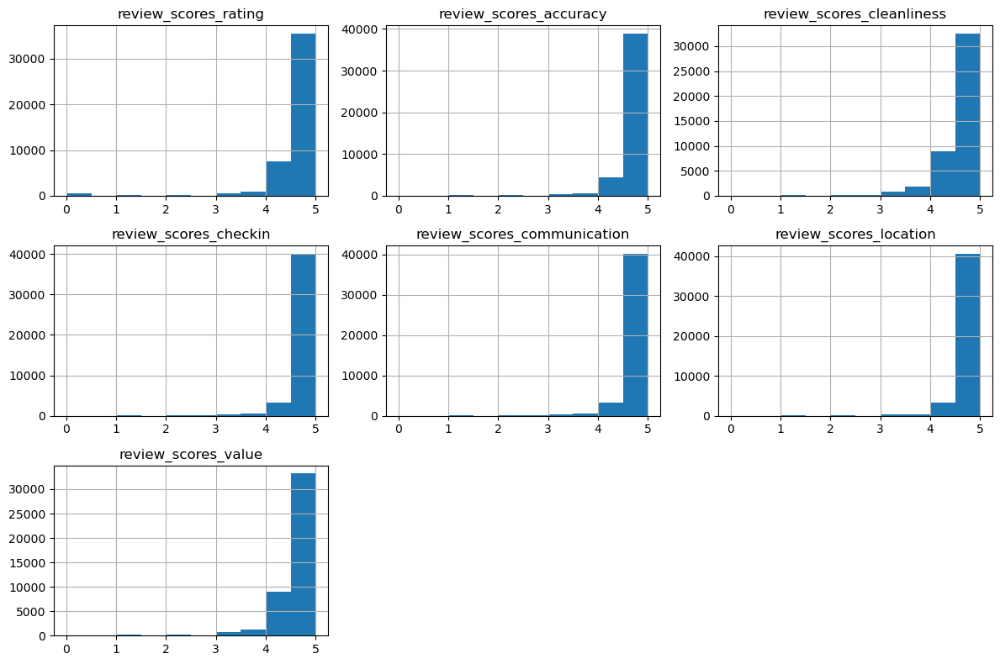

In [2]:
# Checking the distributions of the review ratings columns
variables_to_plot = list(dataframe1.columns[dataframe1.columns.str.startswith("review_scores") == True])
fig = plt.figure(figsize=(12,8))
for i, var_name in enumerate(variables_to_plot):
    ax = fig.add_subplot(3,3,i+1)
    dataframe1[var_name].hist(bins=10,ax=ax)
    ax.set_title(var_name)
fig.tight_layout()
plt.show()

#out of these we see that most of them are rated quite positive, with the biggest amount around 4-5/5 stars

In [3]:
# Importing the Paris neighbourhood  GeoJSON file as a dataframe in geopandas
map_dataframe1 = gpd.read_file('C:/Users/anton/Documents/2de_master/Thesis/Code/analysis/Data/2. airbnb_data/Paris/Q1 airbnb_data Paris/neighbourhoods.geojson')
map_dataframe1.drop('neighbourhood_group', axis = 1, inplace = True)
map_dataframe1.head(20)

,neighbourhood,geometry
0,Batignolles-Monceau,"MULTIPOLYGON (((2.29517 48.87396, 2.29504 48.8..."
1,Palais-Bourbon,"MULTIPOLYGON (((2.32090 48.86306, 2.32094 48.8..."
2,Buttes-Chaumont,"MULTIPOLYGON (((2.38943 48.90122, 2.39014 48.9..."
3,Opéra,"MULTIPOLYGON (((2.33978 48.88203, 2.33982 48.8..."
4,Entrepôt,"MULTIPOLYGON (((2.36469 48.88437, 2.36485 48.8..."
5,Gobelins,"MULTIPOLYGON (((2.37491 48.83801, 2.37698 48.8..."
6,Vaugirard,"MULTIPOLYGON (((2.29932 48.85217, 2.30088 48.8..."
7,Reuilly,"MULTIPOLYGON (((2.41388 48.83357, 2.41401 48.8..."
8,Louvre,"MULTIPOLYGON (((2.32801 48.86992, 2.32997 48.8..."
9,Luxembourg,"MULTIPOLYGON (((2.34459 48.85405, 2.34428 48.8..."


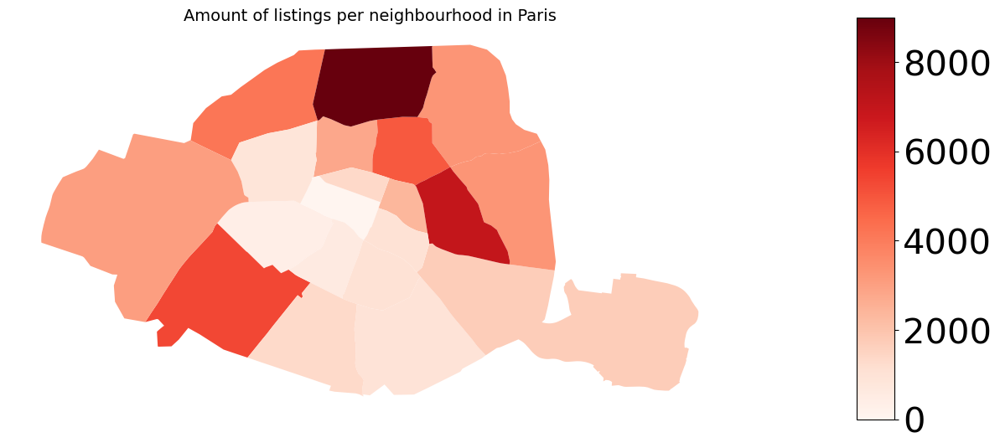

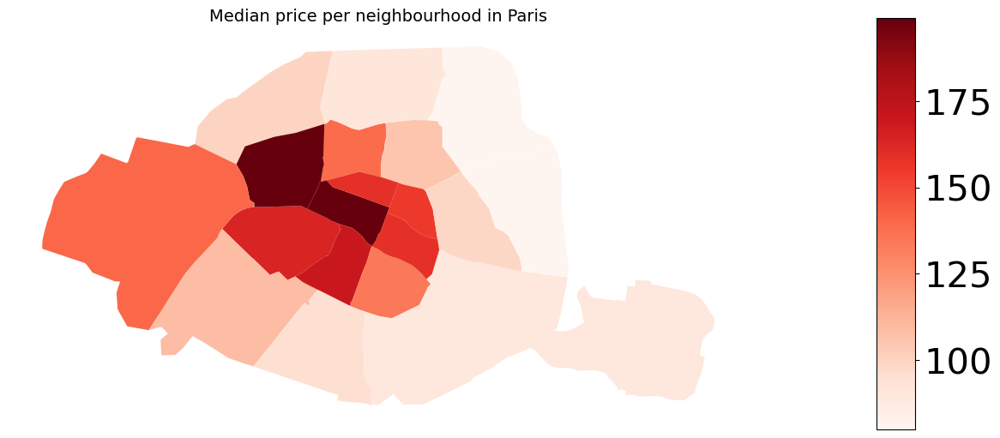

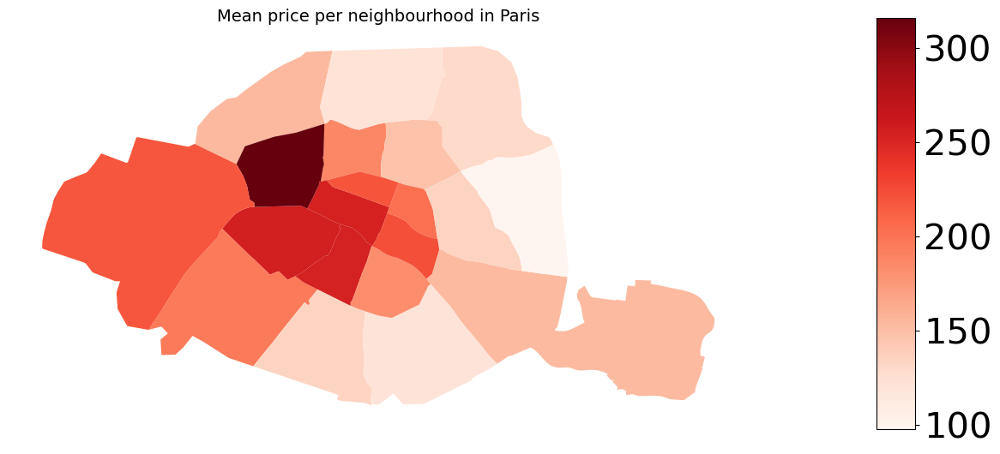

                     number_of_listings  median_price  mean_price
neighbourhood                                                    
Batignolles-Monceau                3589         100.0  153.382279
Bourse                             2061         159.0  219.372635
Buttes-Chaumont                    3121          80.0  129.209869
Buttes-Montmartre                  6210          91.0  121.979871
Entrepôt                           3983         106.0  147.200100
Gobelins                           1865          90.0  120.163539
Hôtel-de-Ville                     1901         159.0  222.794319
Louvre                             1337         199.0  253.426328
Luxembourg                         1643         170.0  254.405965
Ménilmontant                       3116          80.0   97.531772
Observatoire                       2049          95.0  133.720839
Opéra                              2853         139.0  186.611286
Palais-Bourbon                     1530         164.0  255.744444
Panthéon  

In [4]:
#setting the characteristics for the following plot
plt.rcParams.update({'font.size': 30})
plt.rcParams['figure.figsize'] = 280, 280


# Creating a dataframe of listing counts and median price by neighbourhood
neighbourhood_dataframe1 = pd.DataFrame(dataframe1.groupby('neighbourhood').size())
neighbourhood_dataframe1.rename(columns={0: 'number_of_listings'}, inplace=True)
neighbourhood_dataframe1['median_price'] = dataframe1.groupby('neighbourhood').price.median().values
neighbourhood_dataframe1['mean_price'] = dataframe1.groupby('neighbourhood').price.mean().values

# Putting the dataframes together
neighbourhood_map_dataframe1 = map_dataframe1.set_index('neighbourhood').join(neighbourhood_dataframe1)
                  
# Plotting the number of listings in each neighbourhood
fig1, ax1 = plt.subplots(1, figsize=(15, 6)) #deciding on plot size
neighbourhood_map_dataframe1.plot(column='number_of_listings', cmap='Reds', ax=ax1, rasterized=True) 
#rasterized to makes it easier for big data sets + ax1 earlier defined

ax1.axis('off') #disabling the axis components, including axis labels, ticks, and the frame surrounding the plot
ax1.set_title('Amount of listings per neighbourhood in Paris', fontsize=14)
cax1 = fig1.add_axes([0.9, 0.1, 0.03, 0.8]) # Adjusted the position and size as needed for the side axis [left, bottom, width, height]
#ScalarMappable to make a color map + norm, to normalize the coloring within the graph 
sm1 = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=0, vmax=9000))
sm1._A = [] # The primary reason for doing this is to provide an empty array that will later be populated with the data range when the plot is created. The colorbar uses this array to decide the color scaling for the colormap.
cbar1 = fig1.colorbar(sm1, cax=cax1) 
plt.show()

# Plotting the median price of listings in each neighbourhood
fig2, ax2 = plt.subplots(1, figsize=(15, 6))
neighbourhood_map_dataframe1.plot(column='median_price', cmap='Reds', ax=ax2)
ax2.axis('off')
ax2.set_title('Median price per neighbourhood in Paris', fontsize=14)
cax2 = fig2.add_axes([0.9, 0.1, 0.03, 0.8])  # Adjusted the position and size as needed for the side axis [left, bottom, width, height]
#ScalarMappable to make a color map + norm, to normalize the coloring within the graph 
sm2 = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=min(neighbourhood_map_dataframe1.median_price), vmax=max(neighbourhood_map_dataframe1.median_price))) 
sm2._A = [] # The primary reason for doing this is to provide an empty array that will later be populated with the data range when the plot is created. The colorbar uses this array to decide the color scaling for the colormap.
cbar2 = fig2.colorbar(sm2, cax=cax2)
plt.show()

# Plotting the mean price of listings in each neighbourhood
fig3, ax3 = plt.subplots(1, figsize=(15, 6))
neighbourhood_map_dataframe1.plot(column='mean_price', cmap='Reds', ax=ax3)
ax3.axis('off')
ax3.set_title('Mean price per neighbourhood in Paris', fontsize=14)
cax3 = fig3.add_axes([0.9, 0.1, 0.03, 0.8])  # Adjusted the position and size as needed for the side axis [left, bottom, width, height]
#ScalarMappable to make a color map + norm, to normalize the coloring within the graph 
sm3 = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=min(neighbourhood_map_dataframe1.mean_price), vmax=max(neighbourhood_map_dataframe1.mean_price))) 
sm3._A = [] # The primary reason for doing this is to provide an empty array that will later be populated with the data range when the plot is created. The colorbar uses this array to decide the color scaling for the colormap.
cbar3 = fig3.colorbar(sm3, cax=cax3)
plt.show()

print(neighbourhood_dataframe1)

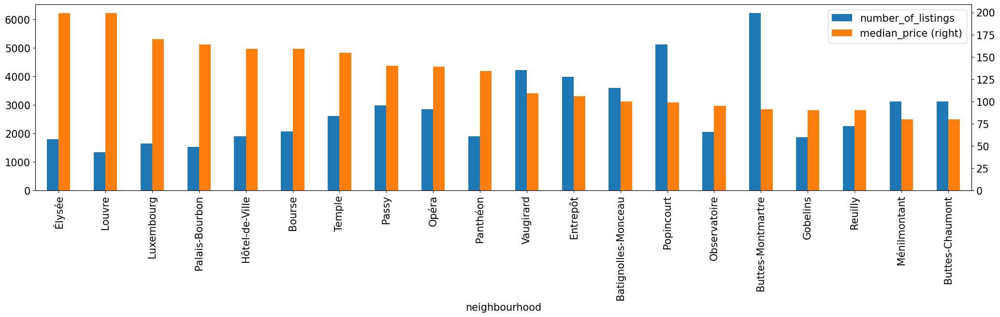

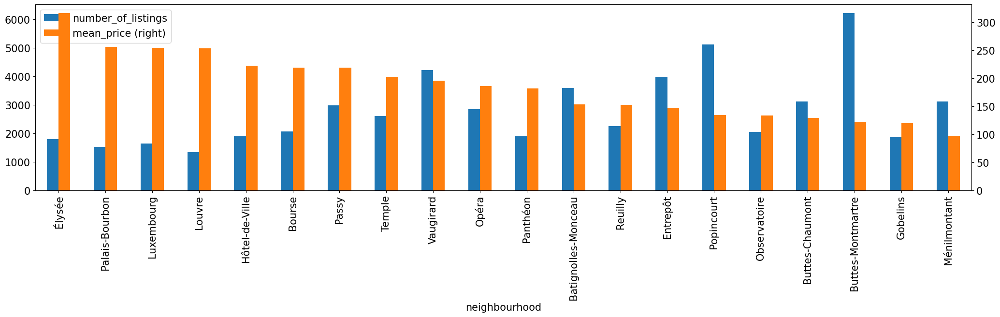

In [5]:
# Plot number of listings and median price in one bar plot
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 25, 5
selected_columns = ['number_of_listings', 'median_price']
neighbourhood_dataframe1_selected = neighbourhood_dataframe1[selected_columns]
neighbourhood_dataframe1_sorted = neighbourhood_dataframe1_selected.sort_values('median_price', ascending=False)
neighbourhood_dataframe1_sorted.plot( kind= 'bar' , secondary_y= 'median_price' , rot= 90 )
plt.xticks(rotation='vertical')
plt.show()

# Plot number of listings and mean price in one bar plot
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 25, 5
selected_columns = ['number_of_listings', 'mean_price']
neighbourhood_dataframe1_selected = neighbourhood_dataframe1[selected_columns]
neighbourhood_dataframe1_sorted = neighbourhood_dataframe1_selected.sort_values('mean_price', ascending=False)
neighbourhood_dataframe1_sorted.plot( kind= 'bar' , secondary_y= 'mean_price' , rot= 90 )
plt.xticks(rotation='vertical')
plt.show()

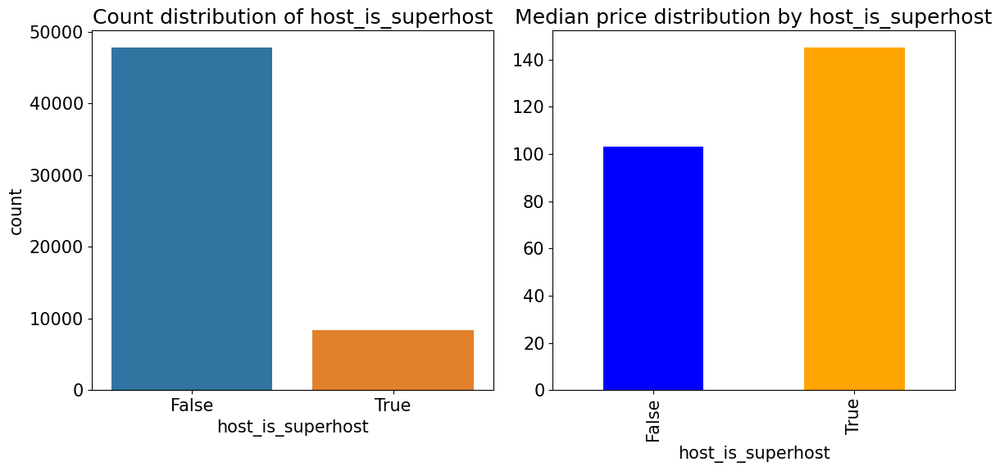

% Wise Split of host_is_superhost:
host_is_superhost
False    85.108202
True     14.891798
Name: proportion, dtype: float64

P-value for host_is_superhost: 2.736628793002476e-26
host_is_superhost is statistically significant (p-value < 0.05)
host_is_superhost
False    0.851082
True     0.148918
Name: proportion, dtype: float64


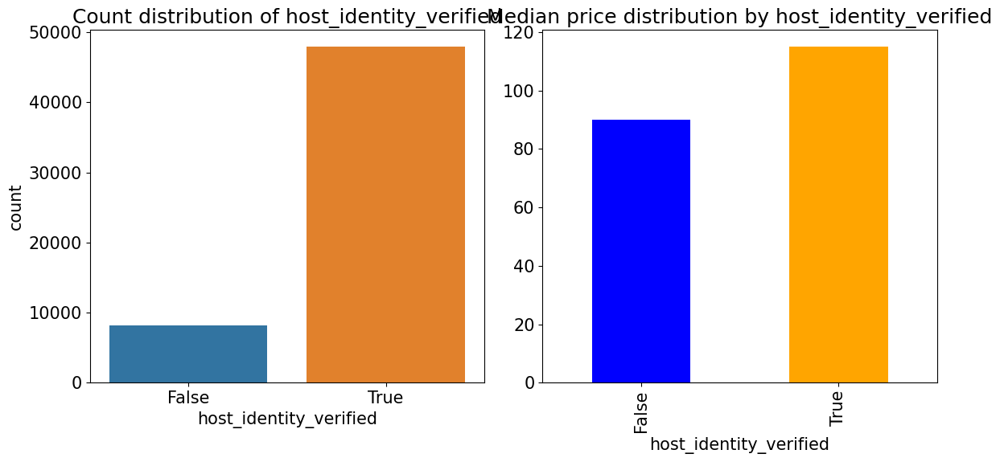

% Wise Split of host_identity_verified:
host_identity_verified
True     85.359337
False    14.640663
Name: proportion, dtype: float64

P-value for host_identity_verified: 6.700303781891284e-08
host_identity_verified is statistically significant (p-value < 0.05)
host_identity_verified
True     0.853593
False    0.146407
Name: proportion, dtype: float64


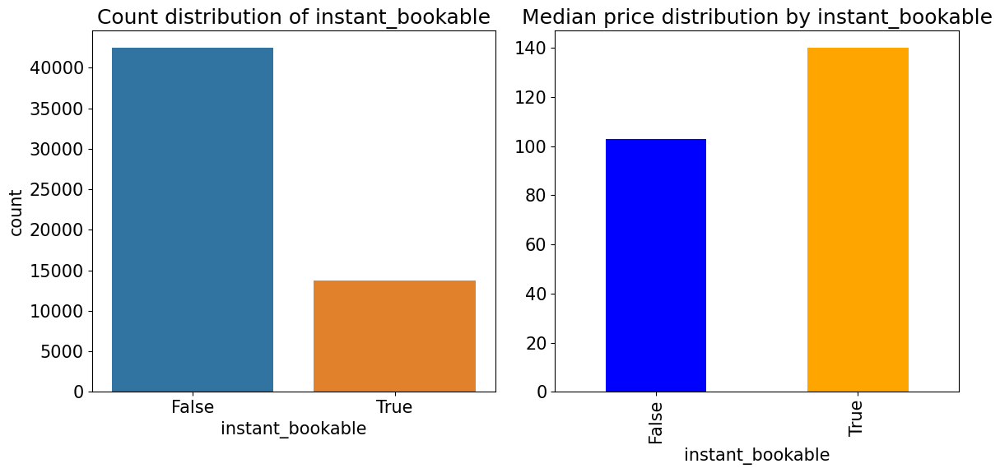

% Wise Split of instant_bookable:
instant_bookable
False    75.597115
True     24.402885
Name: proportion, dtype: float64

P-value for instant_bookable: 1.2519035942711133e-19
instant_bookable is statistically significant (p-value < 0.05)
instant_bookable
False    0.755971
True     0.244029
Name: proportion, dtype: float64


In [6]:
def binary_count_and_price_plot(column_name,alpha=0.05):
    # Assuming dataframe1 is your DataFrame

    # Plot count distribution
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.countplot(x=column_name, data=dataframe1)
    plt.title(f'Count distribution of {column_name}')

    # Plot median price distribution
    plt.subplot(1, 2, 2)
    median_prices = dataframe1.groupby(column_name)['price'].median()
    median_prices.plot(kind='bar', color=['blue', 'orange'])
    plt.title(f'Median price distribution by {column_name}')
    plt.tight_layout()
    plt.show()

    # Calculate t-test for median prices
    true_prices = dataframe1[dataframe1[column_name] == True]['price']
    false_prices = dataframe1[dataframe1[column_name] == False]['price']
    t_stat, p_value = ttest_ind(true_prices, false_prices)
   
    # Display additional information
    percent_split = dataframe1[column_name].value_counts(normalize=True) * 100
    print(f'% Wise Split of {column_name}:\n{percent_split}')
    t_statistic, p_value = ttest_ind(true_prices, false_prices, equal_var=False)  # assuming unequal variances
    print(f'\nP-value for {column_name}: {p_value}')
    
    # Check if p-value is greater than or equal to alpha
    if p_value >= alpha:
        print(f"{column_name} is not statistically significant (p-value >= {alpha})")
        return column_name
    else:
        print(f"{column_name} is statistically significant (p-value < {alpha})")
        return None  # or any other value if needed

superhost = binary_count_and_price_plot('host_is_superhost')
print(dataframe1.host_is_superhost.value_counts(normalize=True))

test2 = binary_count_and_price_plot('host_identity_verified')
print(dataframe1.host_identity_verified.value_counts(normalize=True))

test3 = binary_count_and_price_plot('instant_bookable')
print(dataframe1.instant_bookable.value_counts(normalize=True))

In [7]:
# Get column names and their indices
column_info = list(enumerate(dataframe1.columns))
# Print column names and their indices
for index, column_name in column_info:
    print(f"Column {index}: {column_name}")
    
#now we know that the amenity columns start from index 51

Column 0: id
Column 1: host_id
Column 2: host_since
Column 3: host_response_time
Column 4: host_response_rate
Column 5: host_is_superhost
Column 6: host_listings_count
Column 7: host_total_listings_count
Column 8: host_identity_verified
Column 9: neighbourhood
Column 10: latitude
Column 11: longitude
Column 12: property_type
Column 13: room_type
Column 14: accommodates
Column 15: bathrooms
Column 16: bedrooms
Column 17: beds
Column 18: price
Column 19: minimum_nights
Column 20: maximum_nights
Column 21: has_availability
Column 22: availability_30
Column 23: availability_60
Column 24: availability_90
Column 25: availability_365
Column 26: number_of_reviews
Column 27: number_of_reviews_ltm
Column 28: number_of_reviews_l30d
Column 29: first_review
Column 30: last_review
Column 31: review_scores_rating
Column 32: review_scores_accuracy
Column 33: review_scores_cleanliness
Column 34: review_scores_checkin
Column 35: review_scores_communication
Column 36: review_scores_location
Column 37: re

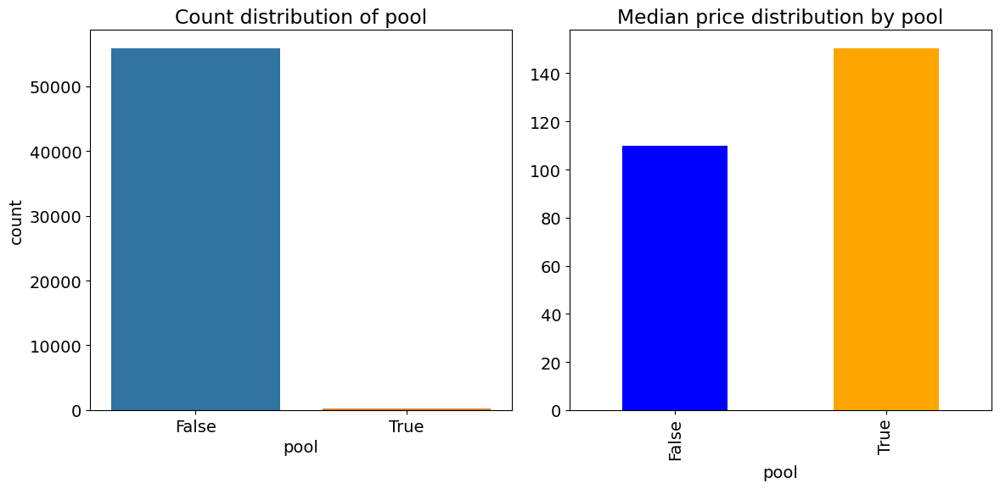

% Wise Split of pool:
pool
False    99.590346
True      0.409654
Name: proportion, dtype: float64

P-value for pool: 1.5173013376505405e-06
pool is statistically significant (p-value < 0.05)


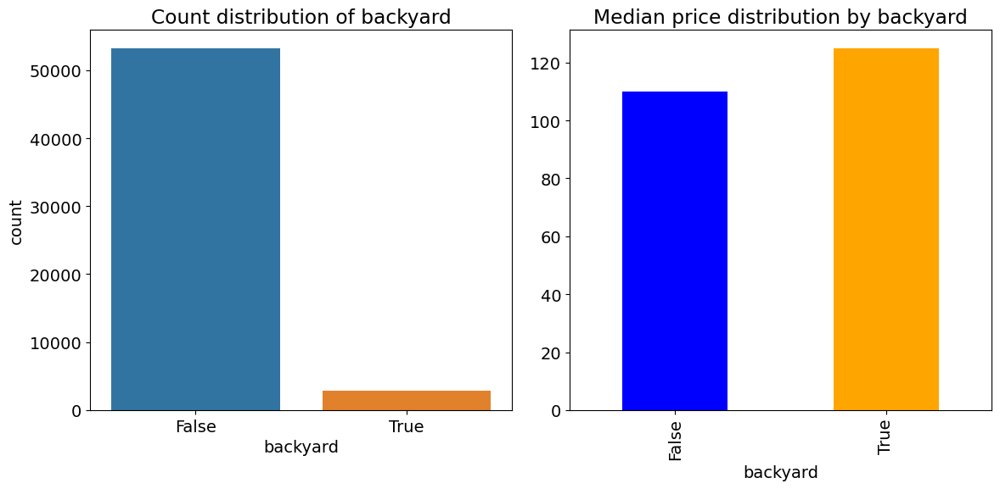

% Wise Split of backyard:
backyard
False    94.861519
True      5.138481
Name: proportion, dtype: float64

P-value for backyard: 0.010549797922482937
backyard is statistically significant (p-value < 0.05)


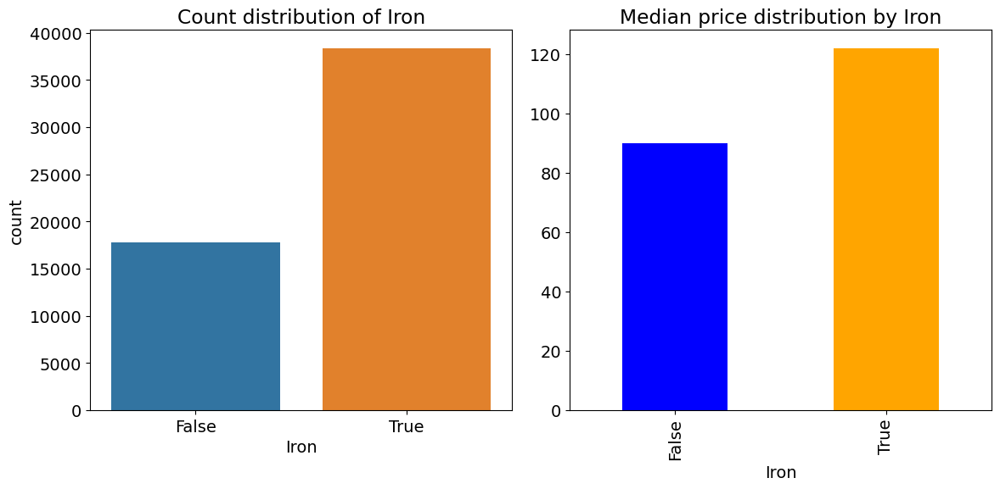

% Wise Split of Iron:
Iron
True     68.349809
False    31.650191
Name: proportion, dtype: float64

P-value for Iron: 1.2017036239480698e-14
Iron is statistically significant (p-value < 0.05)


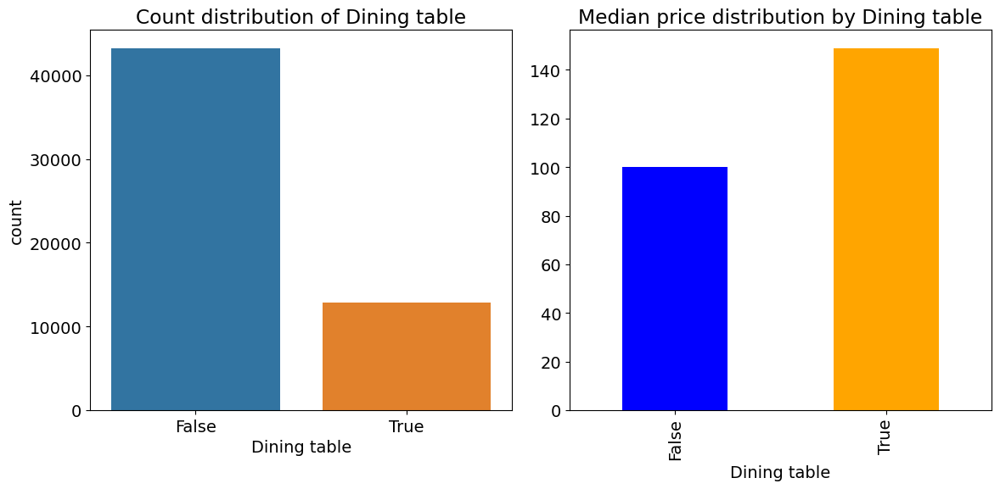

% Wise Split of Dining table:
Dining table
False    77.04337
True     22.95663
Name: proportion, dtype: float64

P-value for Dining table: 1.4374409467258933e-40
Dining table is statistically significant (p-value < 0.05)


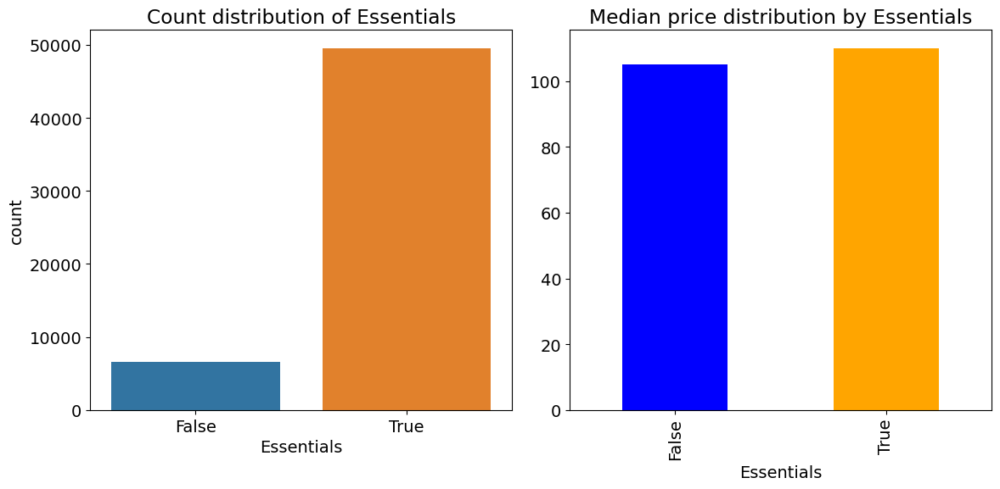

% Wise Split of Essentials:
Essentials
True     88.267878
False    11.732122
Name: proportion, dtype: float64

P-value for Essentials: 0.09749467050696592
Essentials is not statistically significant (p-value >= 0.05)


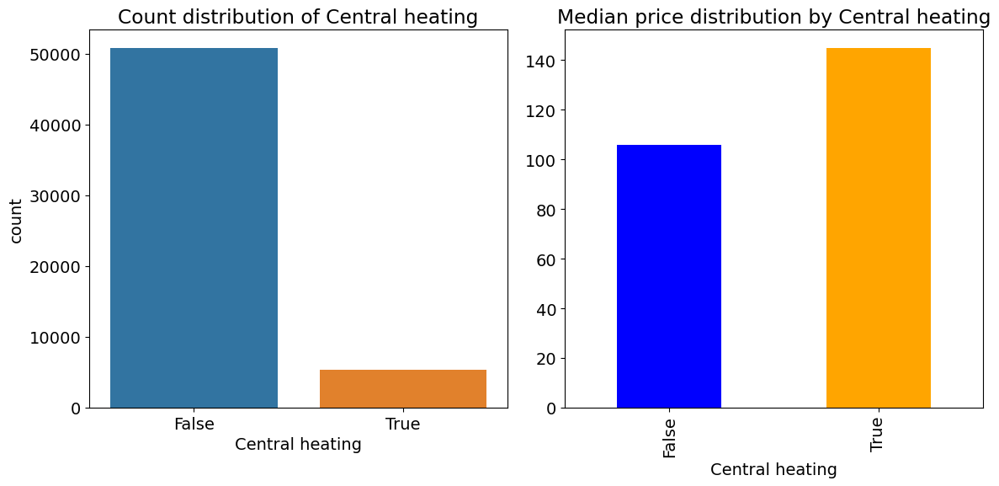

% Wise Split of Central heating:
Central heating
False    90.512067
True      9.487933
Name: proportion, dtype: float64

P-value for Central heating: 7.544844003073307e-13
Central heating is statistically significant (p-value < 0.05)


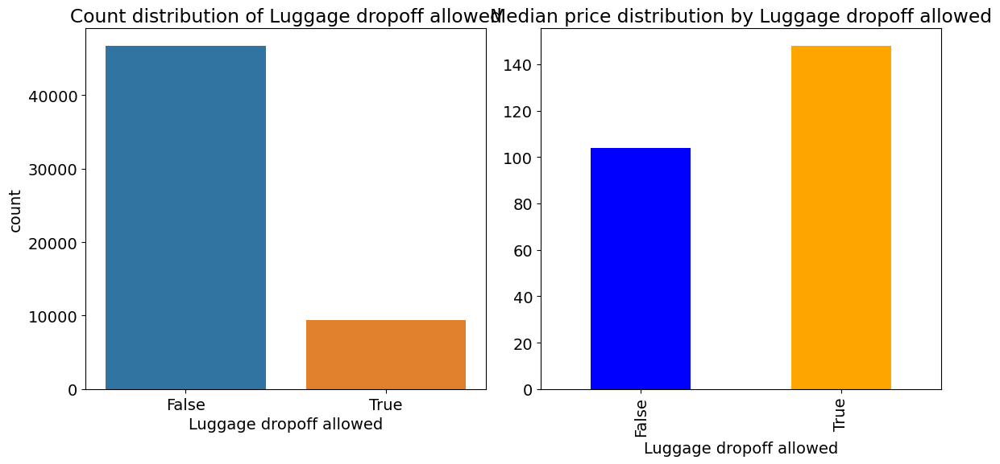

% Wise Split of Luggage dropoff allowed:
Luggage dropoff allowed
False    83.232701
True     16.767299
Name: proportion, dtype: float64

P-value for Luggage dropoff allowed: 3.231626476648721e-25
Luggage dropoff allowed is statistically significant (p-value < 0.05)


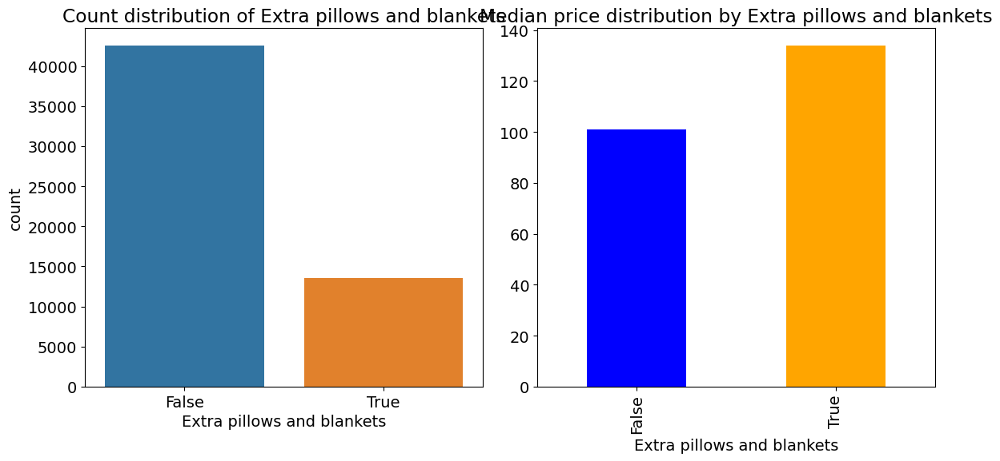

% Wise Split of Extra pillows and blankets:
Extra pillows and blankets
False    75.83222
True     24.16778
Name: proportion, dtype: float64

P-value for Extra pillows and blankets: 4.367322375358573e-11
Extra pillows and blankets is statistically significant (p-value < 0.05)


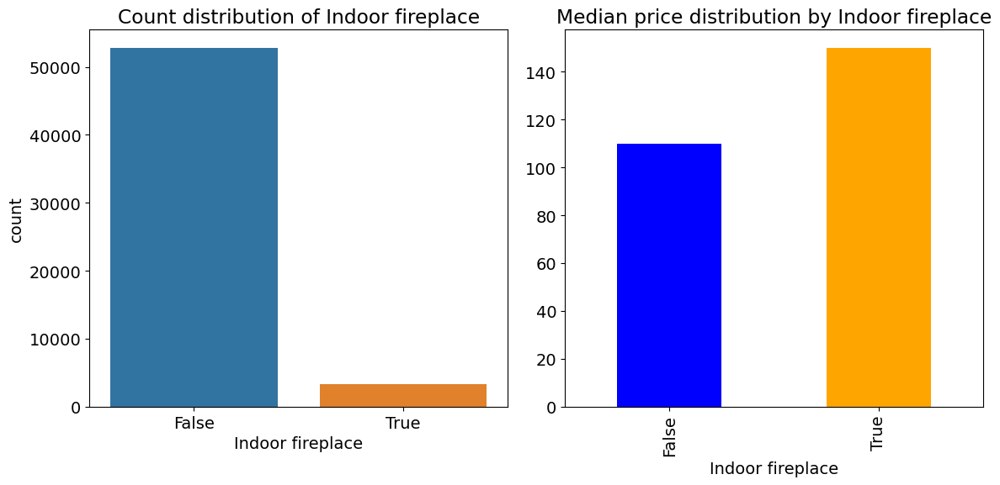

% Wise Split of Indoor fireplace:
Indoor fireplace
False    94.092083
True      5.907917
Name: proportion, dtype: float64

P-value for Indoor fireplace: 2.2402182058163705e-29
Indoor fireplace is statistically significant (p-value < 0.05)


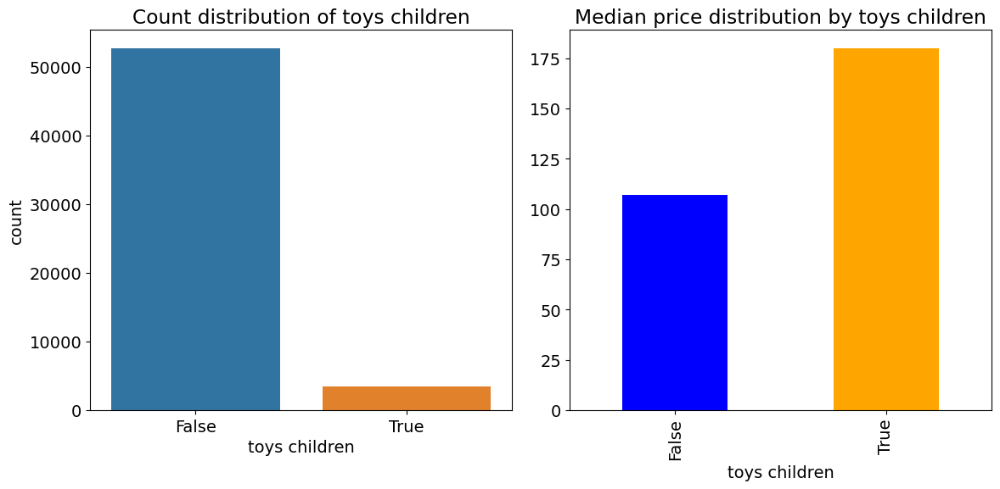

% Wise Split of toys children:
toys children
False    93.87657
True      6.12343
Name: proportion, dtype: float64

P-value for toys children: 2.9381064050995317e-49
toys children is statistically significant (p-value < 0.05)


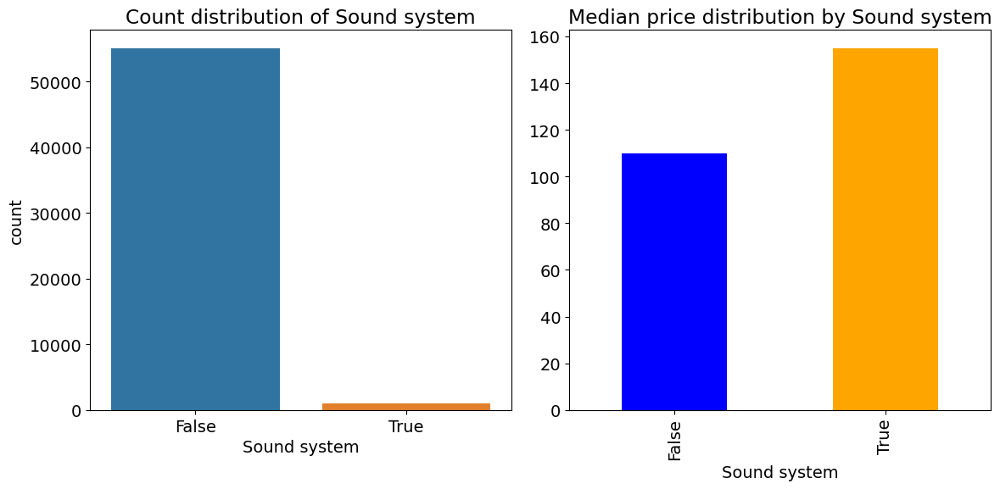

% Wise Split of Sound system:
Sound system
False    98.12628
True      1.87372
Name: proportion, dtype: float64

P-value for Sound system: 0.05519253681547283
Sound system is not statistically significant (p-value >= 0.05)


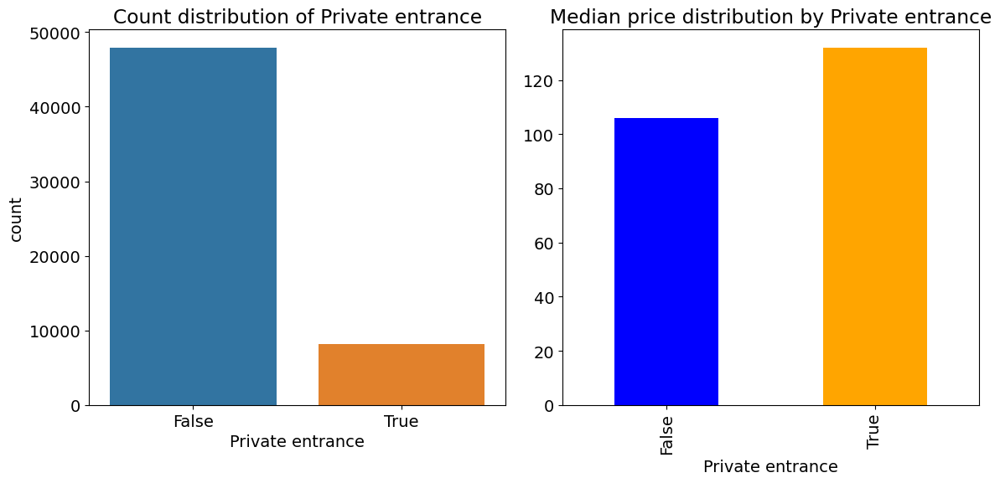

% Wise Split of Private entrance:
Private entrance
False    85.387835
True     14.612165
Name: proportion, dtype: float64

P-value for Private entrance: 1.902940382559581e-05
Private entrance is statistically significant (p-value < 0.05)


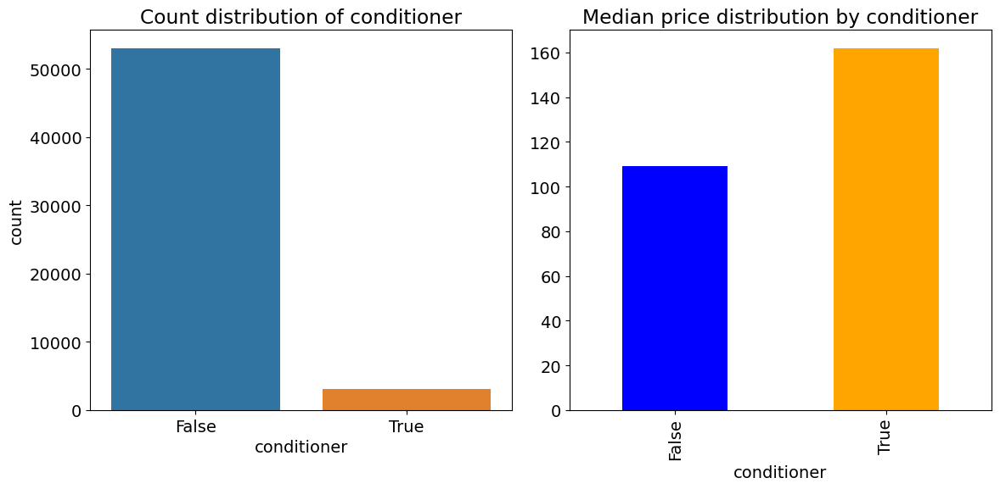

% Wise Split of conditioner:
conditioner
False    94.453647
True      5.546353
Name: proportion, dtype: float64

P-value for conditioner: 2.2941426333939623e-31
conditioner is statistically significant (p-value < 0.05)


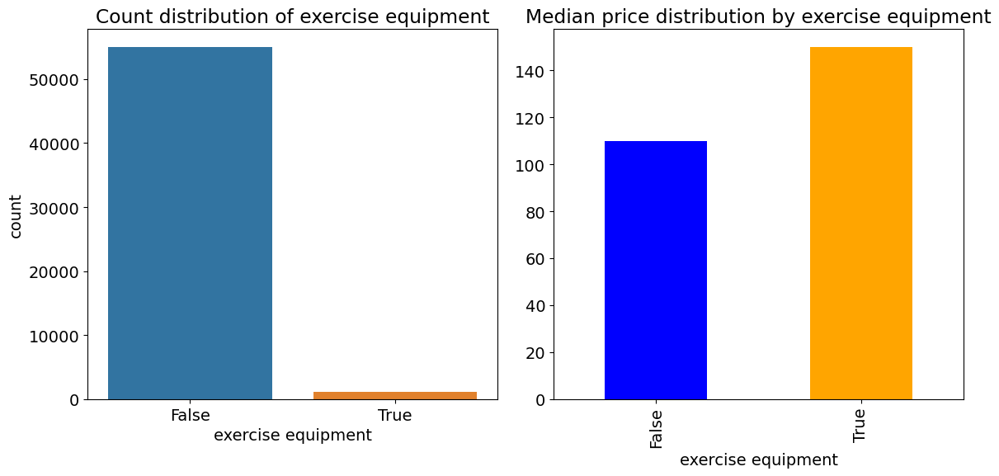

% Wise Split of exercise equipment:
exercise equipment
False    98.056817
True      1.943183
Name: proportion, dtype: float64

P-value for exercise equipment: 0.05492387880659646
exercise equipment is not statistically significant (p-value >= 0.05)


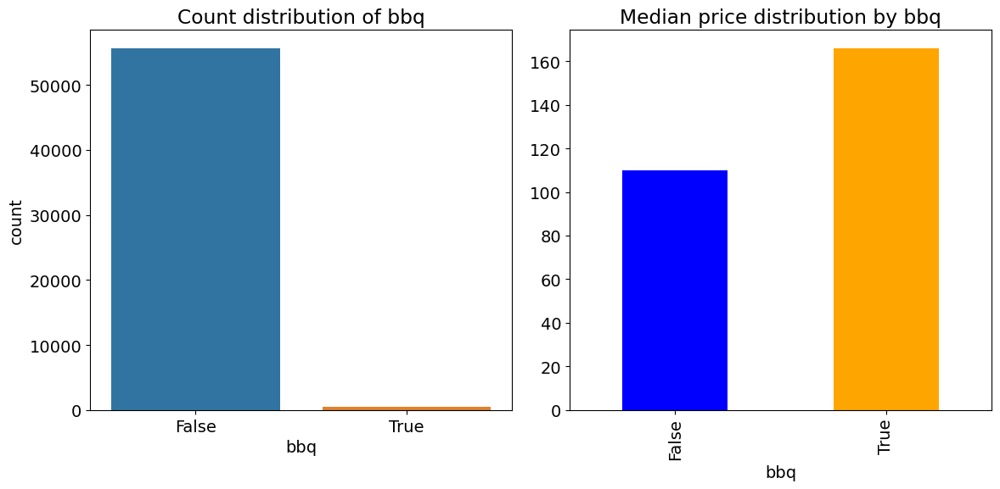

% Wise Split of bbq:
bbq
False    99.153976
True      0.846024
Name: proportion, dtype: float64

P-value for bbq: 2.6922403519555176e-10
bbq is statistically significant (p-value < 0.05)


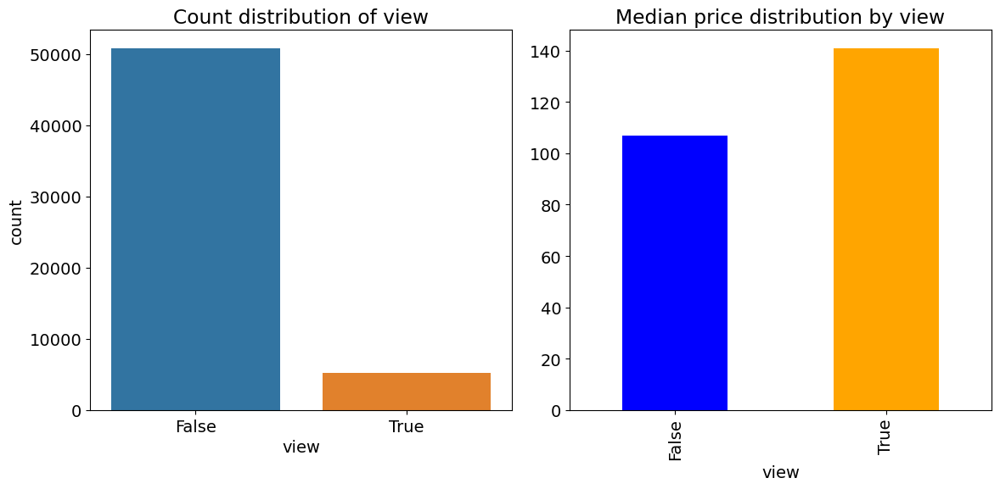

% Wise Split of view:
view
False    90.604684
True      9.395316
Name: proportion, dtype: float64

P-value for view: 9.485353251704992e-17
view is statistically significant (p-value < 0.05)


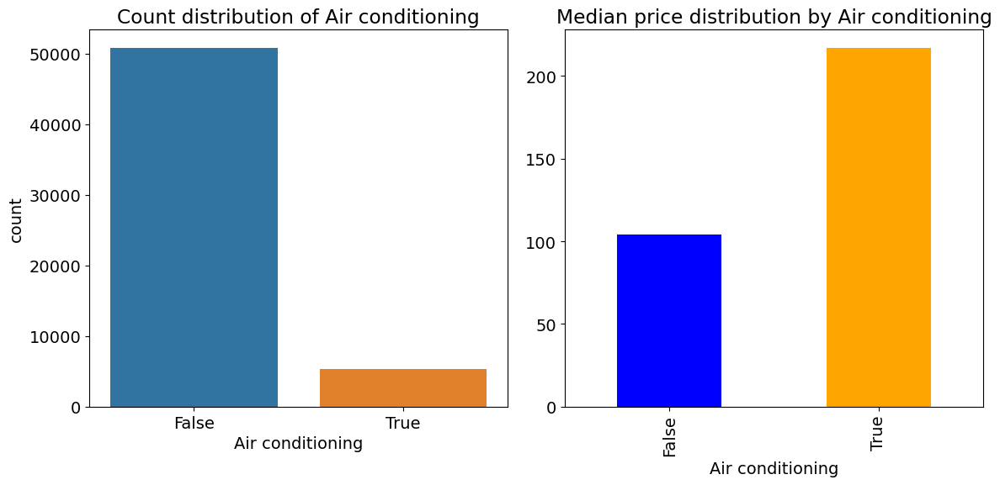

% Wise Split of Air conditioning:
Air conditioning
False    90.531659
True      9.468341
Name: proportion, dtype: float64

P-value for Air conditioning: 6.293764164677432e-100
Air conditioning is statistically significant (p-value < 0.05)


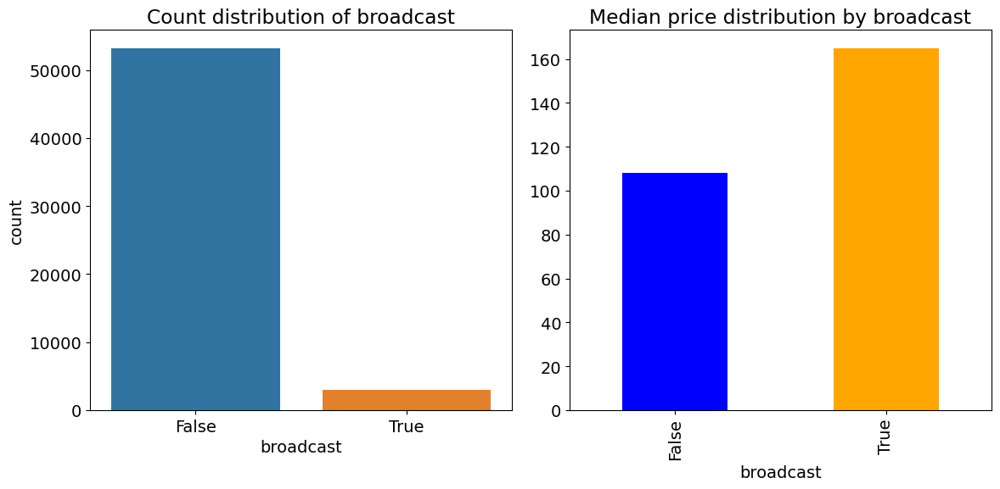

% Wise Split of broadcast:
broadcast
False    94.799181
True      5.200819
Name: proportion, dtype: float64

P-value for broadcast: 3.9567237582175323e-13
broadcast is statistically significant (p-value < 0.05)


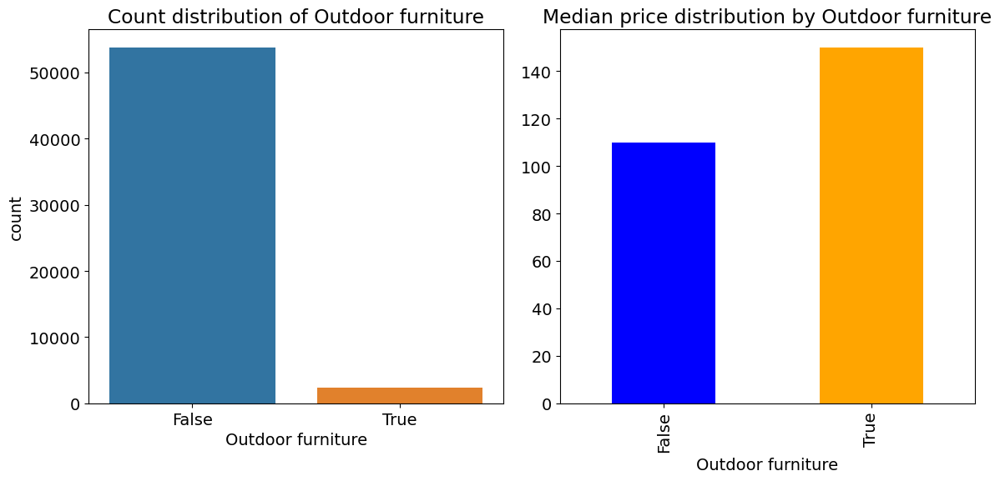

% Wise Split of Outdoor furniture:
Outdoor furniture
False    95.81619
True      4.18381
Name: proportion, dtype: float64

P-value for Outdoor furniture: 3.575185977845525e-18
Outdoor furniture is statistically significant (p-value < 0.05)


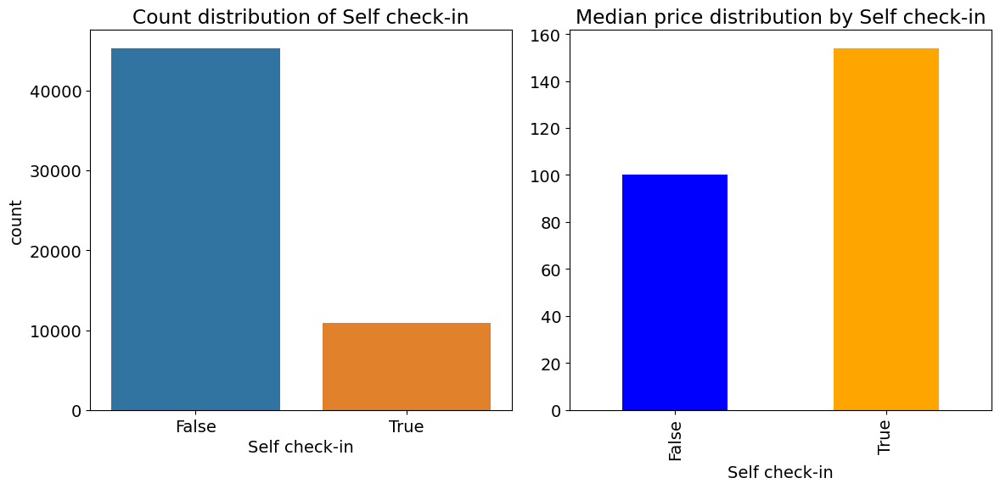

% Wise Split of Self check-in:
Self check-in
False    80.657227
True     19.342773
Name: proportion, dtype: float64

P-value for Self check-in: 1.1490512078779087e-14
Self check-in is statistically significant (p-value < 0.05)


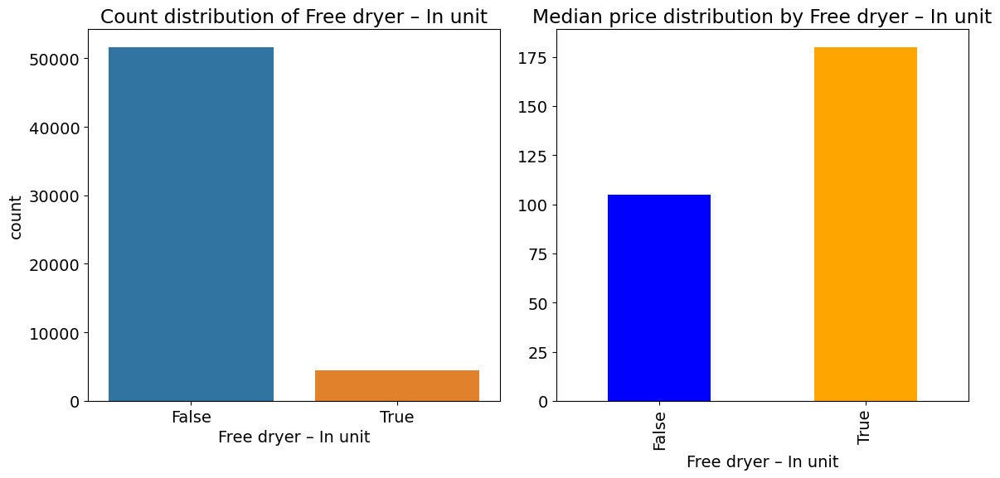

% Wise Split of Free dryer – In unit:
Free dryer – In unit
False    91.993944
True      8.006056
Name: proportion, dtype: float64

P-value for Free dryer – In unit: 3.9736039251351823e-66
Free dryer – In unit is statistically significant (p-value < 0.05)


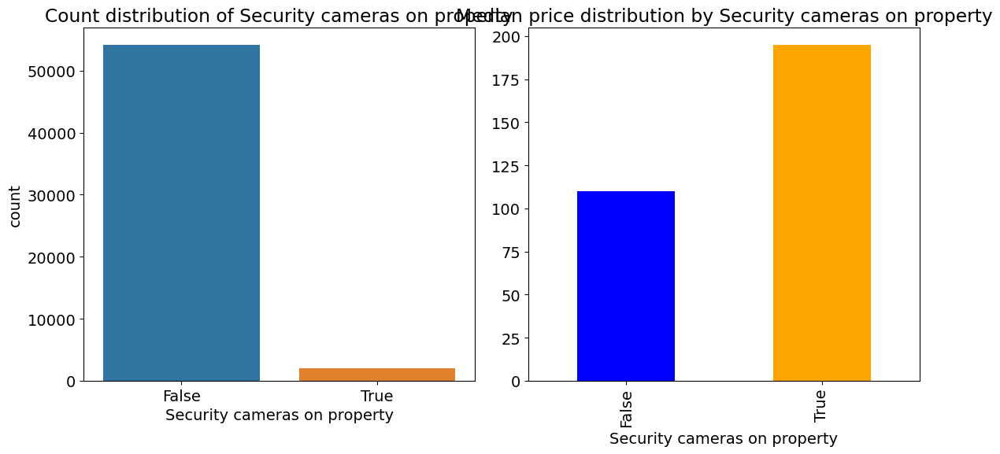

% Wise Split of Security cameras on property:
Security cameras on property
False    96.512601
True      3.487399
Name: proportion, dtype: float64

P-value for Security cameras on property: 0.006235125709688637
Security cameras on property is statistically significant (p-value < 0.05)


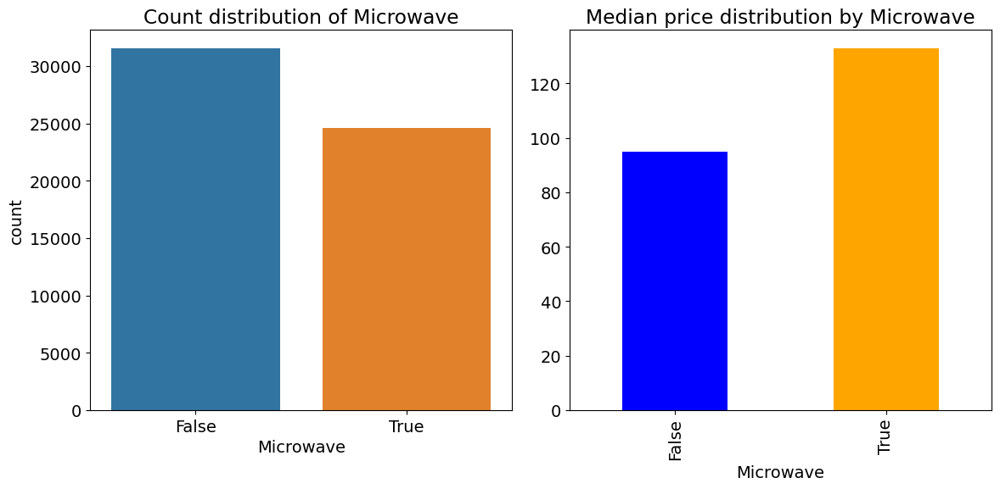

% Wise Split of Microwave:
Microwave
False    56.218719
True     43.781281
Name: proportion, dtype: float64

P-value for Microwave: 1.9990002741229567e-20
Microwave is statistically significant (p-value < 0.05)


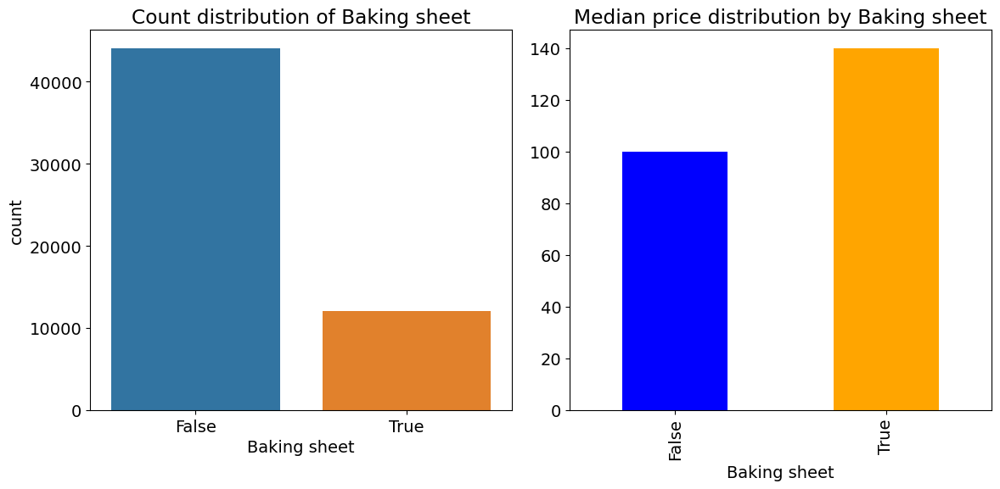

% Wise Split of Baking sheet:
Baking sheet
False    78.514561
True     21.485439
Name: proportion, dtype: float64

P-value for Baking sheet: 2.284196878018694e-05
Baking sheet is statistically significant (p-value < 0.05)


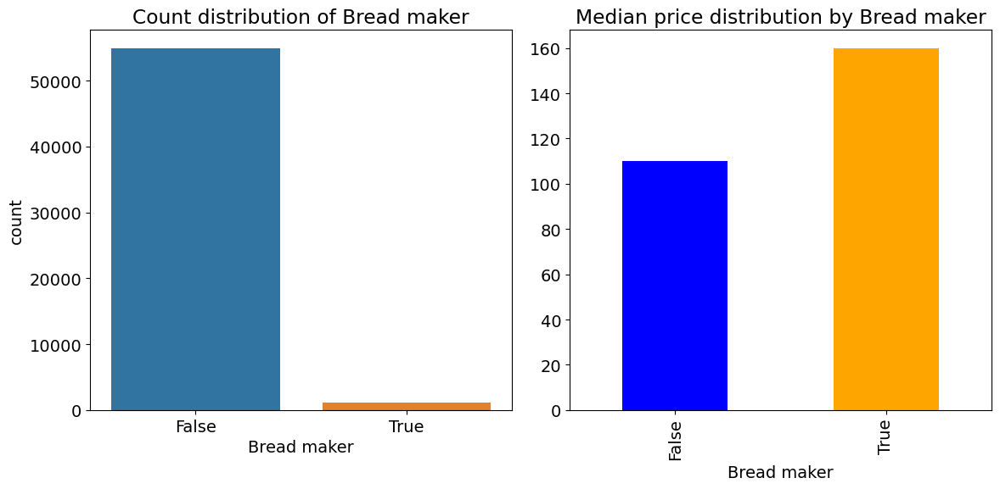

% Wise Split of Bread maker:
Bread maker
False    97.86802
True      2.13198
Name: proportion, dtype: float64

P-value for Bread maker: 1.4617157642972297e-07
Bread maker is statistically significant (p-value < 0.05)


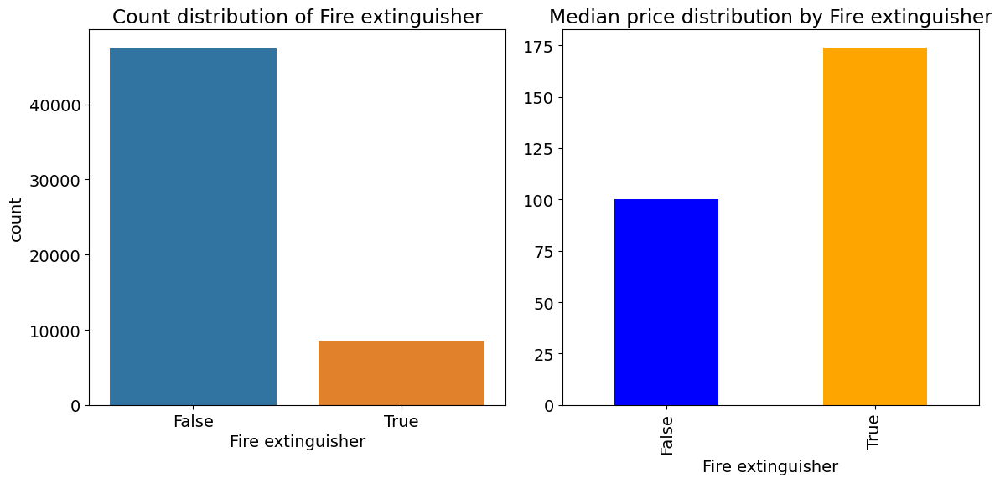

% Wise Split of Fire extinguisher:
Fire extinguisher
False    84.691424
True     15.308576
Name: proportion, dtype: float64

P-value for Fire extinguisher: 4.587653472794238e-16
Fire extinguisher is statistically significant (p-value < 0.05)


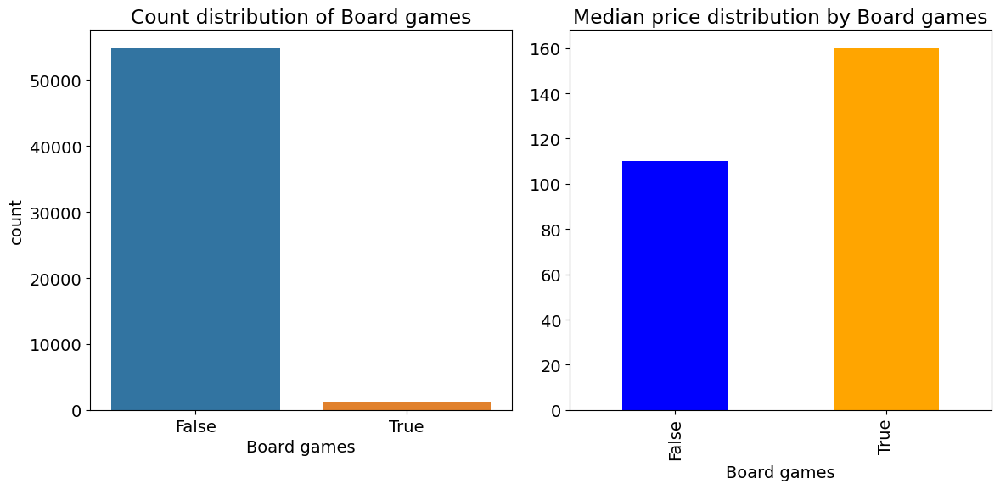

% Wise Split of Board games:
Board games
False    97.663194
True      2.336806
Name: proportion, dtype: float64

P-value for Board games: 7.737904411652124e-10
Board games is statistically significant (p-value < 0.05)


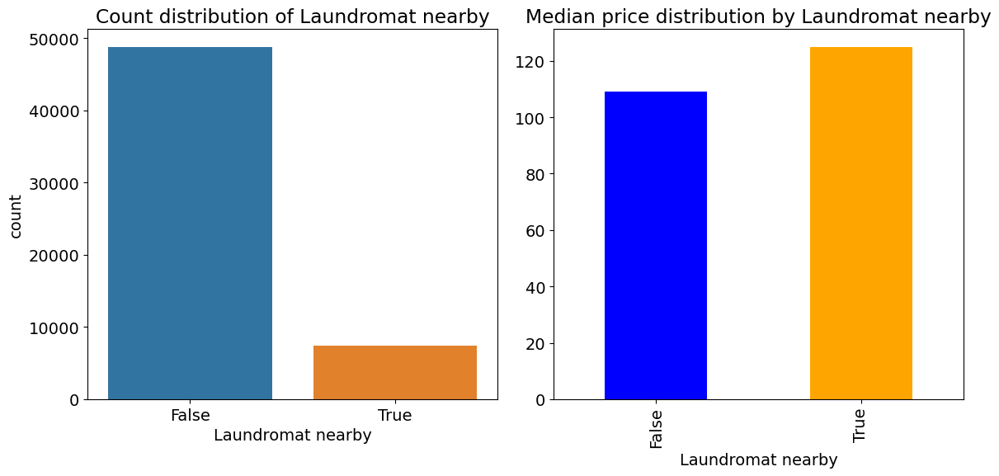

% Wise Split of Laundromat nearby:
Laundromat nearby
False    86.901772
True     13.098228
Name: proportion, dtype: float64

P-value for Laundromat nearby: 0.24074240084722362
Laundromat nearby is not statistically significant (p-value >= 0.05)


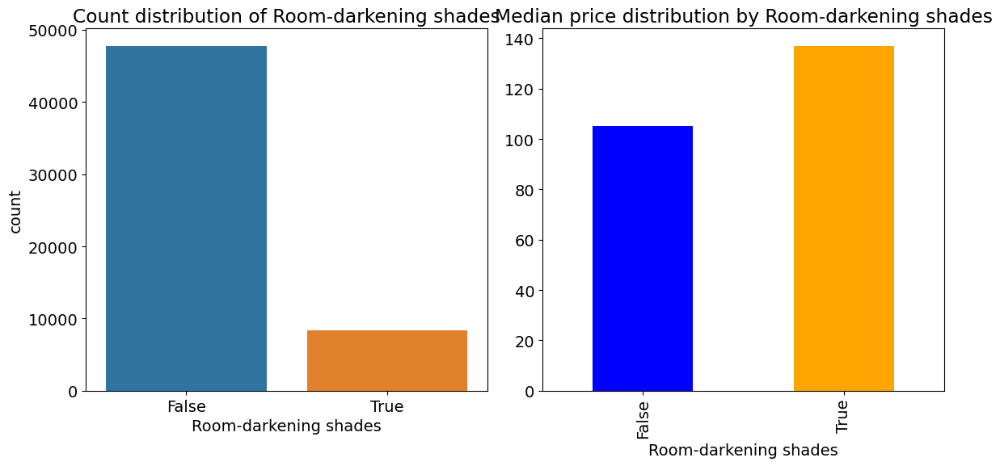

% Wise Split of Room-darkening shades:
Room-darkening shades
False    85.108202
True     14.891798
Name: proportion, dtype: float64

P-value for Room-darkening shades: 2.662362952222886e-06
Room-darkening shades is statistically significant (p-value < 0.05)


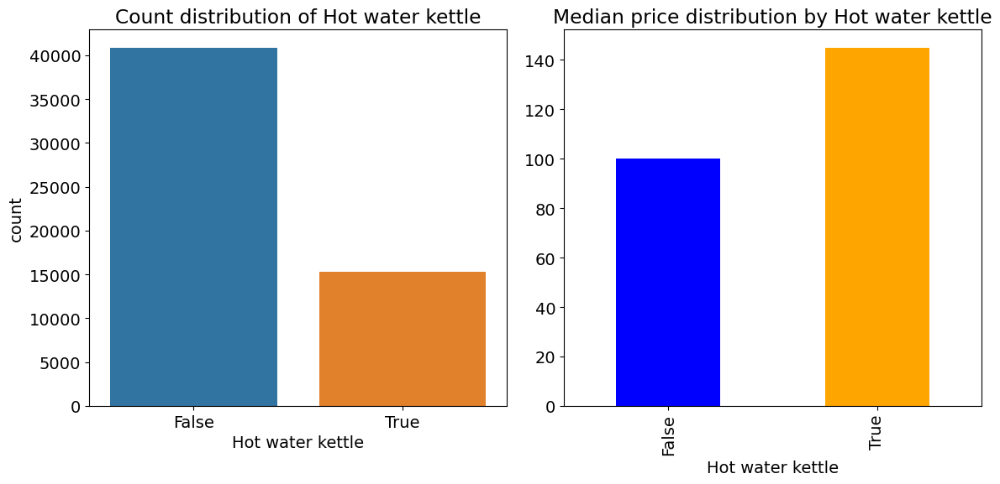

% Wise Split of Hot water kettle:
Hot water kettle
False    72.825719
True     27.174281
Name: proportion, dtype: float64

P-value for Hot water kettle: 3.910070086541569e-37
Hot water kettle is statistically significant (p-value < 0.05)


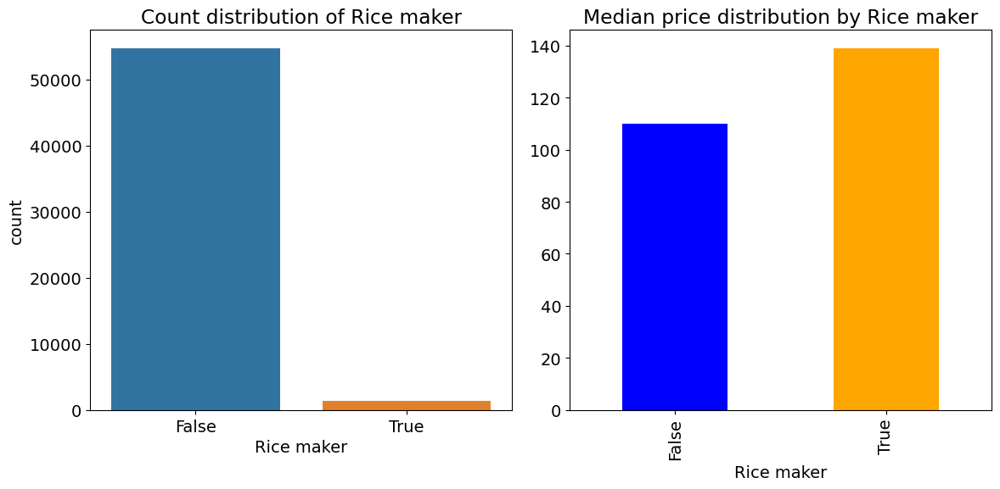

% Wise Split of Rice maker:
Rice maker
False    97.486864
True      2.513136
Name: proportion, dtype: float64

P-value for Rice maker: 0.0010542837277684822
Rice maker is statistically significant (p-value < 0.05)


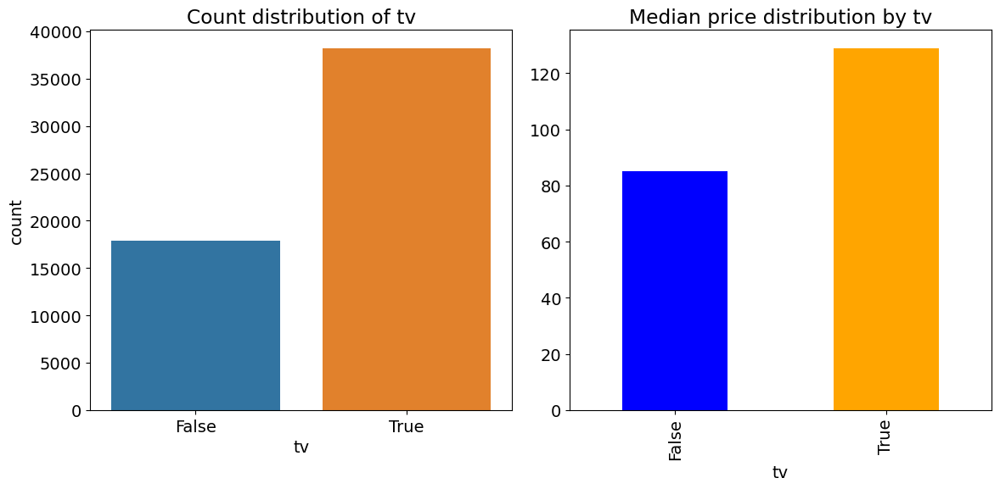

% Wise Split of tv:
tv
True     68.104016
False    31.895984
Name: proportion, dtype: float64

P-value for tv: 1.0288376609314735e-81
tv is statistically significant (p-value < 0.05)


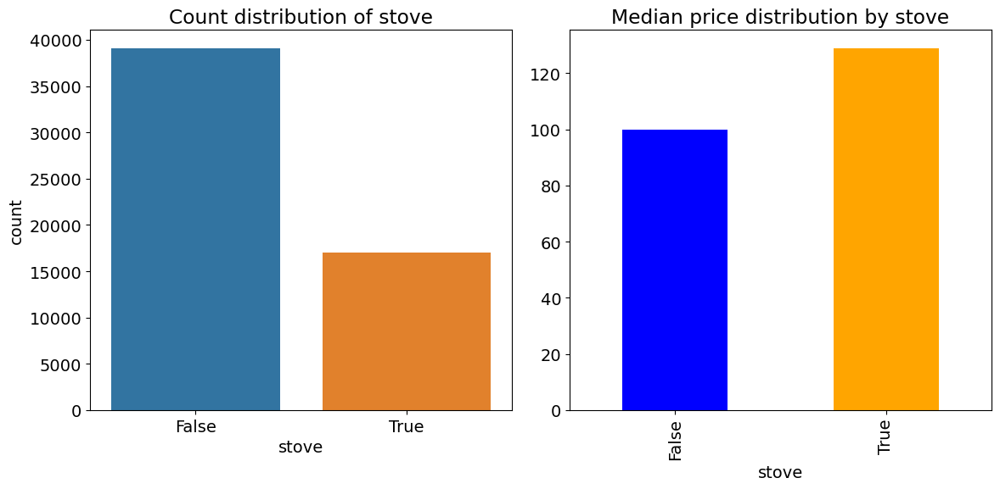

% Wise Split of stove:
stove
False    69.6607
True     30.3393
Name: proportion, dtype: float64

P-value for stove: 1.9473921991498516e-15
stove is statistically significant (p-value < 0.05)


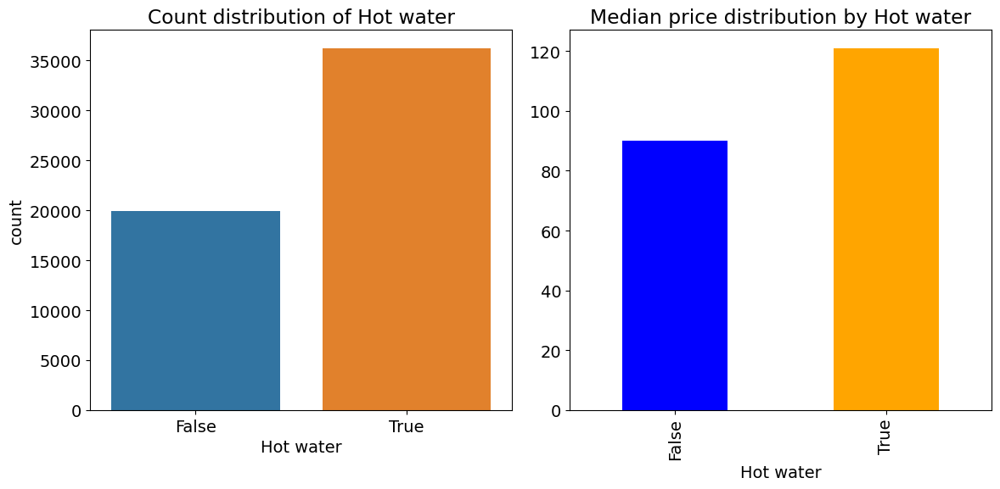

% Wise Split of Hot water:
Hot water
True     64.563185
False    35.436815
Name: proportion, dtype: float64

P-value for Hot water: 1.308591746044793e-16
Hot water is statistically significant (p-value < 0.05)


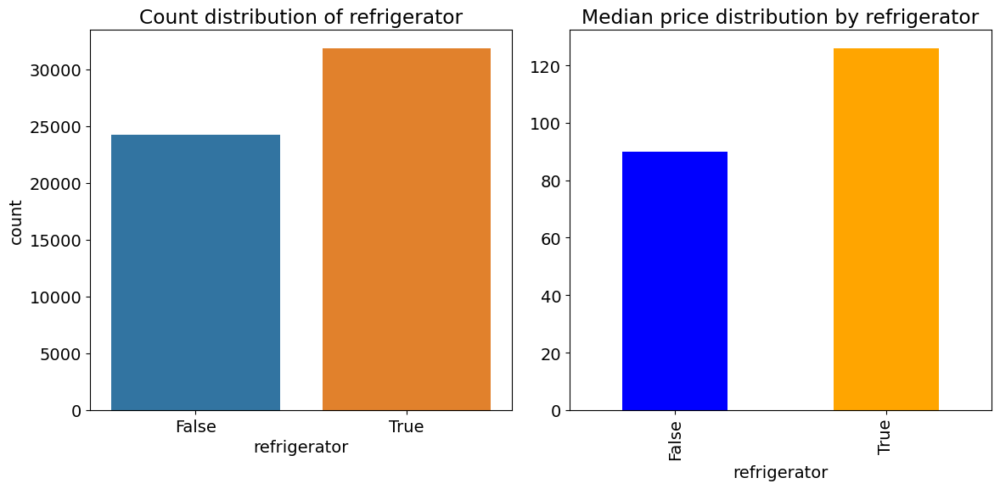

% Wise Split of refrigerator:
refrigerator
True     56.795797
False    43.204203
Name: proportion, dtype: float64

P-value for refrigerator: 8.24447082250088e-19
refrigerator is statistically significant (p-value < 0.05)


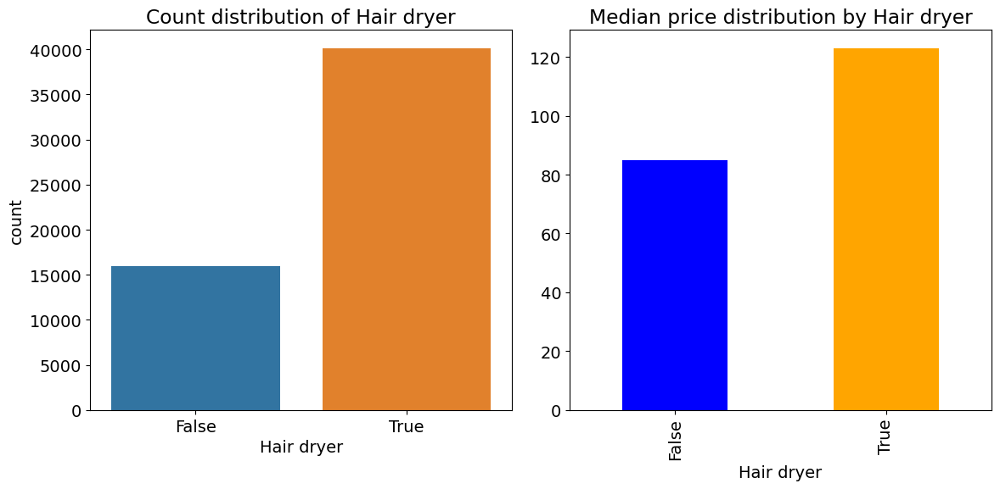

% Wise Split of Hair dryer:
Hair dryer
True     71.513047
False    28.486953
Name: proportion, dtype: float64

P-value for Hair dryer: 7.134425114705394e-18
Hair dryer is statistically significant (p-value < 0.05)


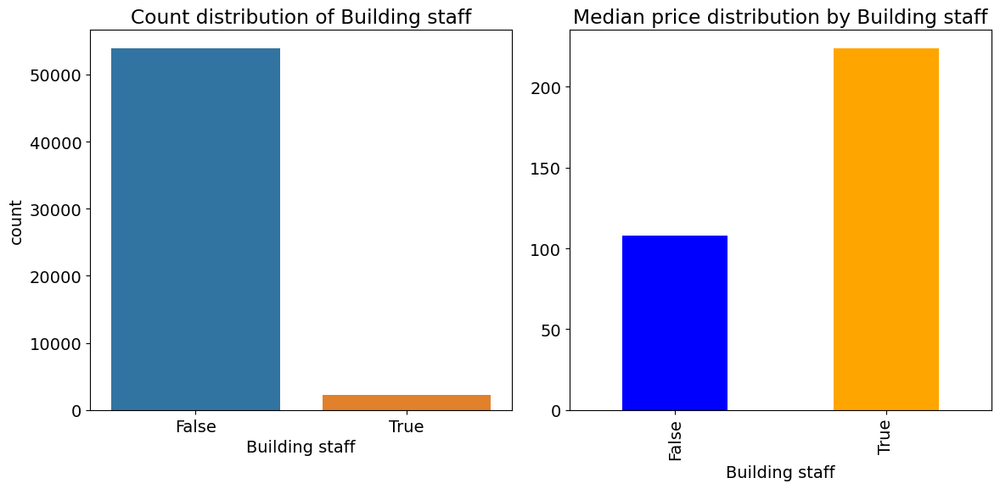

% Wise Split of Building staff:
Building staff
False    96.049515
True      3.950485
Name: proportion, dtype: float64

P-value for Building staff: 7.8587923871357e-55
Building staff is statistically significant (p-value < 0.05)


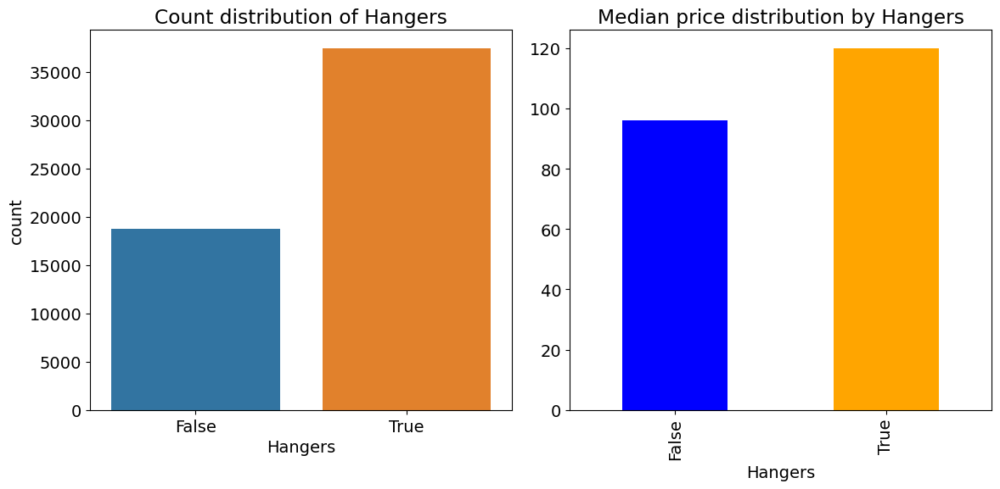

% Wise Split of Hangers:
Hangers
True     66.686259
False    33.313741
Name: proportion, dtype: float64

P-value for Hangers: 4.0429505489177095e-15
Hangers is statistically significant (p-value < 0.05)


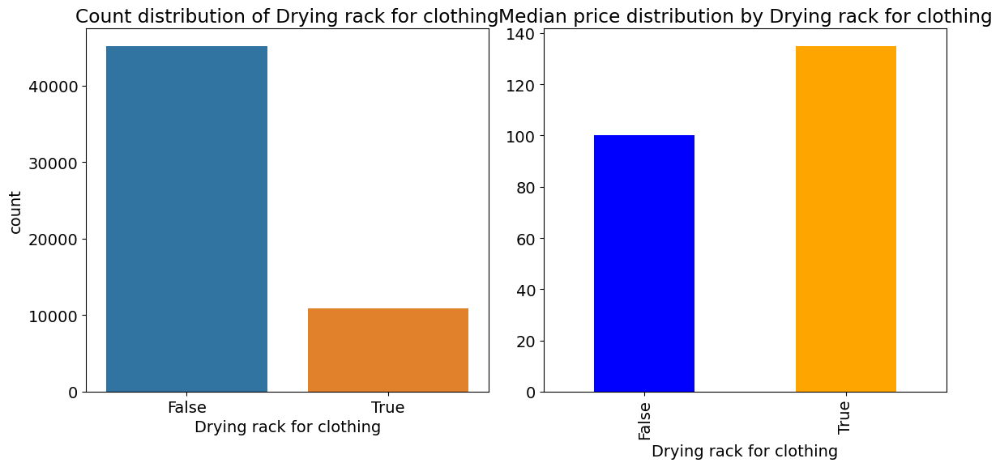

% Wise Split of Drying rack for clothing:
Drying rack for clothing
False    80.534331
True     19.465669
Name: proportion, dtype: float64

P-value for Drying rack for clothing: 0.0009240615833286796
Drying rack for clothing is statistically significant (p-value < 0.05)


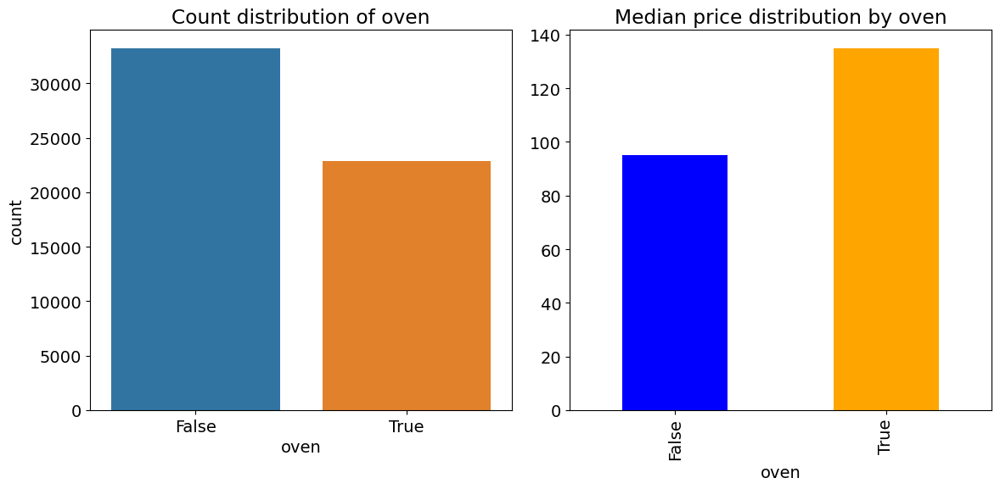

% Wise Split of oven:
oven
False    59.22522
True     40.77478
Name: proportion, dtype: float64

P-value for oven: 1.0986907105363464e-23
oven is statistically significant (p-value < 0.05)


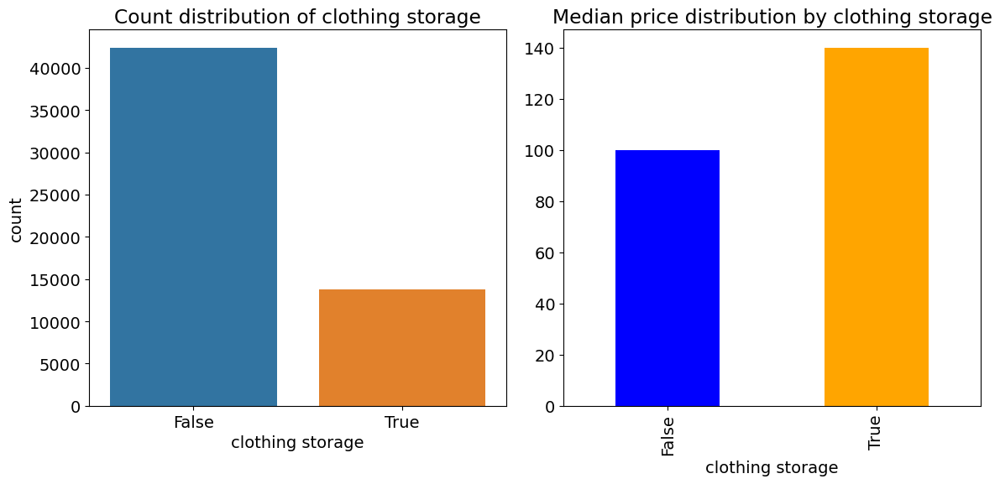

% Wise Split of clothing storage:
clothing storage
False    75.508059
True     24.491941
Name: proportion, dtype: float64

P-value for clothing storage: 9.562932825310735e-06
clothing storage is statistically significant (p-value < 0.05)


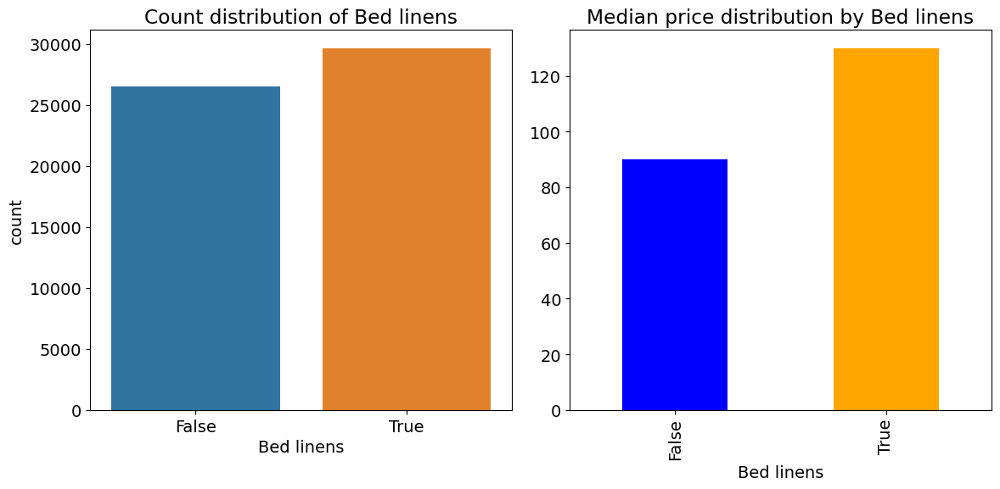

% Wise Split of Bed linens:
Bed linens
True     52.797221
False    47.202779
Name: proportion, dtype: float64

P-value for Bed linens: 2.0462284133287995e-32
Bed linens is statistically significant (p-value < 0.05)


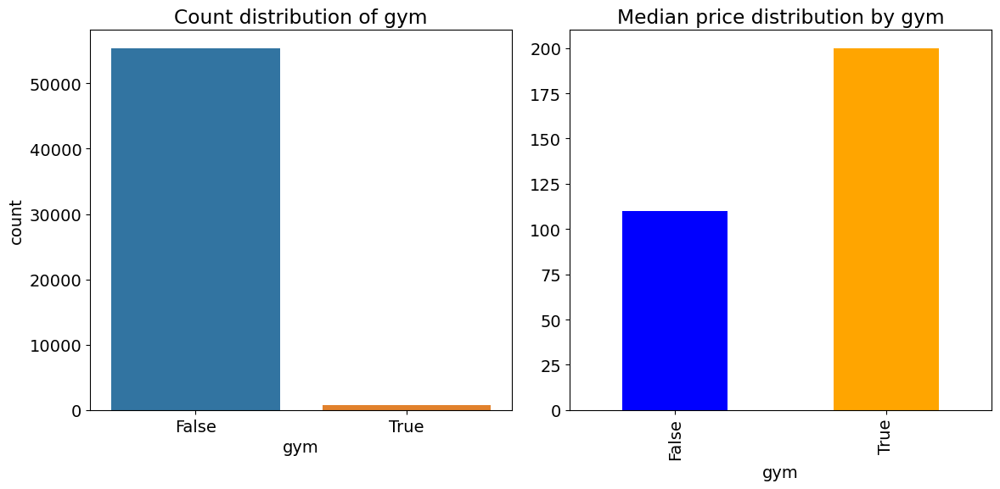

% Wise Split of gym:
gym
False    98.673079
True      1.326921
Name: proportion, dtype: float64

P-value for gym: 4.7051162794992026e-05
gym is statistically significant (p-value < 0.05)


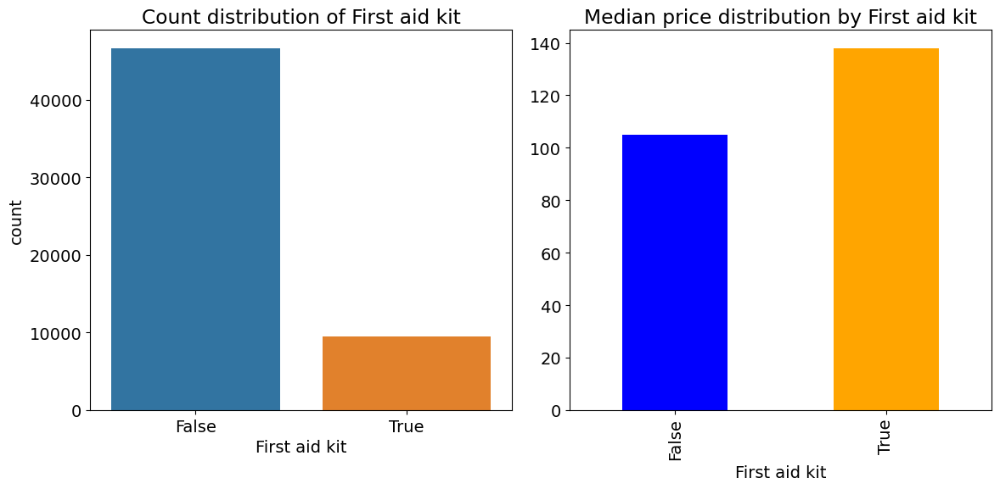

% Wise Split of First aid kit:
First aid kit
False    83.088432
True     16.911568
Name: proportion, dtype: float64

P-value for First aid kit: 7.359391261580907e-21
First aid kit is statistically significant (p-value < 0.05)


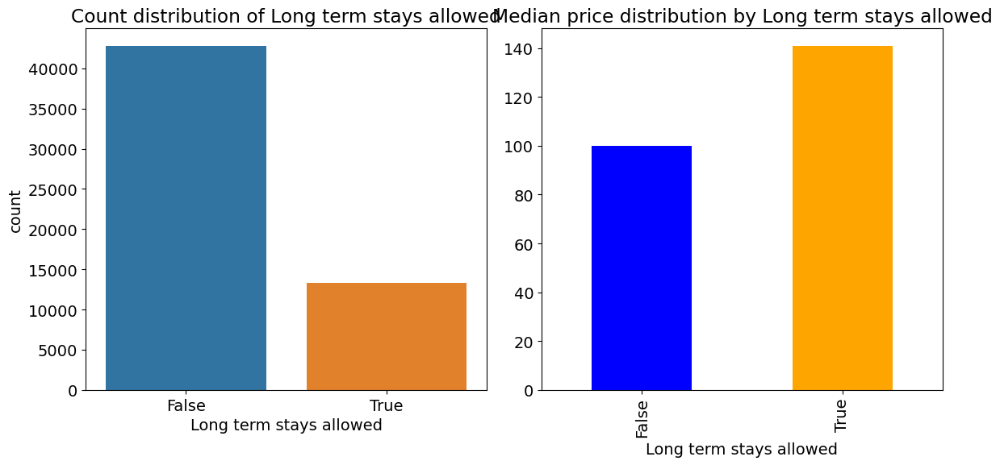

% Wise Split of Long term stays allowed:
Long term stays allowed
False    76.250779
True     23.749221
Name: proportion, dtype: float64

P-value for Long term stays allowed: 4.2322829367802614e-38
Long term stays allowed is statistically significant (p-value < 0.05)


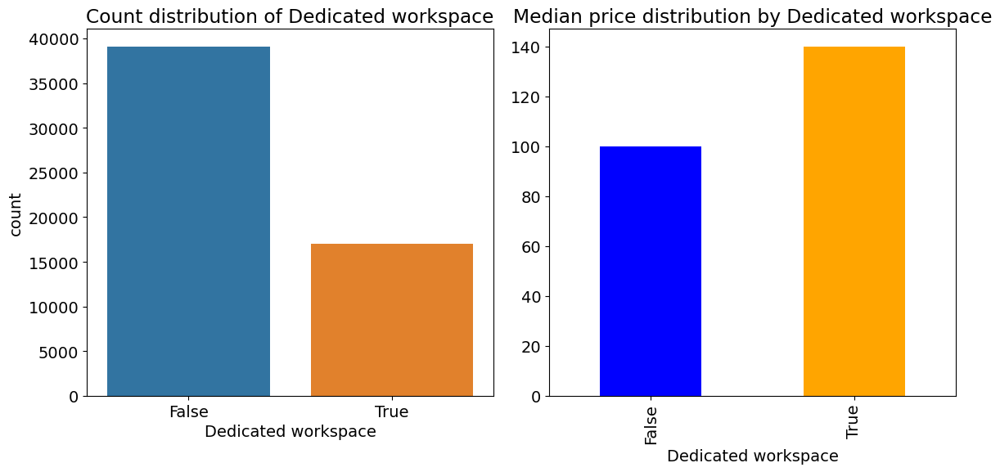

% Wise Split of Dedicated workspace:
Dedicated workspace
False    69.662481
True     30.337519
Name: proportion, dtype: float64

P-value for Dedicated workspace: 1.8876183601217595e-15
Dedicated workspace is statistically significant (p-value < 0.05)


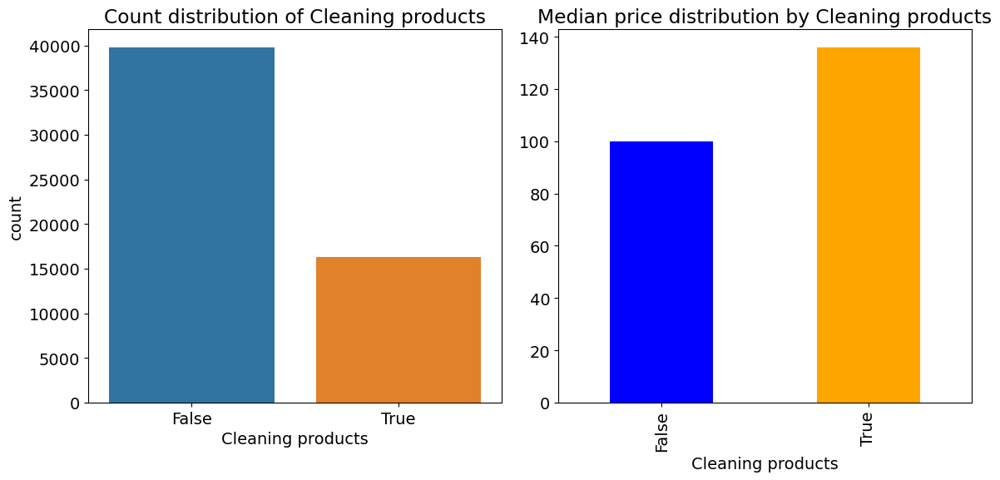

% Wise Split of Cleaning products:
Cleaning products
False    70.898566
True     29.101434
Name: proportion, dtype: float64

P-value for Cleaning products: 8.536785234785137e-14
Cleaning products is statistically significant (p-value < 0.05)


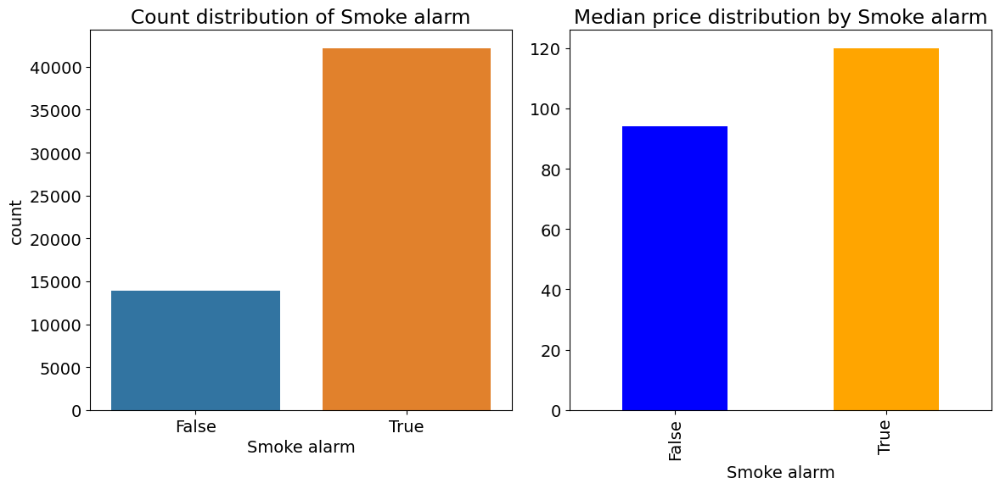

% Wise Split of Smoke alarm:
Smoke alarm
True     75.144715
False    24.855285
Name: proportion, dtype: float64

P-value for Smoke alarm: 6.128775908484004e-27
Smoke alarm is statistically significant (p-value < 0.05)


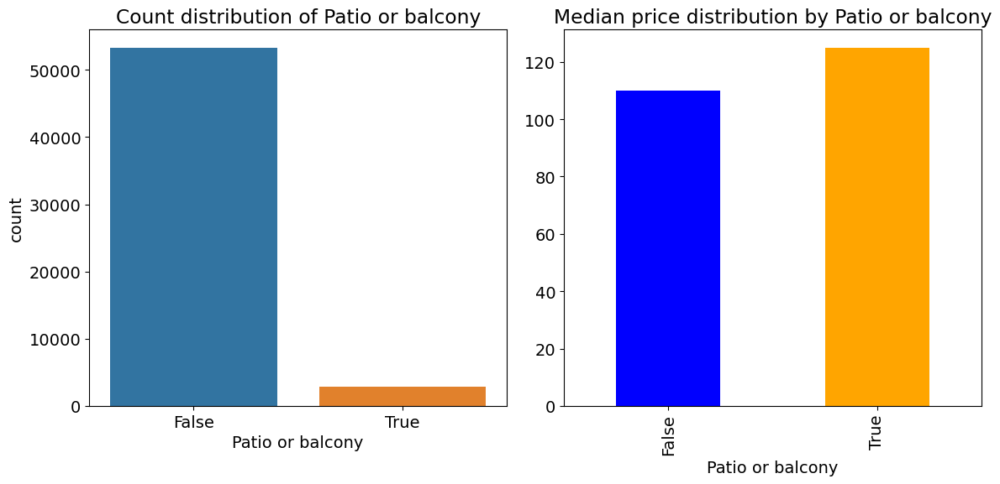

% Wise Split of Patio or balcony:
Patio or balcony
False    94.979072
True      5.020928
Name: proportion, dtype: float64

P-value for Patio or balcony: 0.010836078106840445
Patio or balcony is statistically significant (p-value < 0.05)


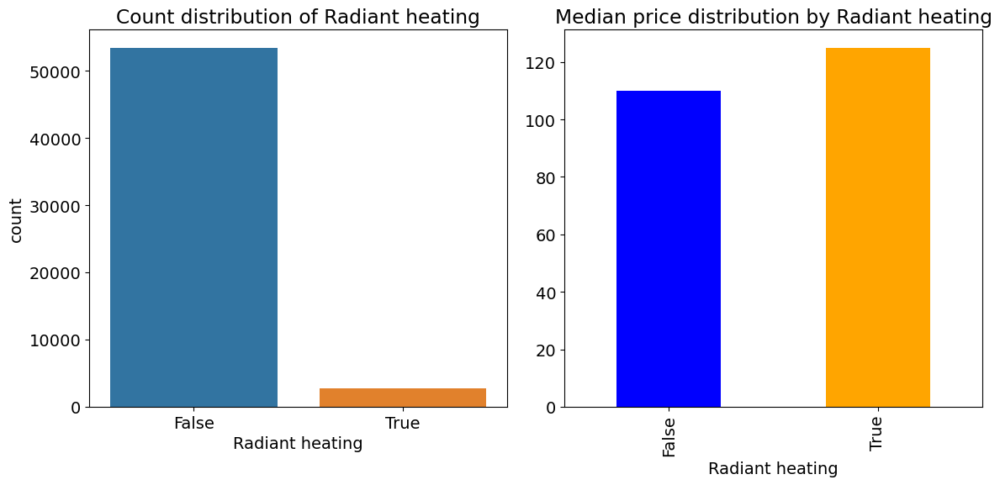

% Wise Split of Radiant heating:
Radiant heating
False    95.18568
True      4.81432
Name: proportion, dtype: float64

P-value for Radiant heating: 0.474507230360933
Radiant heating is not statistically significant (p-value >= 0.05)


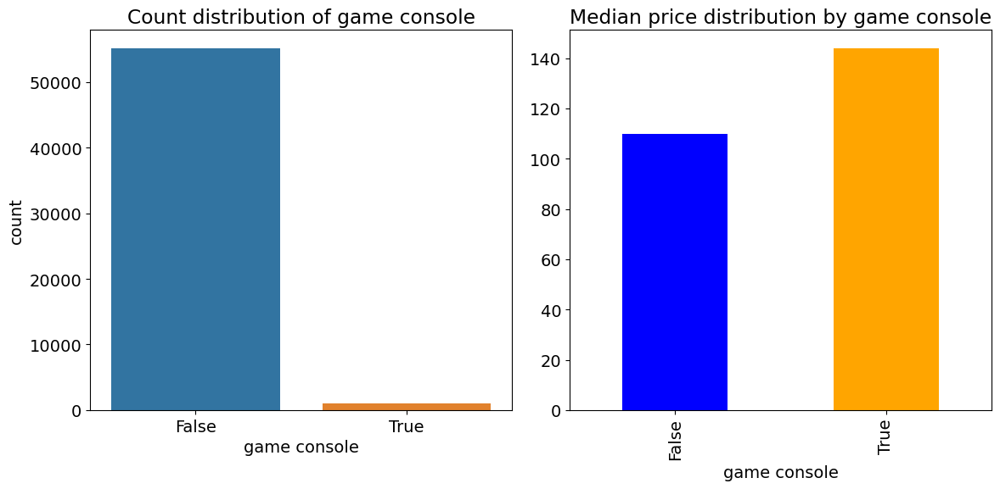

% Wise Split of game console:
game console
False    98.277674
True      1.722326
Name: proportion, dtype: float64

P-value for game console: 0.00435069118599086
game console is statistically significant (p-value < 0.05)


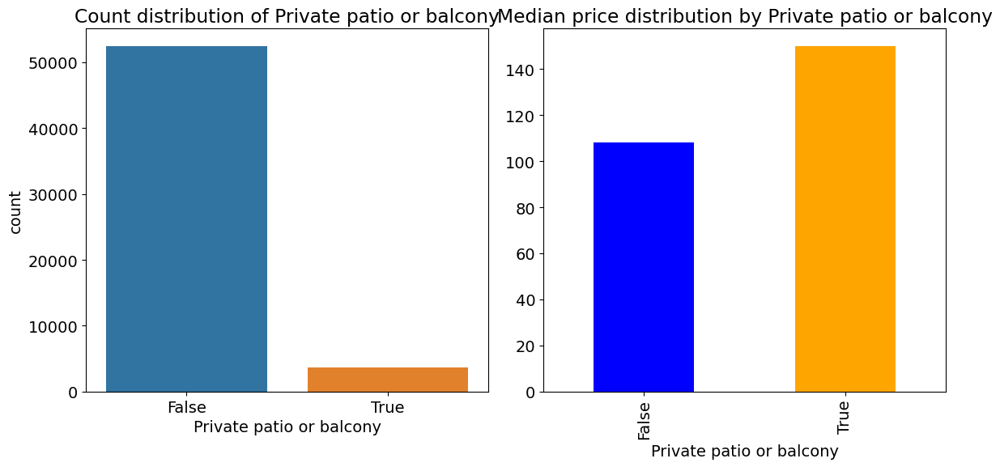

% Wise Split of Private patio or balcony:
Private patio or balcony
False    93.454448
True      6.545552
Name: proportion, dtype: float64

P-value for Private patio or balcony: 0.00010404853819276332
Private patio or balcony is statistically significant (p-value < 0.05)


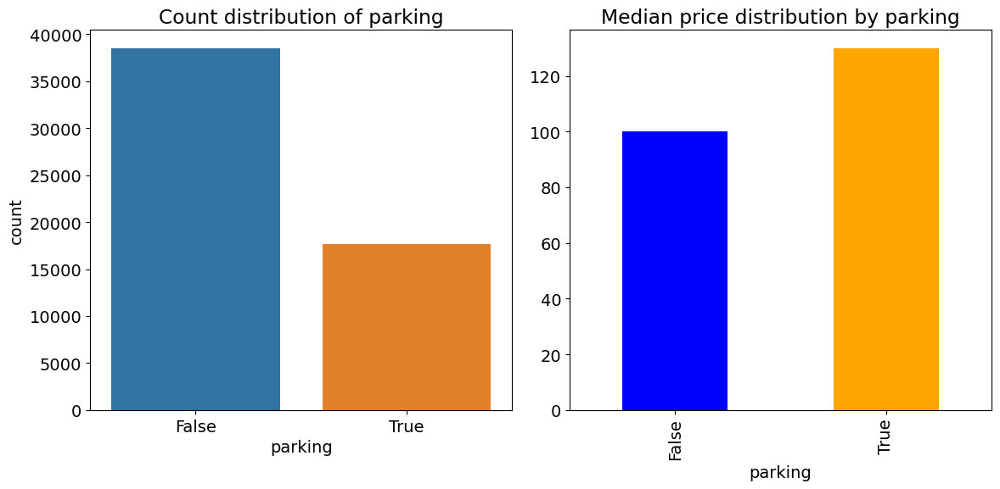

% Wise Split of parking:
parking
False    68.608068
True     31.391932
Name: proportion, dtype: float64

P-value for parking: 9.626640423698692e-09
parking is statistically significant (p-value < 0.05)


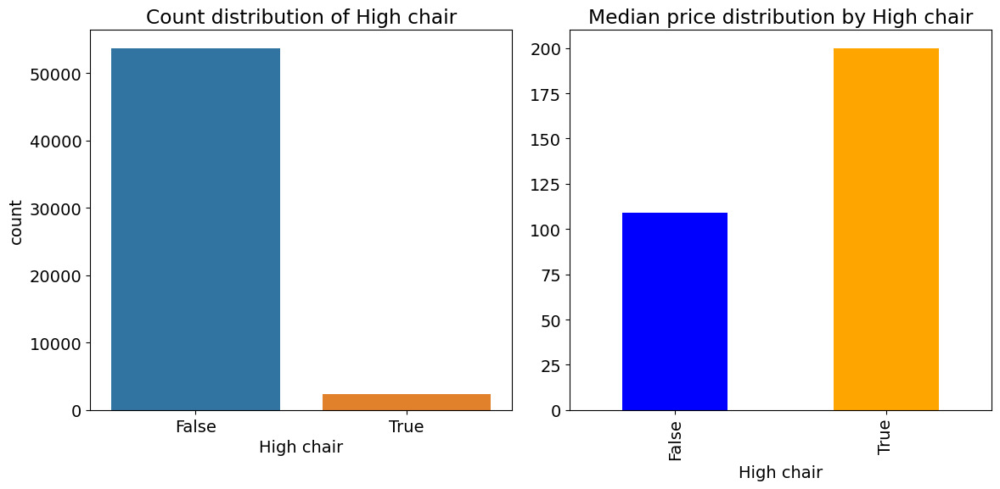

% Wise Split of High chair:
High chair
False    95.71823
True      4.28177
Name: proportion, dtype: float64

P-value for High chair: 3.4736235207329166e-57
High chair is statistically significant (p-value < 0.05)


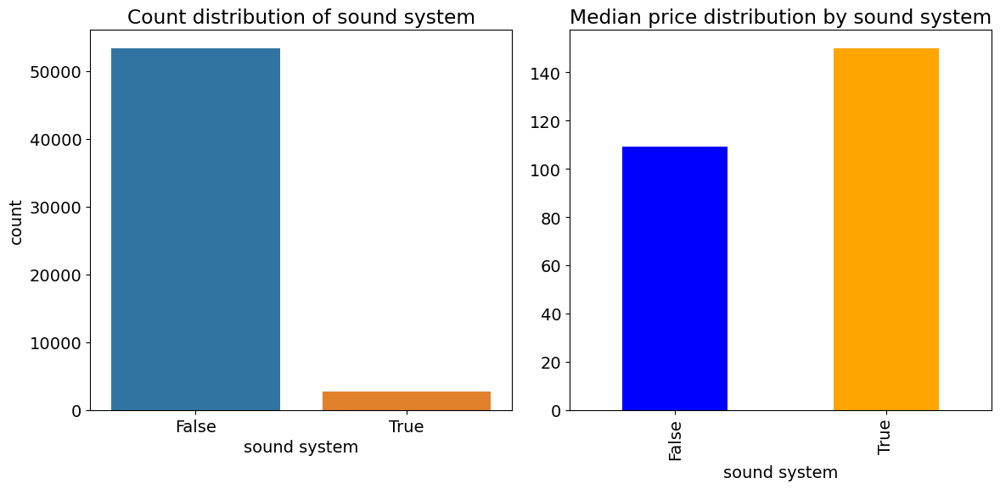

% Wise Split of sound system:
sound system
False    95.077033
True      4.922967
Name: proportion, dtype: float64

P-value for sound system: 1.3496766536334263e-18
sound system is statistically significant (p-value < 0.05)


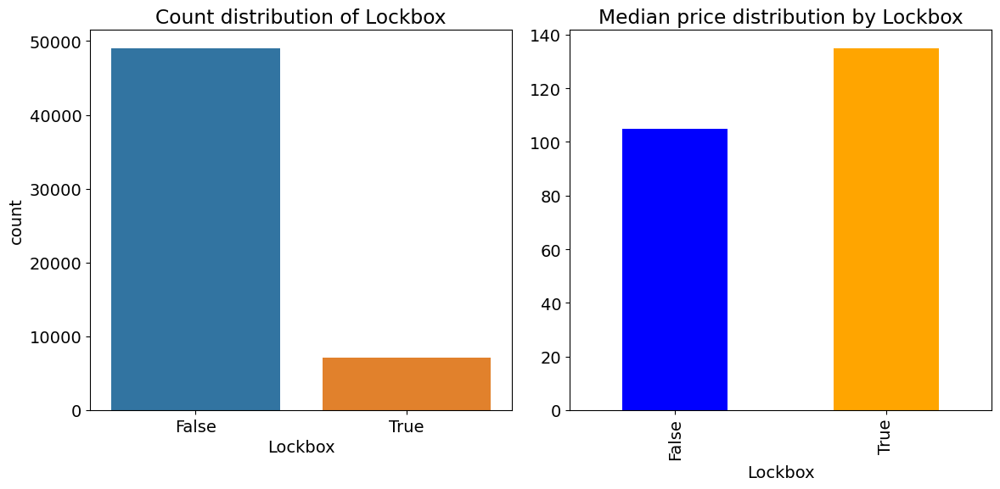

% Wise Split of Lockbox:
Lockbox
False    87.373764
True     12.626236
Name: proportion, dtype: float64

P-value for Lockbox: 0.07211452918962541
Lockbox is not statistically significant (p-value >= 0.05)


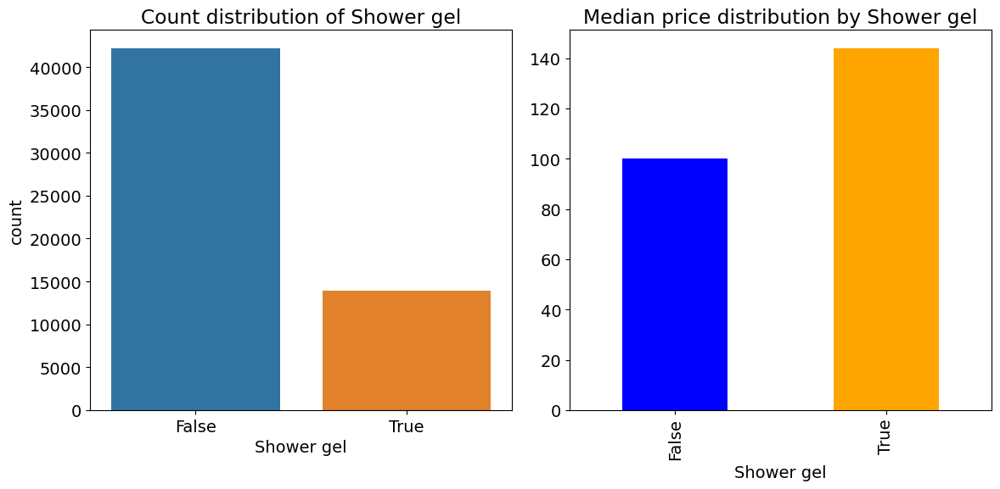

% Wise Split of Shower gel:
Shower gel
False    75.180337
True     24.819663
Name: proportion, dtype: float64

P-value for Shower gel: 1.5617159551306342e-21
Shower gel is statistically significant (p-value < 0.05)


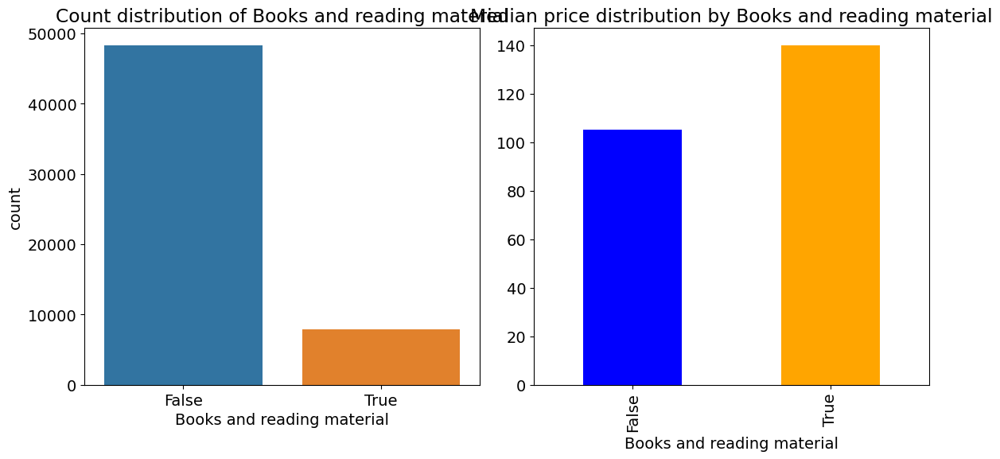

% Wise Split of Books and reading material:
Books and reading material
False    86.032594
True     13.967406
Name: proportion, dtype: float64

P-value for Books and reading material: 4.075152915857723e-06
Books and reading material is statistically significant (p-value < 0.05)


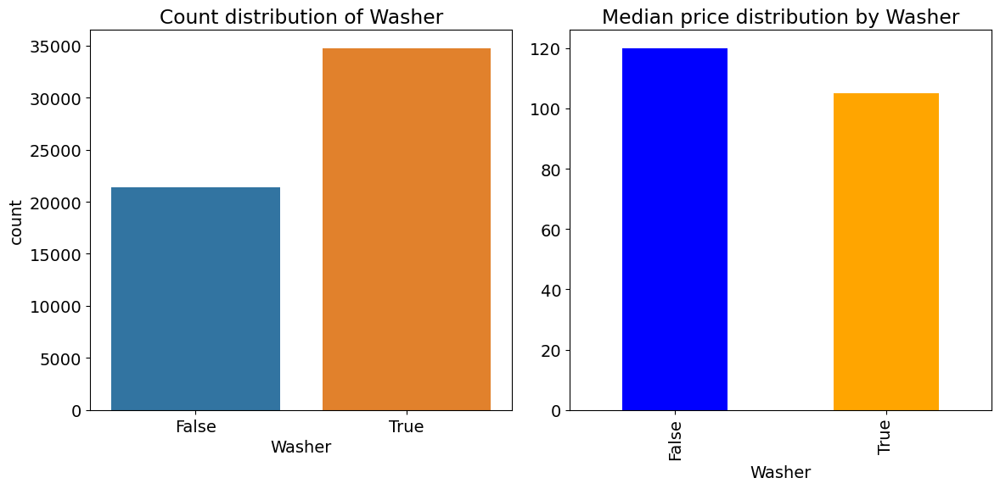

% Wise Split of Washer:
Washer
True     61.895093
False    38.104907
Name: proportion, dtype: float64

P-value for Washer: 0.002904696519932366
Washer is statistically significant (p-value < 0.05)


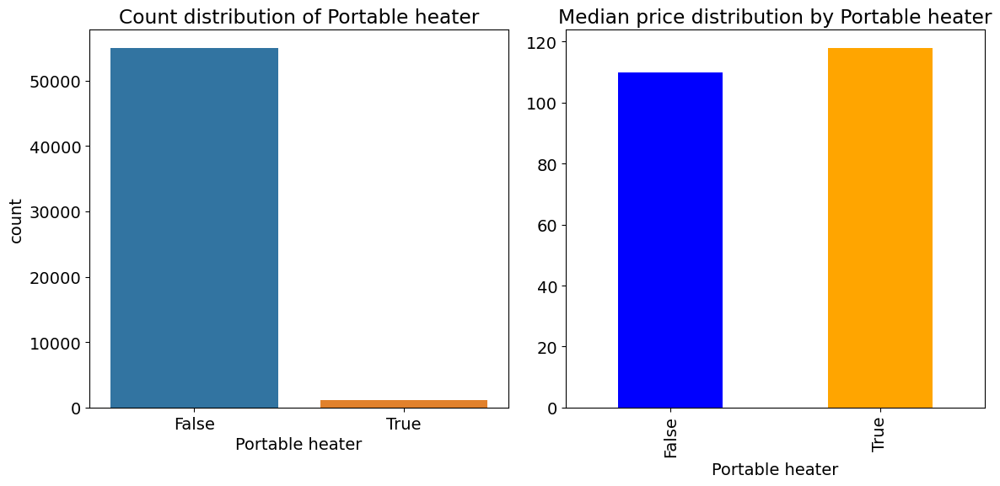

% Wise Split of Portable heater:
Portable heater
False    98.015852
True      1.984148
Name: proportion, dtype: float64

P-value for Portable heater: 0.0002321022482879007
Portable heater is statistically significant (p-value < 0.05)


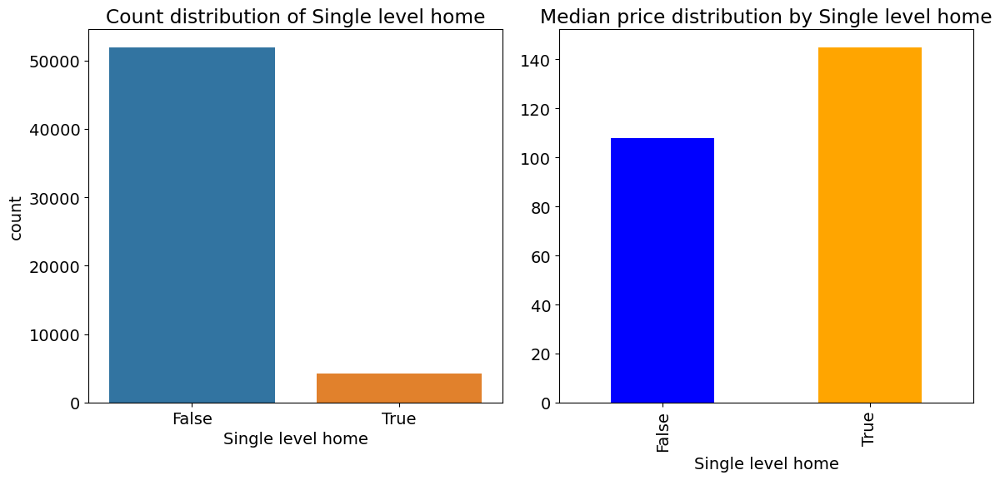

% Wise Split of Single level home:
Single level home
False    92.515807
True      7.484193
Name: proportion, dtype: float64

P-value for Single level home: 0.0004183520553593369
Single level home is statistically significant (p-value < 0.05)


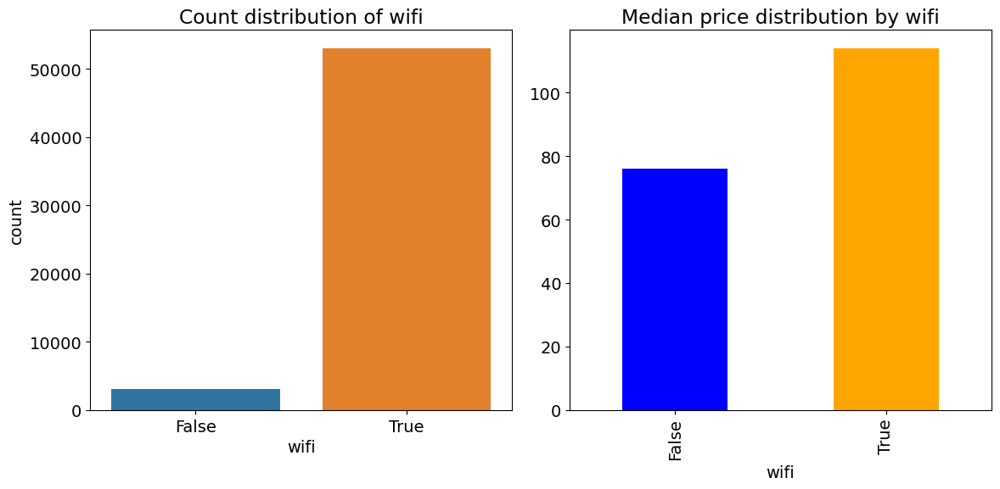

% Wise Split of wifi:
wifi
True     94.457209
False     5.542791
Name: proportion, dtype: float64

P-value for wifi: 1.455370650806455e-06
wifi is statistically significant (p-value < 0.05)


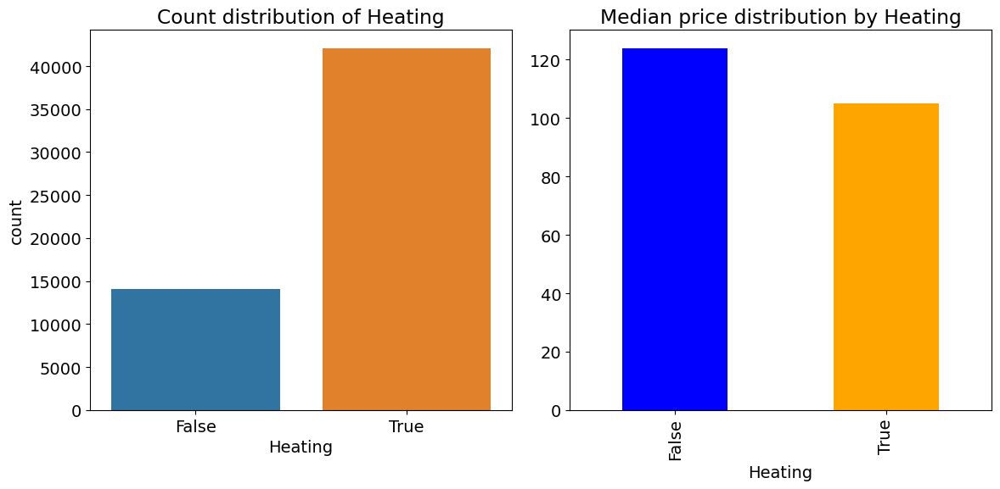

% Wise Split of Heating:
Heating
True     74.989759
False    25.010241
Name: proportion, dtype: float64

P-value for Heating: 5.994131417847994e-05
Heating is statistically significant (p-value < 0.05)


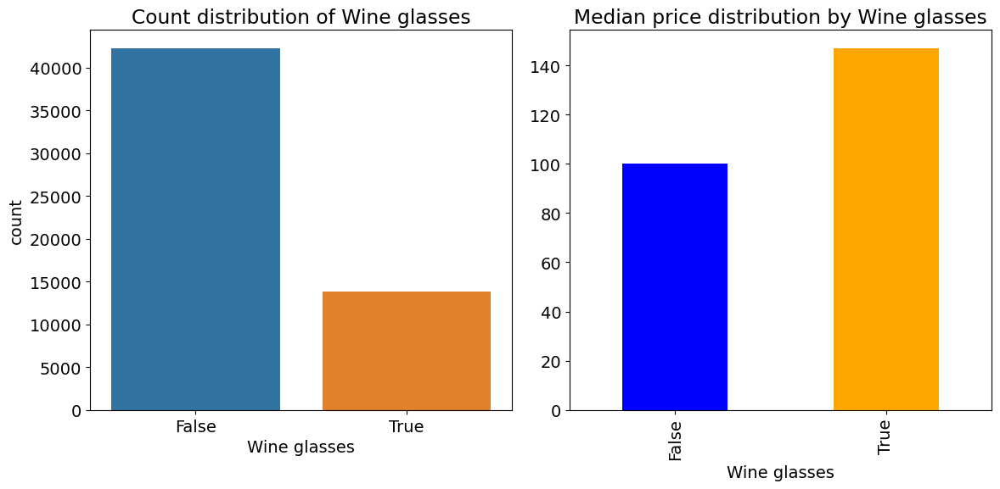

% Wise Split of Wine glasses:
Wine glasses
False    75.333511
True     24.666489
Name: proportion, dtype: float64

P-value for Wine glasses: 2.4214549024041373e-11
Wine glasses is statistically significant (p-value < 0.05)


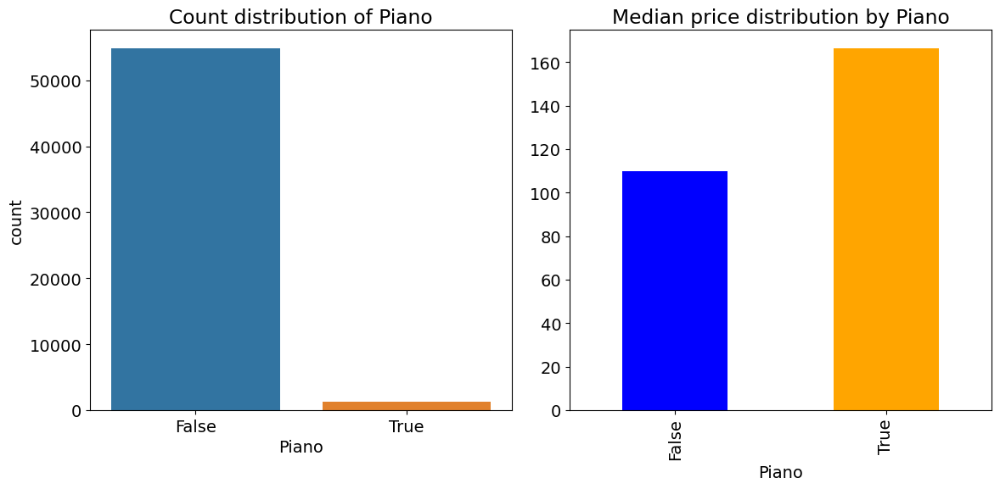

% Wise Split of Piano:
Piano
False    97.80212
True      2.19788
Name: proportion, dtype: float64

P-value for Piano: 0.020307062934956106
Piano is statistically significant (p-value < 0.05)


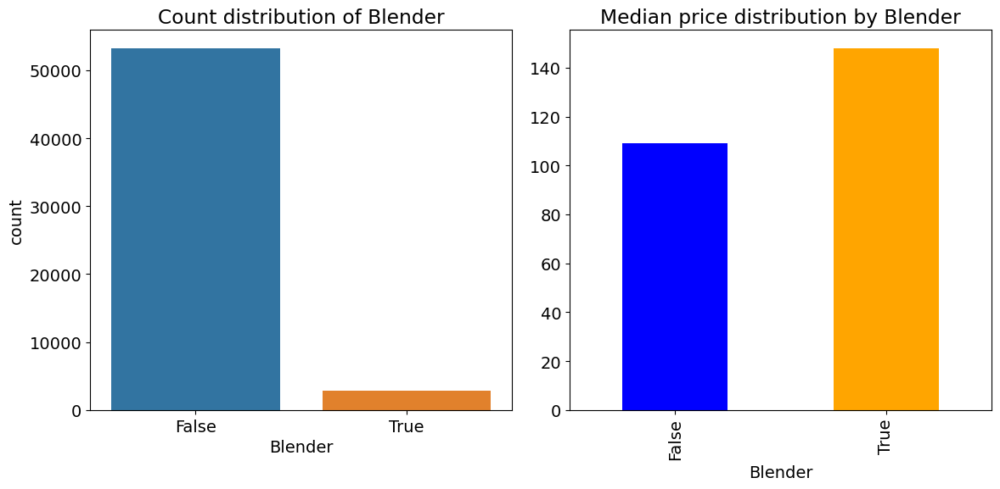

% Wise Split of Blender:
Blender
False    94.875768
True      5.124232
Name: proportion, dtype: float64

P-value for Blender: 4.4065396596092507e-08
Blender is statistically significant (p-value < 0.05)


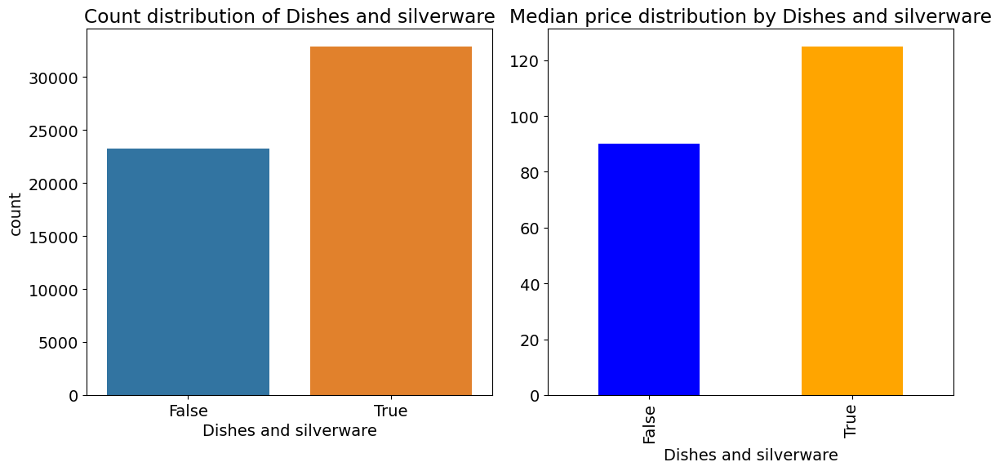

% Wise Split of Dishes and silverware:
Dishes and silverware
True     58.605397
False    41.394603
Name: proportion, dtype: float64

P-value for Dishes and silverware: 1.6371548317862082e-18
Dishes and silverware is statistically significant (p-value < 0.05)


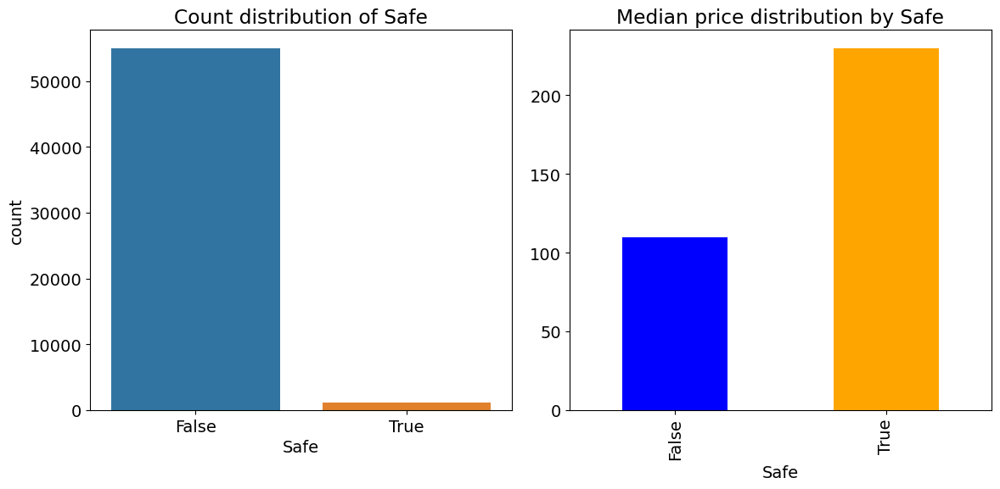

% Wise Split of Safe:
Safe
False    97.962419
True      2.037581
Name: proportion, dtype: float64

P-value for Safe: 0.004502594801129887
Safe is statistically significant (p-value < 0.05)


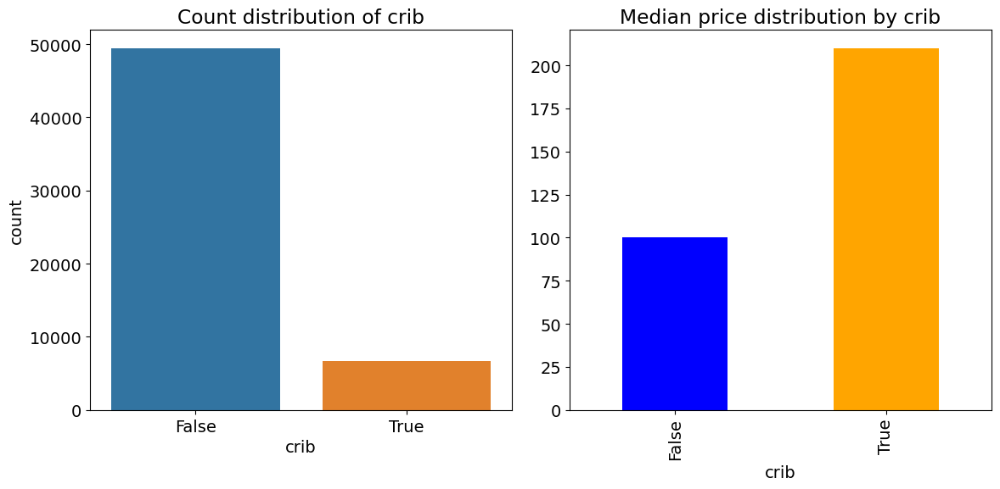

% Wise Split of crib:
crib
False    88.098673
True     11.901327
Name: proportion, dtype: float64

P-value for crib: 4.868592053858067e-128
crib is statistically significant (p-value < 0.05)


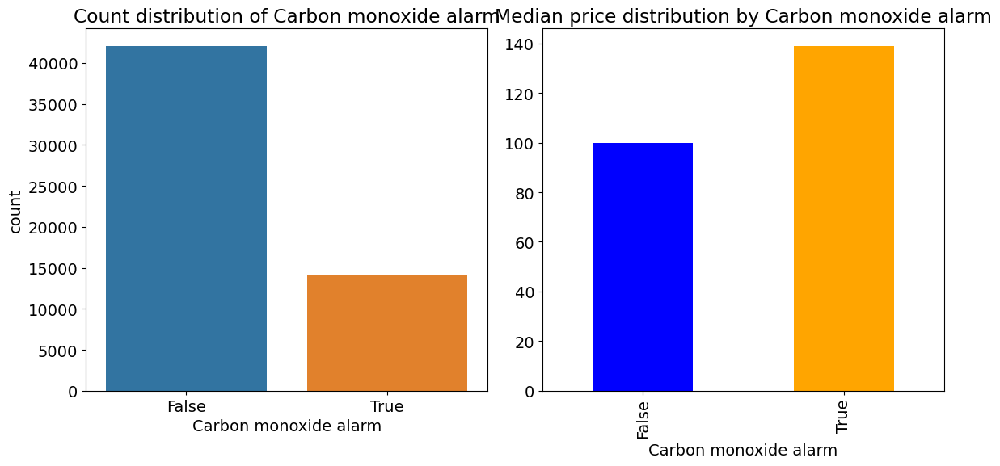

% Wise Split of Carbon monoxide alarm:
Carbon monoxide alarm
False    74.973729
True     25.026271
Name: proportion, dtype: float64

P-value for Carbon monoxide alarm: 2.6243168777214816e-42
Carbon monoxide alarm is statistically significant (p-value < 0.05)


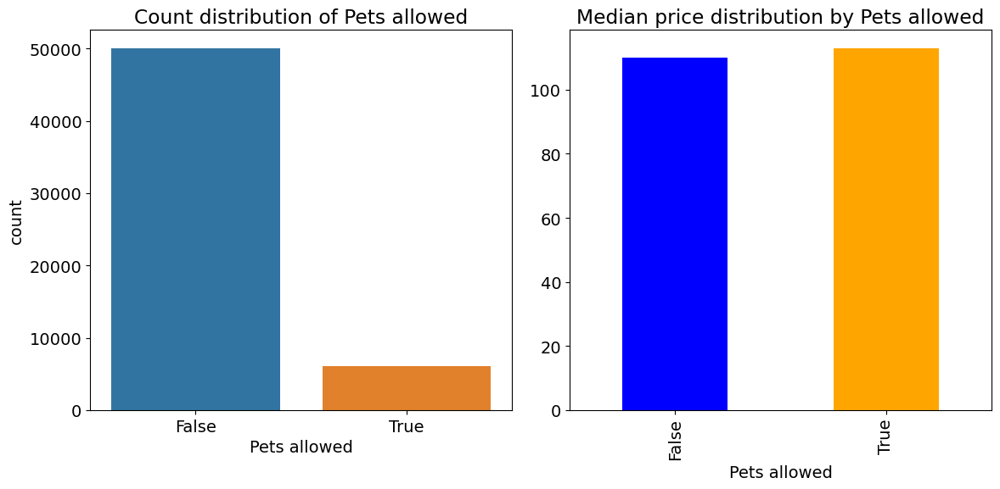

% Wise Split of Pets allowed:
Pets allowed
False    89.16021
True     10.83979
Name: proportion, dtype: float64

P-value for Pets allowed: 0.7447546462027204
Pets allowed is not statistically significant (p-value >= 0.05)


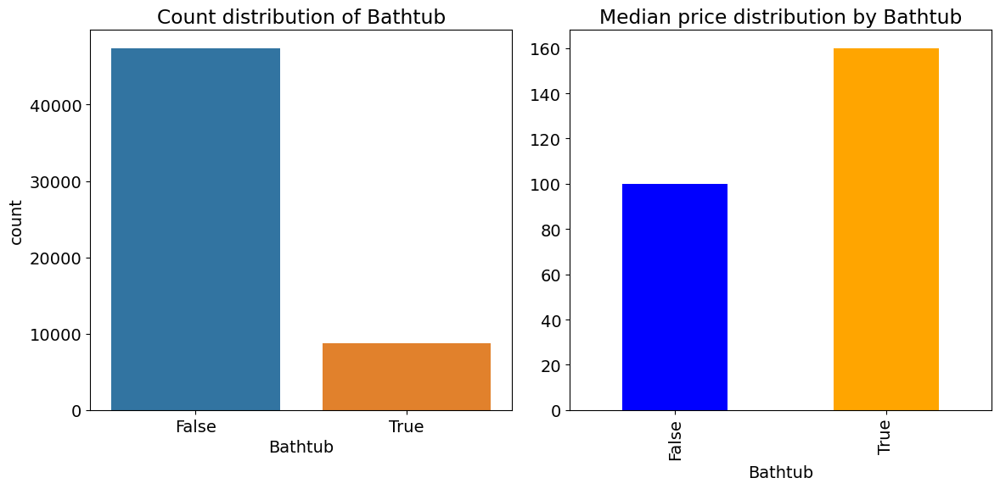

% Wise Split of Bathtub:
Bathtub
False    84.42604
True     15.57396
Name: proportion, dtype: float64

P-value for Bathtub: 7.146008444413113e-76
Bathtub is statistically significant (p-value < 0.05)


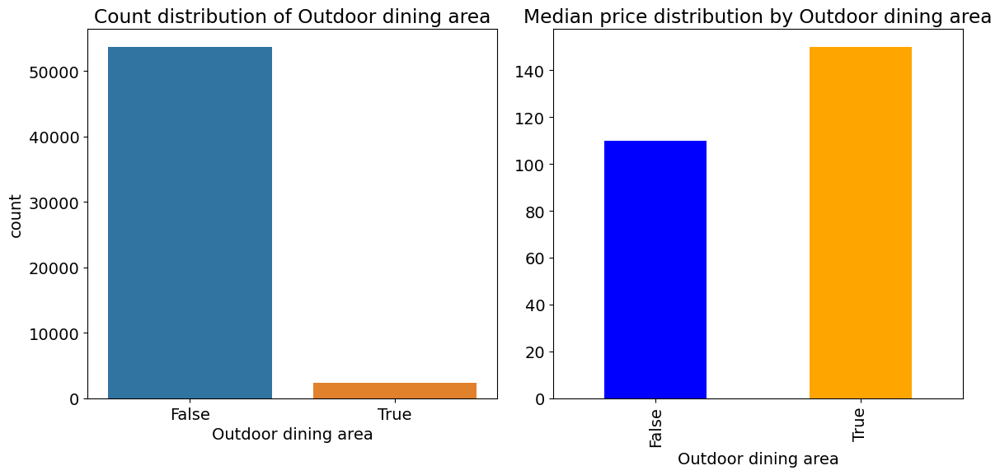

% Wise Split of Outdoor dining area:
Outdoor dining area
False    95.703981
True      4.296019
Name: proportion, dtype: float64

P-value for Outdoor dining area: 1.3227960367866807e-06
Outdoor dining area is statistically significant (p-value < 0.05)


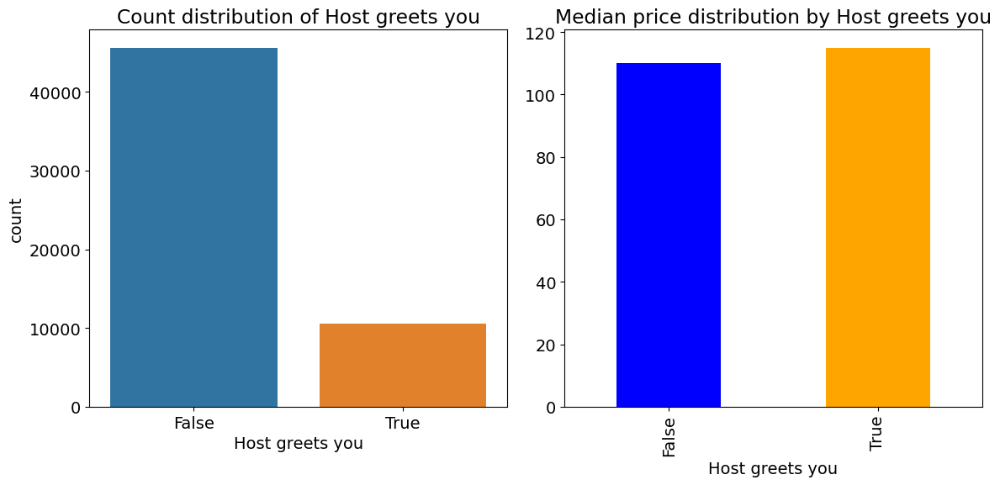

% Wise Split of Host greets you:
Host greets you
False    81.230742
True     18.769258
Name: proportion, dtype: float64

P-value for Host greets you: 1.1262473153826368e-08
Host greets you is statistically significant (p-value < 0.05)


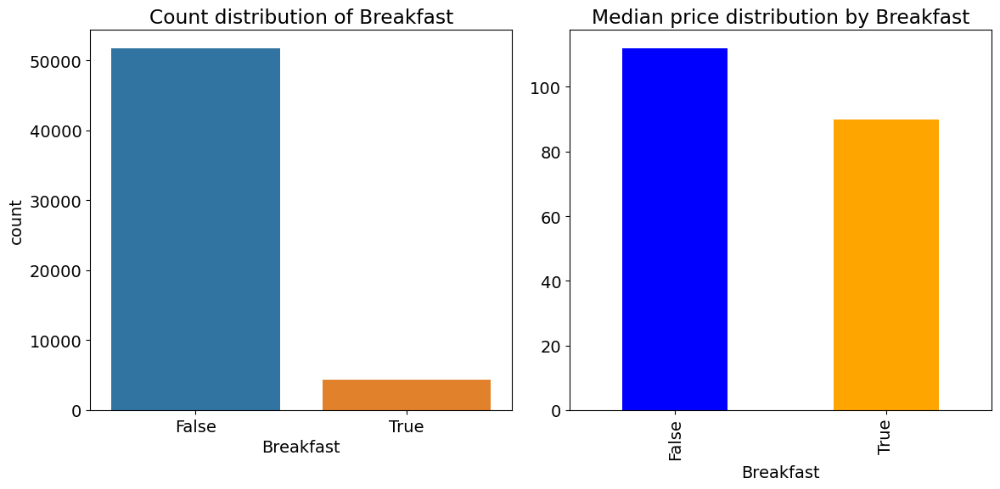

% Wise Split of Breakfast:
Breakfast
False    92.195209
True      7.804791
Name: proportion, dtype: float64

P-value for Breakfast: 3.7049287697068085e-08
Breakfast is statistically significant (p-value < 0.05)


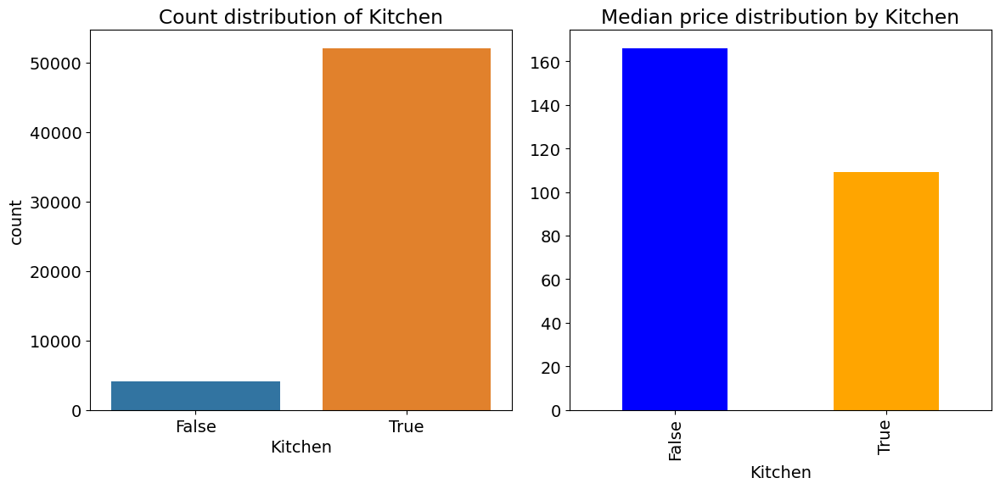

% Wise Split of Kitchen:
Kitchen
True     92.71351
False     7.28649
Name: proportion, dtype: float64

P-value for Kitchen: 2.151086656535814e-20
Kitchen is statistically significant (p-value < 0.05)


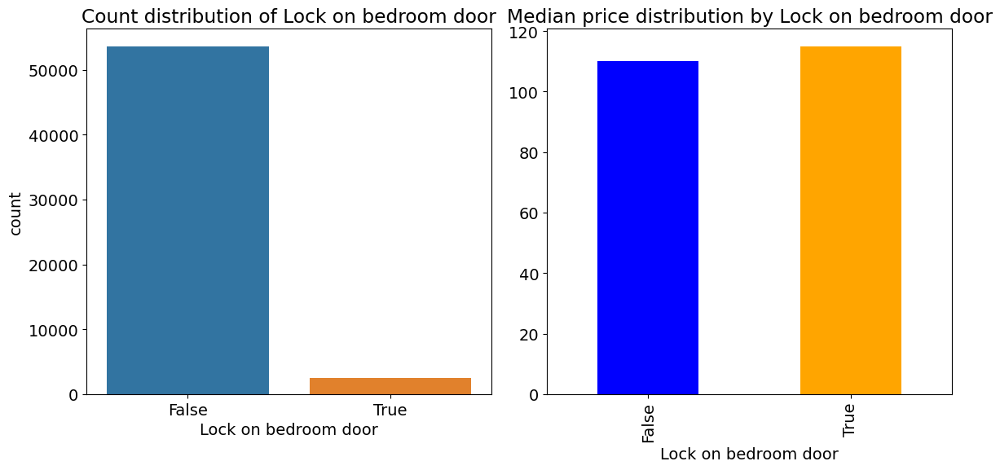

% Wise Split of Lock on bedroom door:
Lock on bedroom door
False    95.511622
True      4.488378
Name: proportion, dtype: float64

P-value for Lock on bedroom door: 0.0320378937628246
Lock on bedroom door is statistically significant (p-value < 0.05)


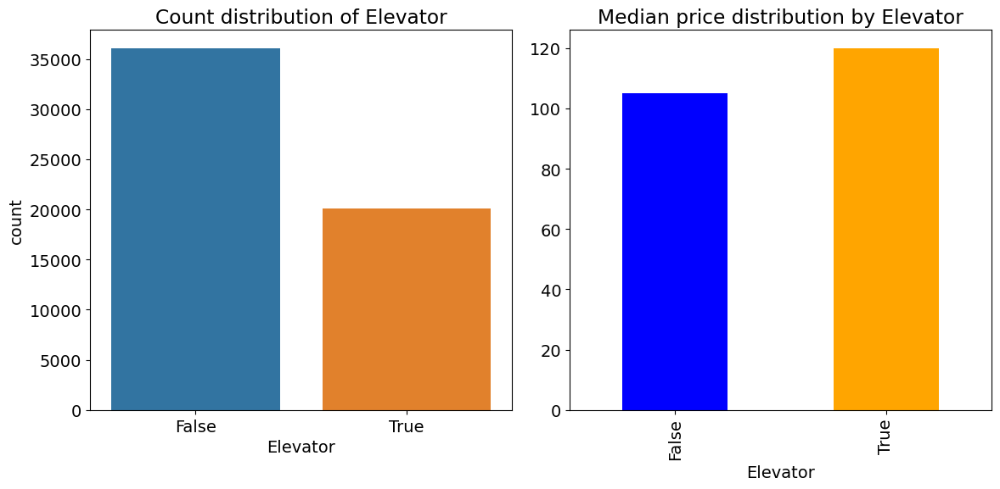

% Wise Split of Elevator:
Elevator
False    64.28177
True     35.71823
Name: proportion, dtype: float64

P-value for Elevator: 0.00011211619257469524
Elevator is statistically significant (p-value < 0.05)


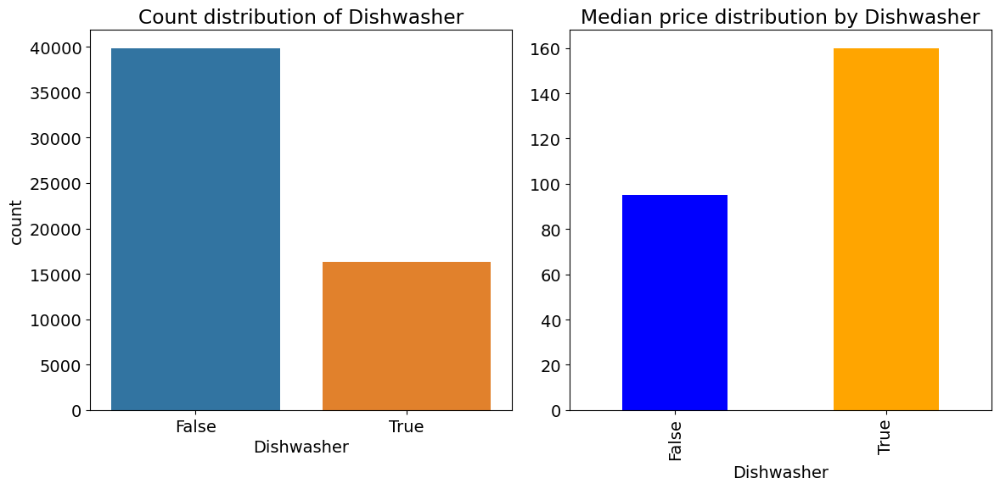

% Wise Split of Dishwasher:
Dishwasher
False    71.007213
True     28.992787
Name: proportion, dtype: float64

P-value for Dishwasher: 2.0515196438413865e-60
Dishwasher is statistically significant (p-value < 0.05)


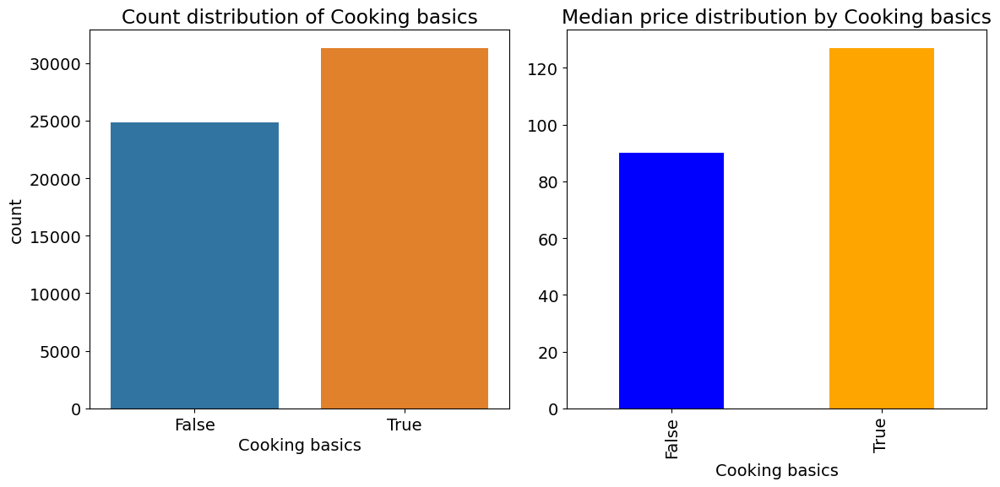

% Wise Split of Cooking basics:
Cooking basics
True     55.777006
False    44.222994
Name: proportion, dtype: float64

P-value for Cooking basics: 8.986664016892641e-13
Cooking basics is statistically significant (p-value < 0.05)


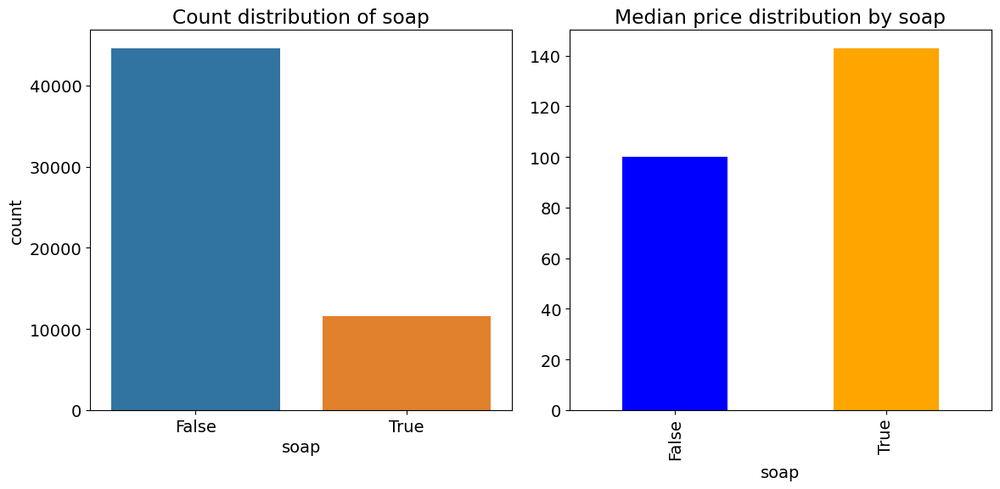

% Wise Split of soap:
soap
False    79.46745
True     20.53255
Name: proportion, dtype: float64

P-value for soap: 1.3239077985950572e-07
soap is statistically significant (p-value < 0.05)


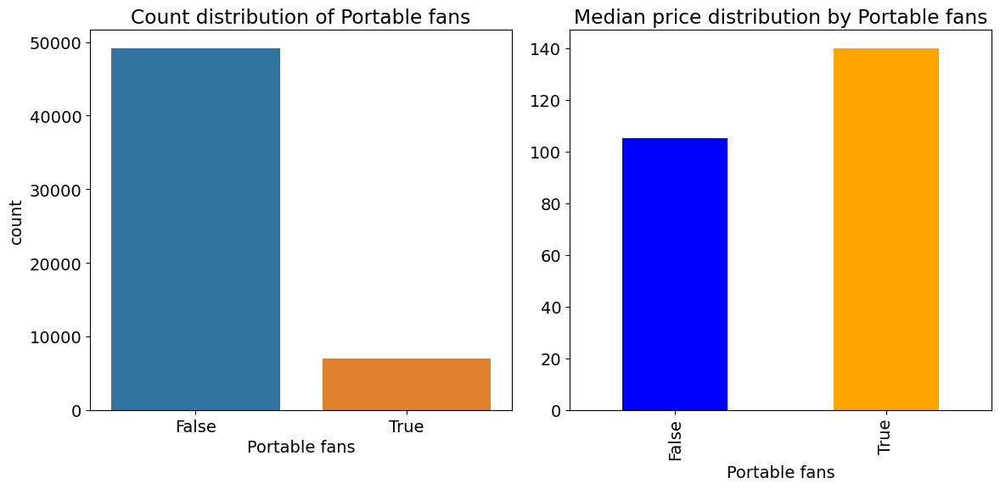

% Wise Split of Portable fans:
Portable fans
False    87.583934
True     12.416066
Name: proportion, dtype: float64

P-value for Portable fans: 0.0005713973707163493
Portable fans is statistically significant (p-value < 0.05)


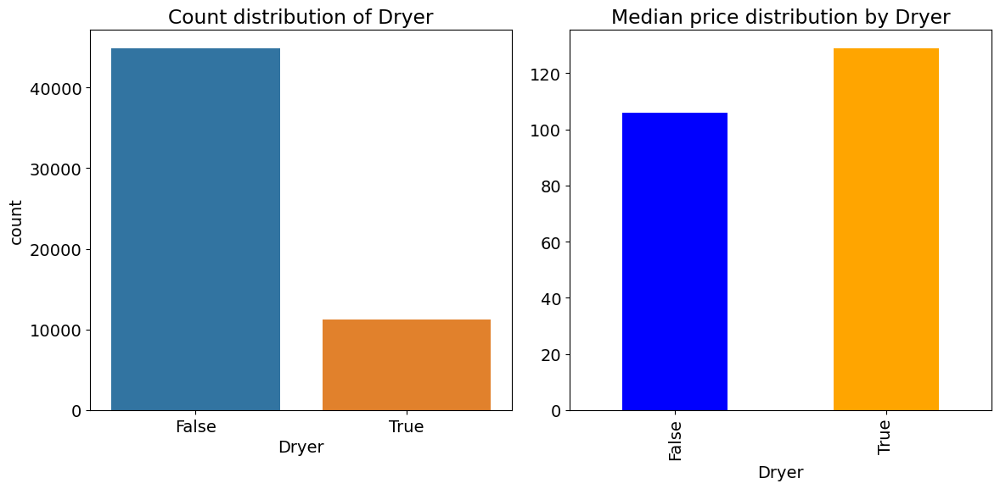

% Wise Split of Dryer:
Dryer
False    79.950129
True     20.049871
Name: proportion, dtype: float64

P-value for Dryer: 3.3536763495325982e-21
Dryer is statistically significant (p-value < 0.05)


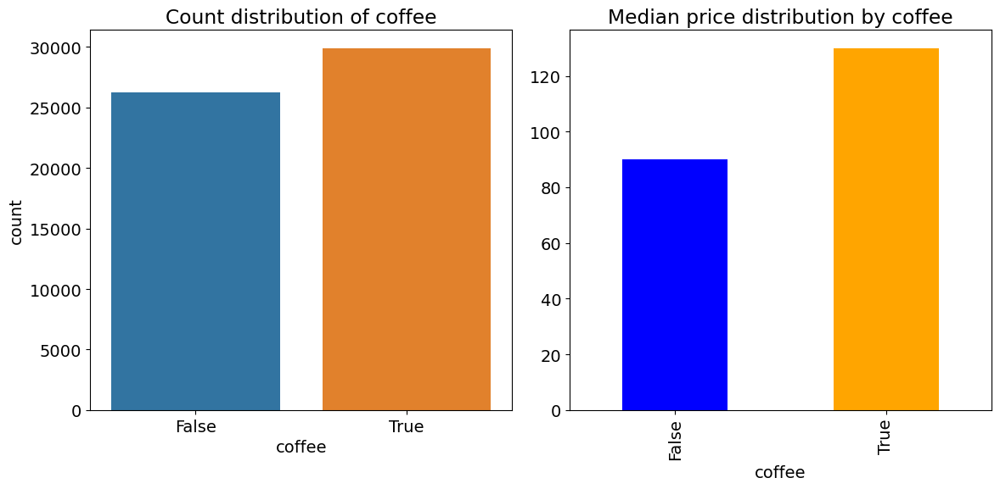

% Wise Split of coffee:
coffee
True     53.270995
False    46.729005
Name: proportion, dtype: float64

P-value for coffee: 6.879712497945402e-26
coffee is statistically significant (p-value < 0.05)


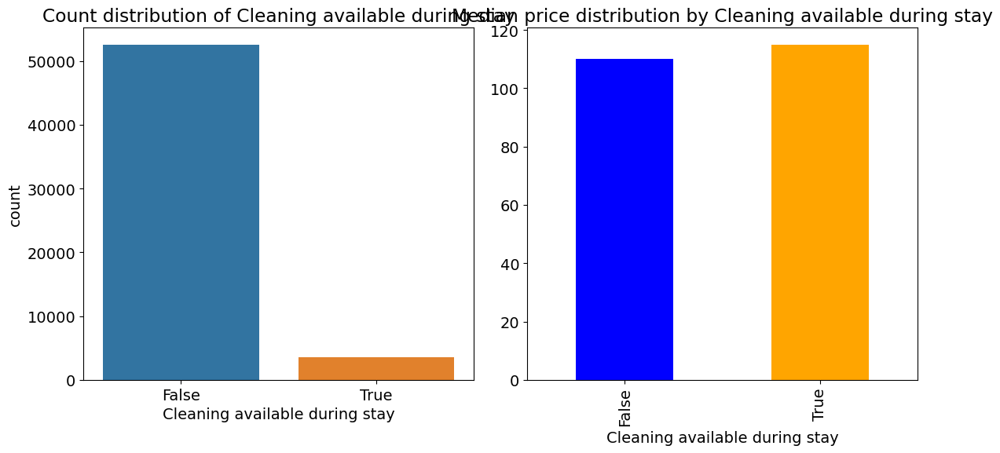

% Wise Split of Cleaning available during stay:
Cleaning available during stay
False    93.655713
True      6.344287
Name: proportion, dtype: float64

P-value for Cleaning available during stay: 0.8901426563294541
Cleaning available during stay is not statistically significant (p-value >= 0.05)


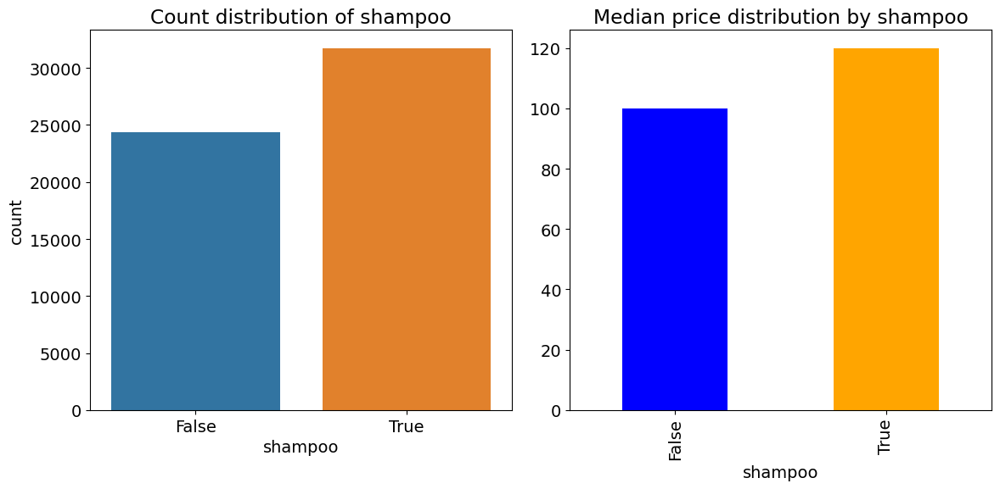

% Wise Split of shampoo:
shampoo
True     56.548223
False    43.451777
Name: proportion, dtype: float64

P-value for shampoo: 2.9631012152359266e-10
shampoo is statistically significant (p-value < 0.05)


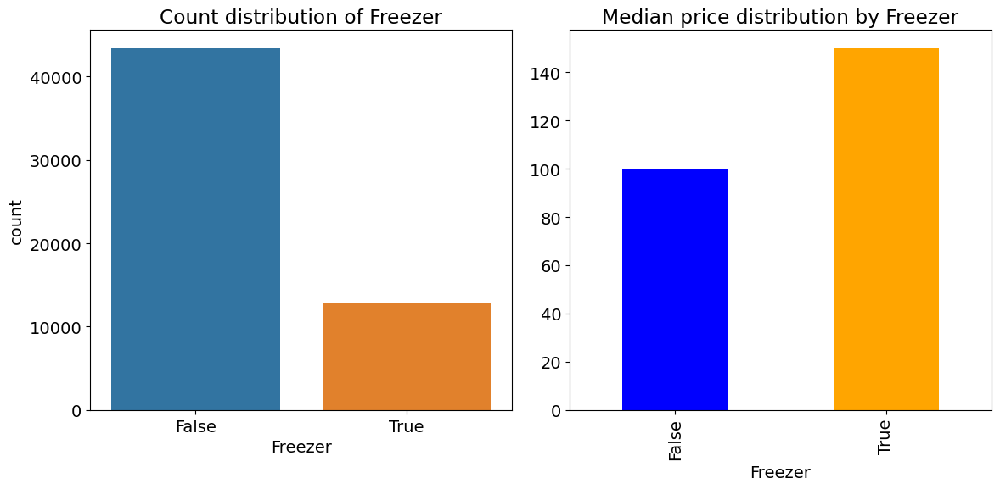

% Wise Split of Freezer:
Freezer
False    77.308754
True     22.691246
Name: proportion, dtype: float64

P-value for Freezer: 1.0117455297017254e-28
Freezer is statistically significant (p-value < 0.05)


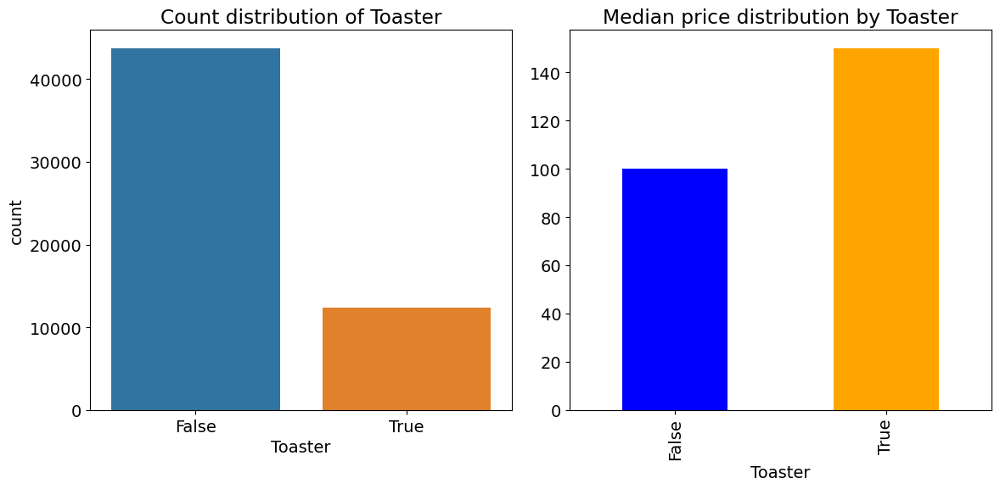

% Wise Split of Toaster:
Toaster
False    77.917891
True     22.082109
Name: proportion, dtype: float64

P-value for Toaster: 3.373271388348356e-55
Toaster is statistically significant (p-value < 0.05)


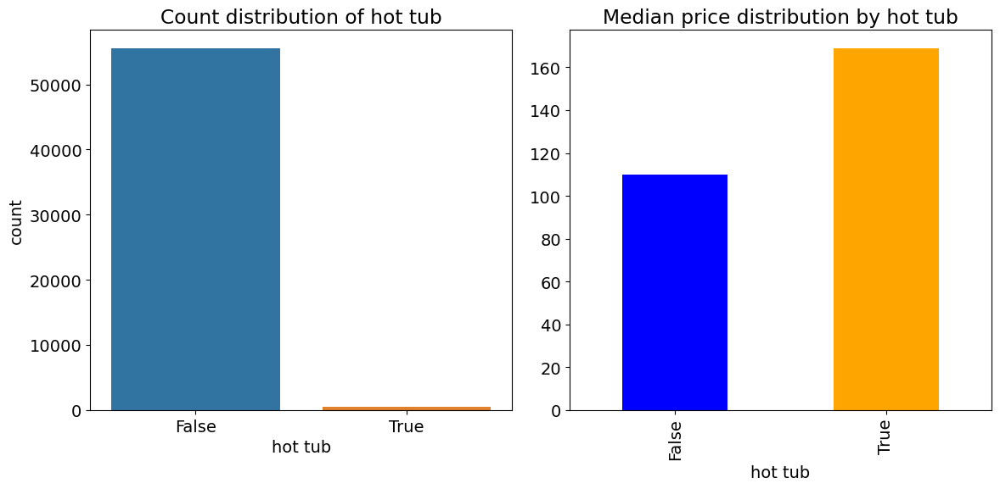

% Wise Split of hot tub:
hot tub
False    98.995458
True      1.004542
Name: proportion, dtype: float64

P-value for hot tub: 2.085153891989111e-08
hot tub is statistically significant (p-value < 0.05)


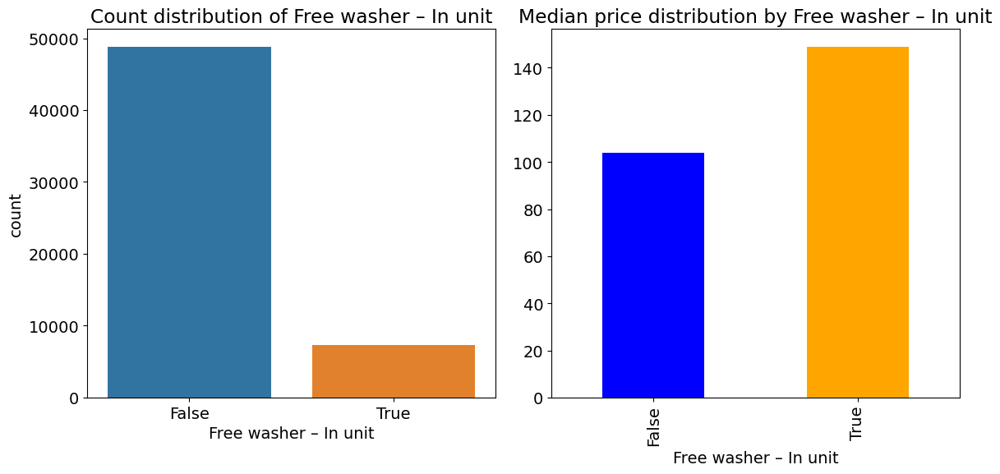

% Wise Split of Free washer – In unit:
Free washer – In unit
False    86.983703
True     13.016297
Name: proportion, dtype: float64

P-value for Free washer – In unit: 2.6390820345768586e-05
Free washer – In unit is statistically significant (p-value < 0.05)


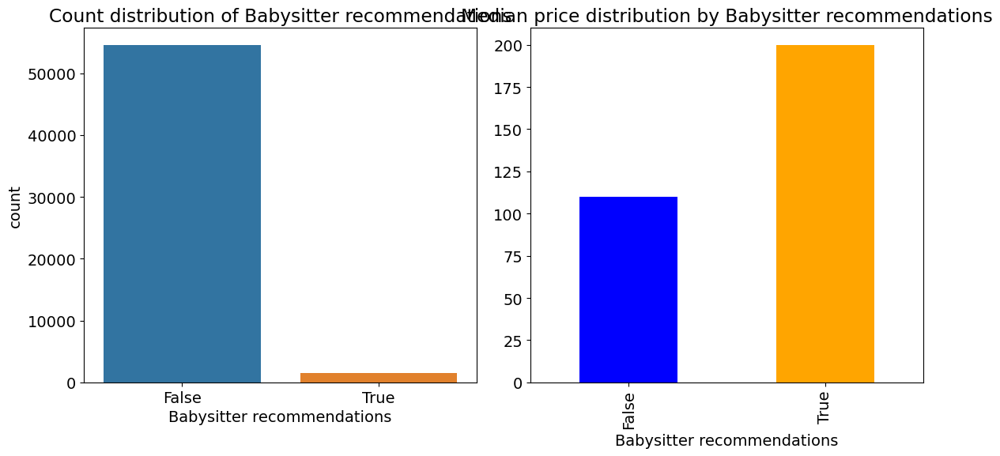

% Wise Split of Babysitter recommendations:
Babysitter recommendations
False    97.25354
True      2.74646
Name: proportion, dtype: float64

P-value for Babysitter recommendations: 4.423265120832356e-39
Babysitter recommendations is statistically significant (p-value < 0.05)


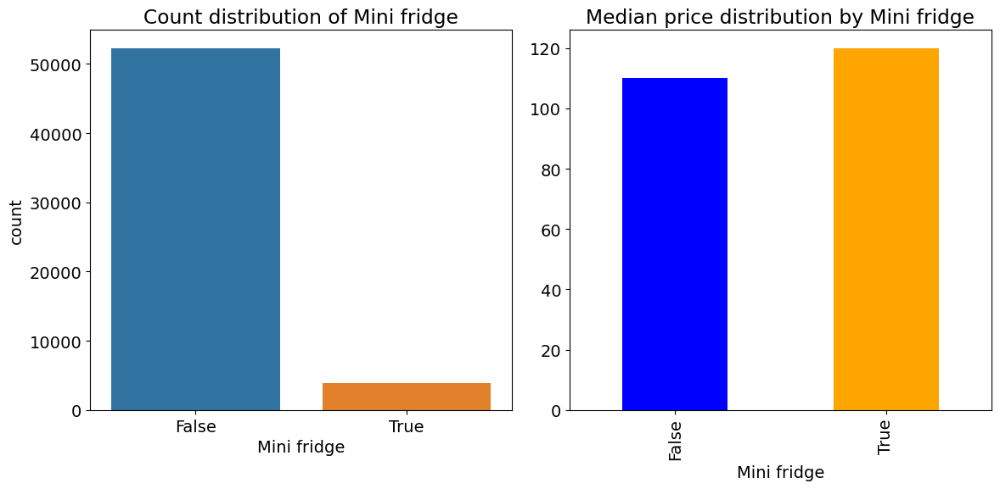

% Wise Split of Mini fridge:
Mini fridge
False    93.139193
True      6.860807
Name: proportion, dtype: float64

P-value for Mini fridge: 0.6658203714775811
Mini fridge is not statistically significant (p-value >= 0.05)


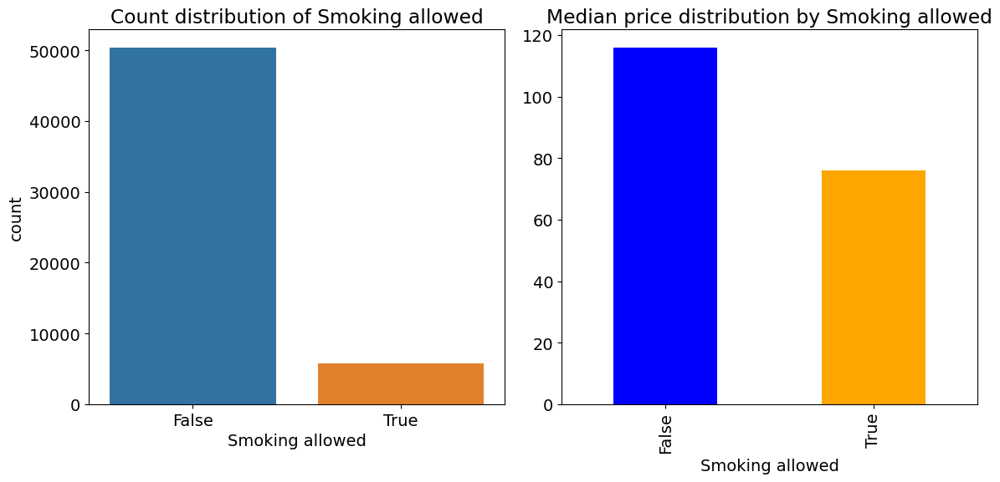

% Wise Split of Smoking allowed:
Smoking allowed
False    89.753317
True     10.246683
Name: proportion, dtype: float64

P-value for Smoking allowed: 2.061281290104415e-71
Smoking allowed is statistically significant (p-value < 0.05)


In [8]:
#doing the analysis for all the different amenities
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = 20, 20
result = [binary_count_and_price_plot(col) for col in dataframe1.iloc[:,51:-2].columns]

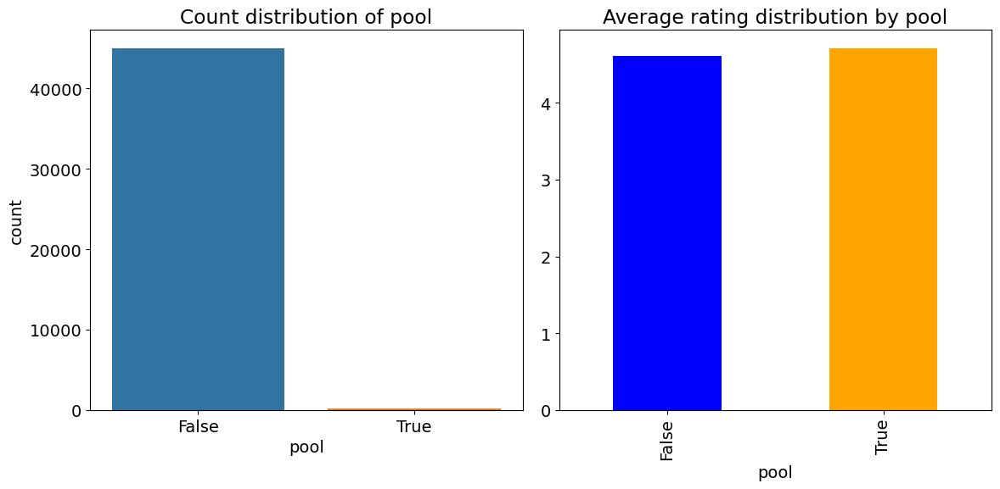

% Wise Split of pool:
pool
False    99.621598
True      0.378402
Name: proportion, dtype: float64

P-value for pool: 0.031518175412824465
pool is statistically significant (p-value < 0.05)


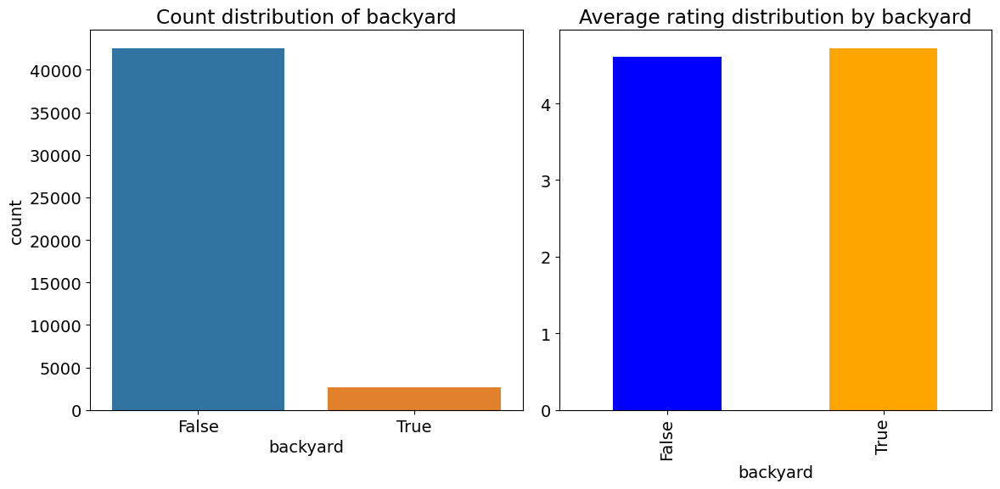

% Wise Split of backyard:
backyard
False    94.175703
True      5.824297
Name: proportion, dtype: float64

P-value for backyard: 1.0137016403164954e-48
backyard is statistically significant (p-value < 0.05)


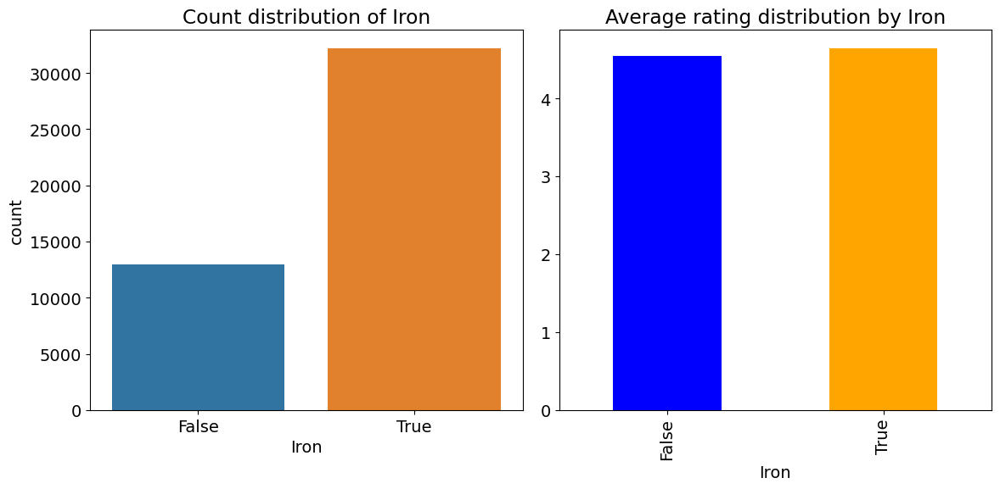

% Wise Split of Iron:
Iron
True     71.301173
False    28.698827
Name: proportion, dtype: float64

P-value for Iron: 5.3465326809298506e-42
Iron is statistically significant (p-value < 0.05)


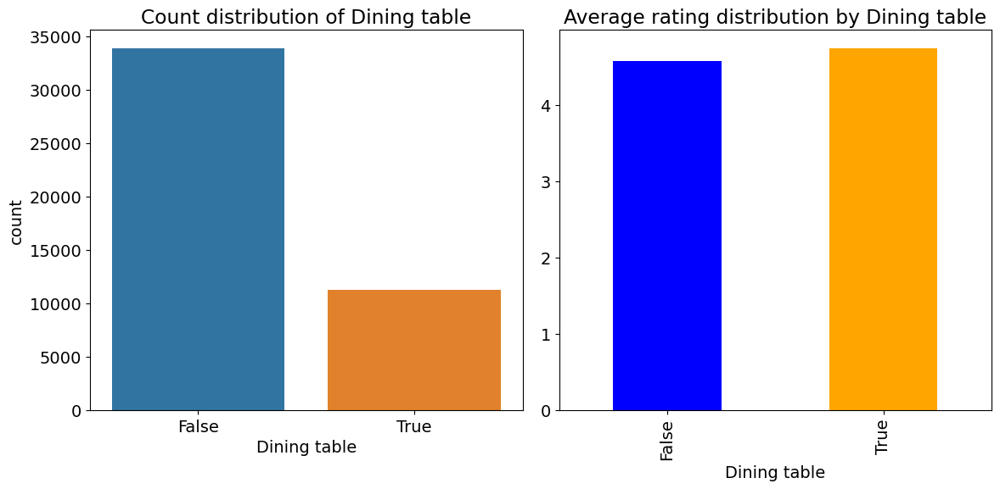

% Wise Split of Dining table:
Dining table
False    75.009958
True     24.990042
Name: proportion, dtype: float64

P-value for Dining table: 1.5158021352944667e-242
Dining table is statistically significant (p-value < 0.05)


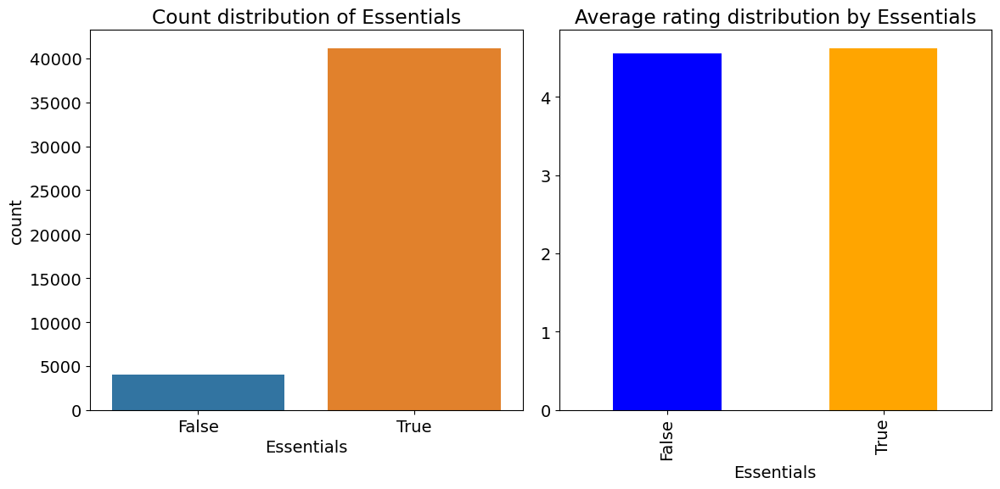

% Wise Split of Essentials:
Essentials
True     91.097588
False     8.902412
Name: proportion, dtype: float64

P-value for Essentials: 4.86131172364807e-08
Essentials is statistically significant (p-value < 0.05)


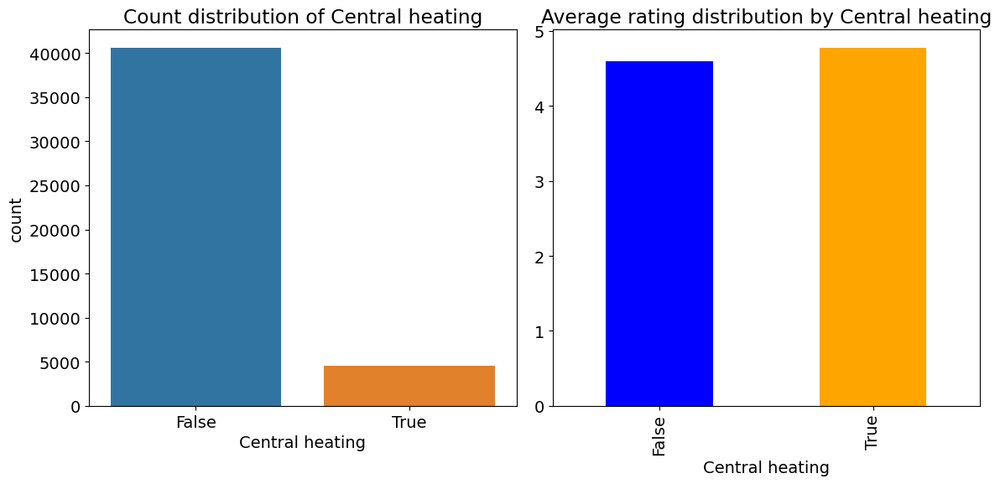

% Wise Split of Central heating:
Central heating
False    89.90042
True     10.09958
Name: proportion, dtype: float64

P-value for Central heating: 2.564724438306466e-193
Central heating is statistically significant (p-value < 0.05)


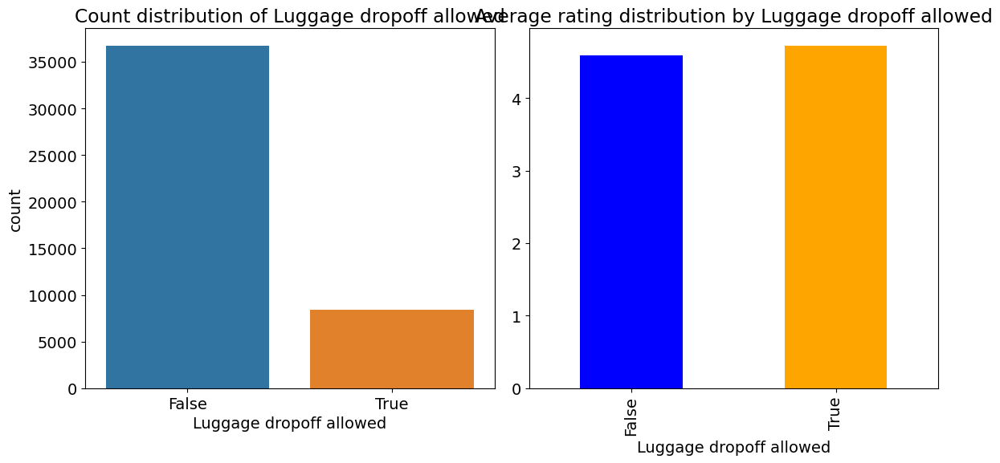

% Wise Split of Luggage dropoff allowed:
Luggage dropoff allowed
False    81.303386
True     18.696614
Name: proportion, dtype: float64

P-value for Luggage dropoff allowed: 2.6117451116945964e-120
Luggage dropoff allowed is statistically significant (p-value < 0.05)


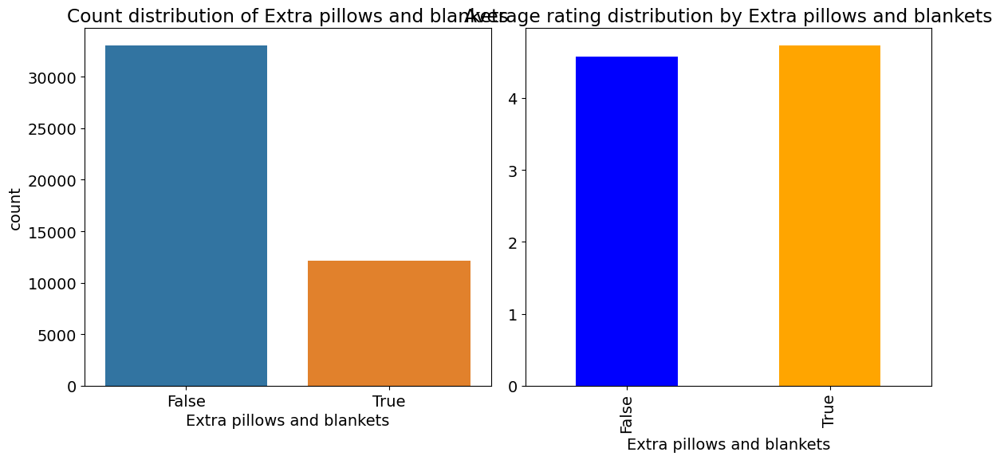

% Wise Split of Extra pillows and blankets:
Extra pillows and blankets
False    73.148927
True     26.851073
Name: proportion, dtype: float64

P-value for Extra pillows and blankets: 8.938755030375315e-197
Extra pillows and blankets is statistically significant (p-value < 0.05)


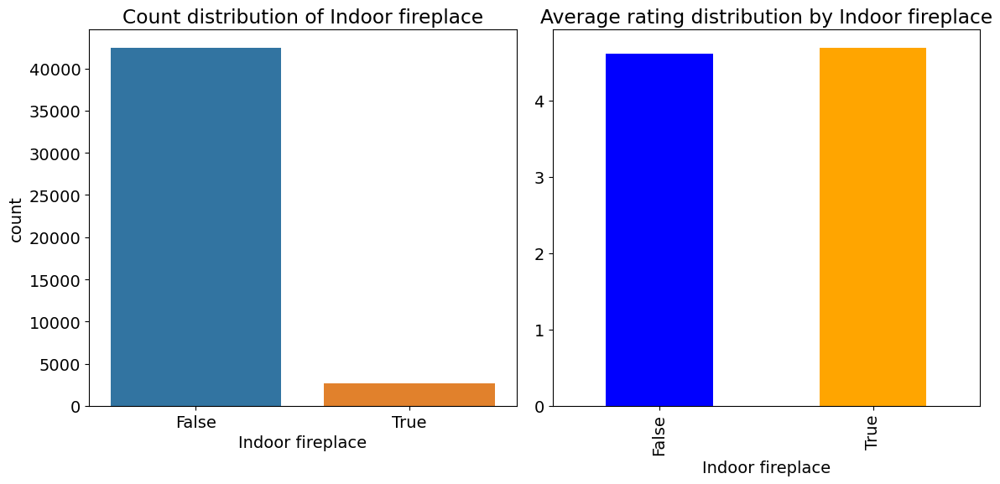

% Wise Split of Indoor fireplace:
Indoor fireplace
False    94.009737
True      5.990263
Name: proportion, dtype: float64

P-value for Indoor fireplace: 9.229235710953799e-12
Indoor fireplace is statistically significant (p-value < 0.05)


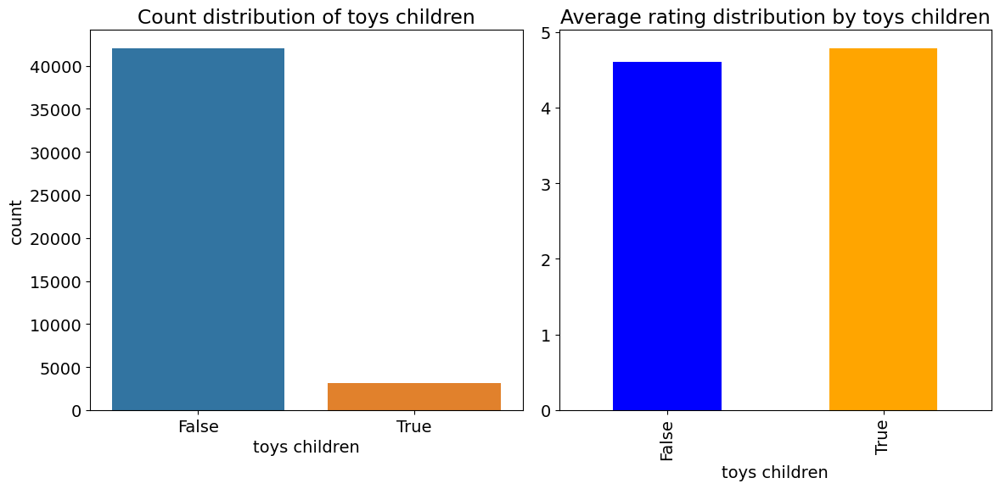

% Wise Split of toys children:
toys children
False    93.084753
True      6.915247
Name: proportion, dtype: float64

P-value for toys children: 2.4524672193082794e-145
toys children is statistically significant (p-value < 0.05)


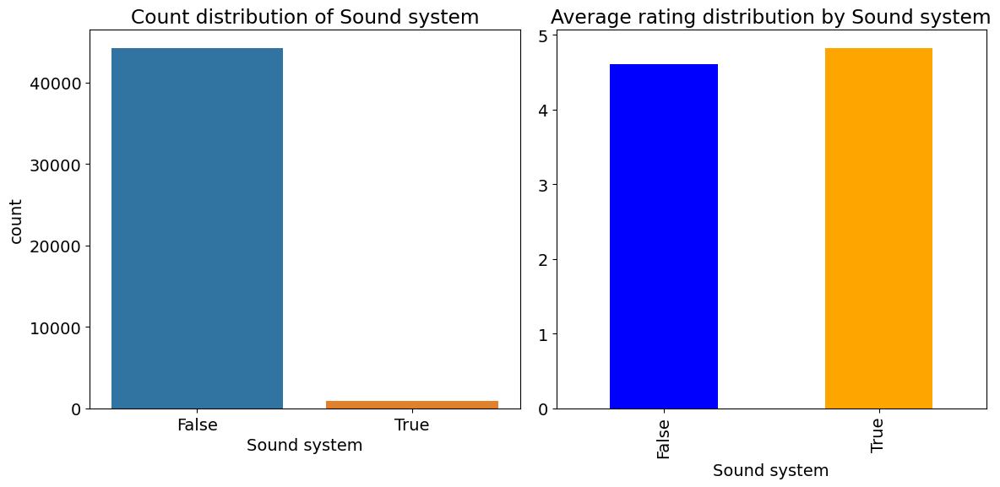

% Wise Split of Sound system:
Sound system
False    97.913255
True      2.086745
Name: proportion, dtype: float64

P-value for Sound system: 3.2009365530518473e-128
Sound system is statistically significant (p-value < 0.05)


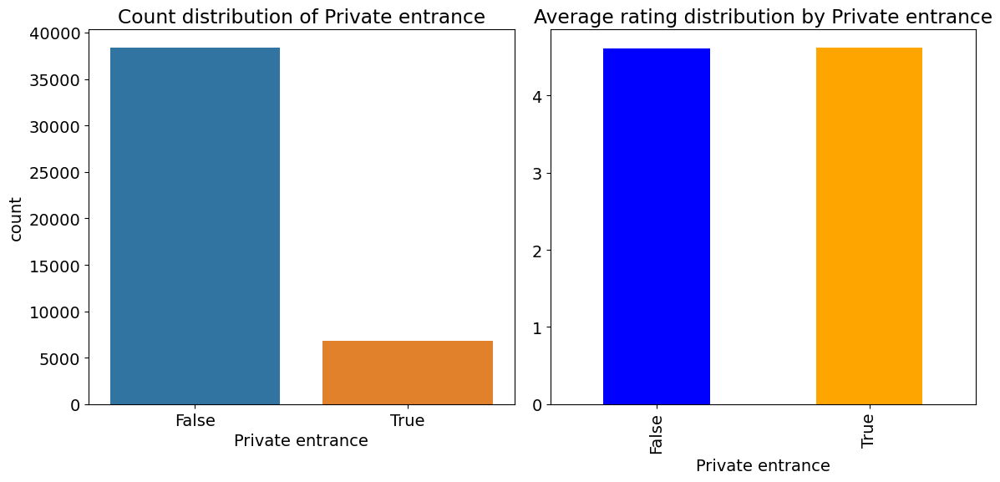

% Wise Split of Private entrance:
Private entrance
False    84.983403
True     15.016597
Name: proportion, dtype: float64

P-value for Private entrance: 0.20657416548943378
Private entrance is not statistically significant (p-value >= 0.05)


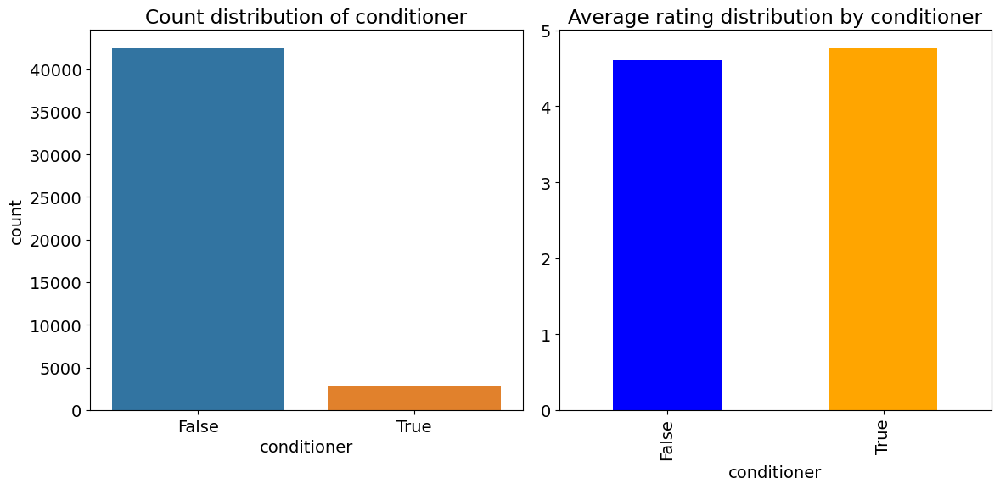

% Wise Split of conditioner:
conditioner
False    93.978756
True      6.021244
Name: proportion, dtype: float64

P-value for conditioner: 1.6448169357008358e-100
conditioner is statistically significant (p-value < 0.05)


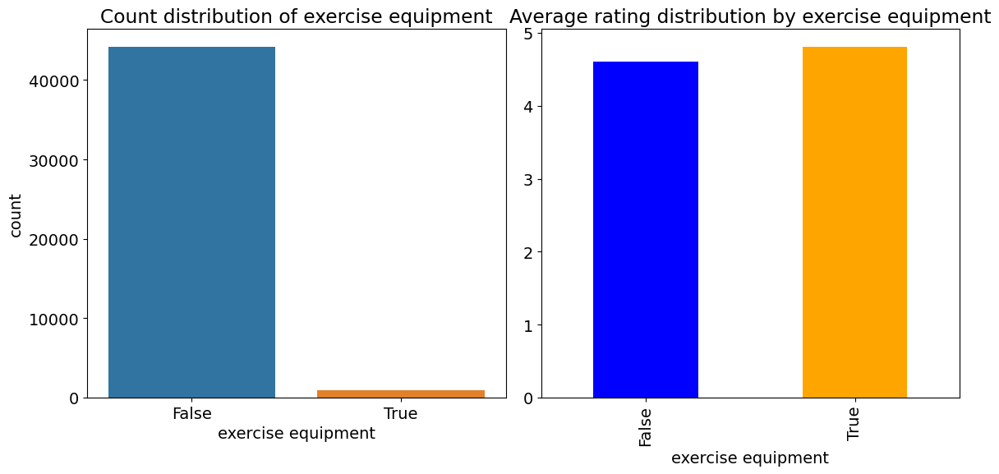

% Wise Split of exercise equipment:
exercise equipment
False    97.860146
True      2.139854
Name: proportion, dtype: float64

P-value for exercise equipment: 1.6664527893165658e-101
exercise equipment is statistically significant (p-value < 0.05)


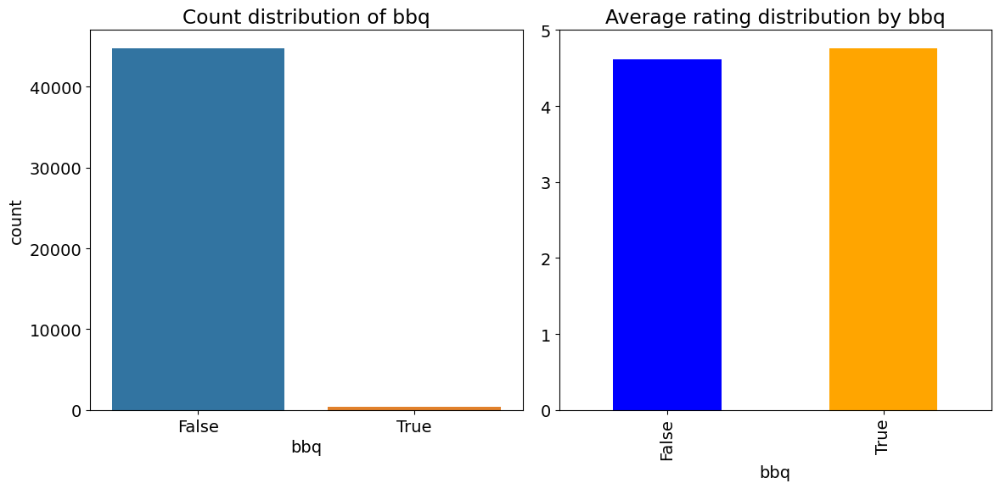

% Wise Split of bbq:
bbq
False    99.10821
True      0.89179
Name: proportion, dtype: float64

P-value for bbq: 1.4572993482066596e-08
bbq is statistically significant (p-value < 0.05)


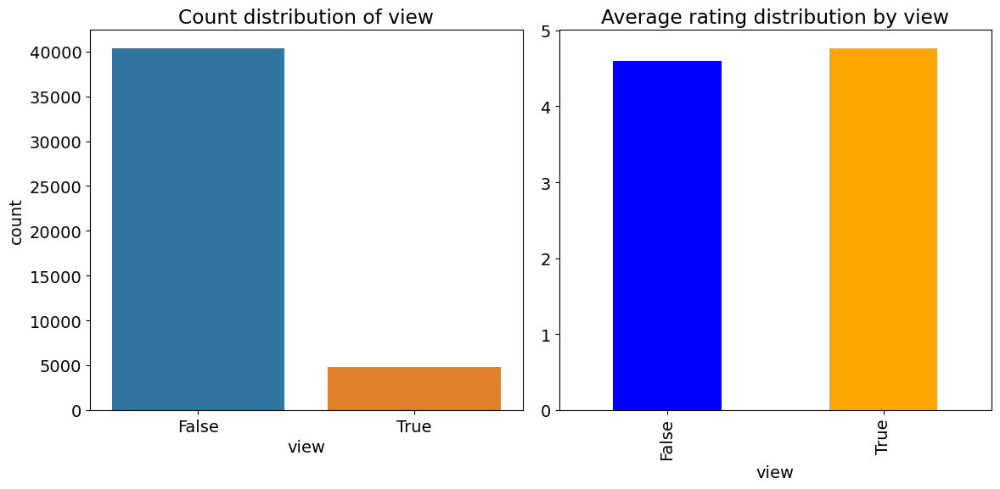

% Wise Split of view:
view
False    89.375968
True     10.624032
Name: proportion, dtype: float64

P-value for view: 5.394807449920163e-186
view is statistically significant (p-value < 0.05)


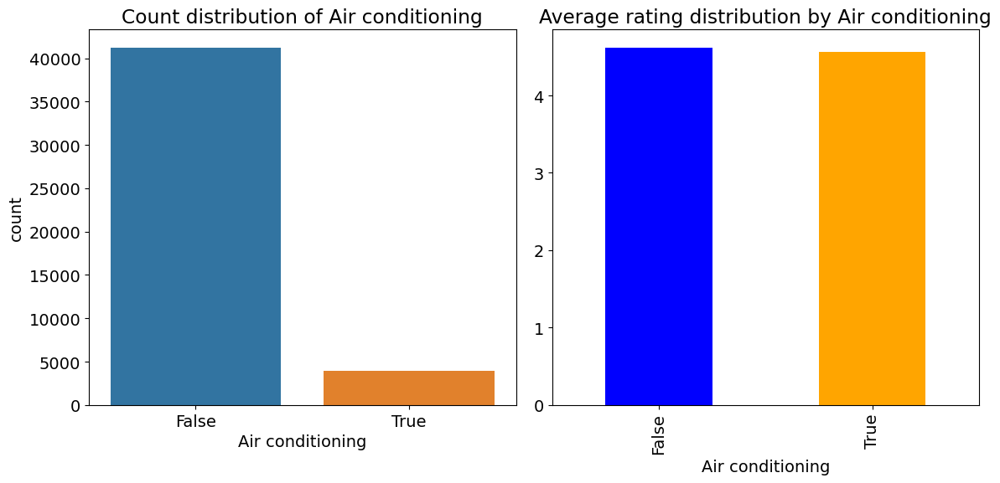

% Wise Split of Air conditioning:
Air conditioning
False    91.254702
True      8.745298
Name: proportion, dtype: float64

P-value for Air conditioning: 1.6335273455394434e-07
Air conditioning is statistically significant (p-value < 0.05)


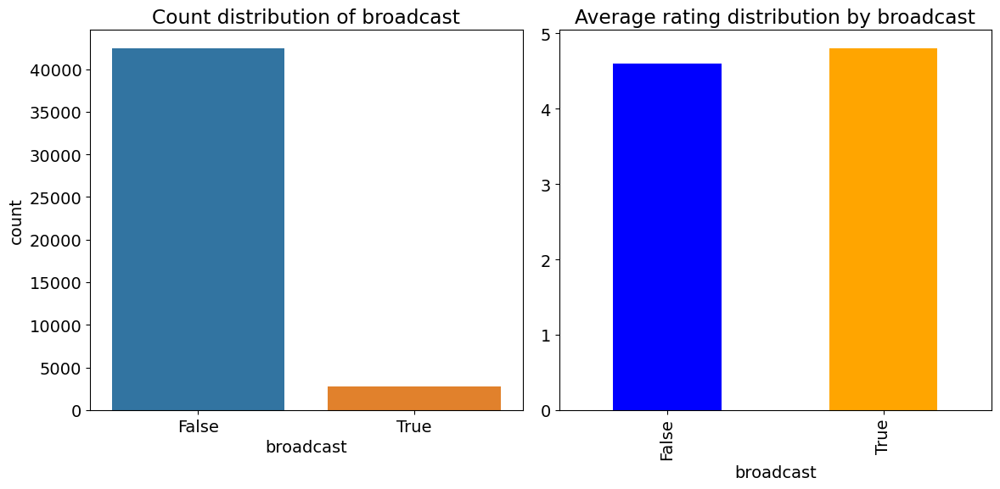

% Wise Split of broadcast:
broadcast
False    93.978756
True      6.021244
Name: proportion, dtype: float64

P-value for broadcast: 2.3648241781895757e-217
broadcast is statistically significant (p-value < 0.05)


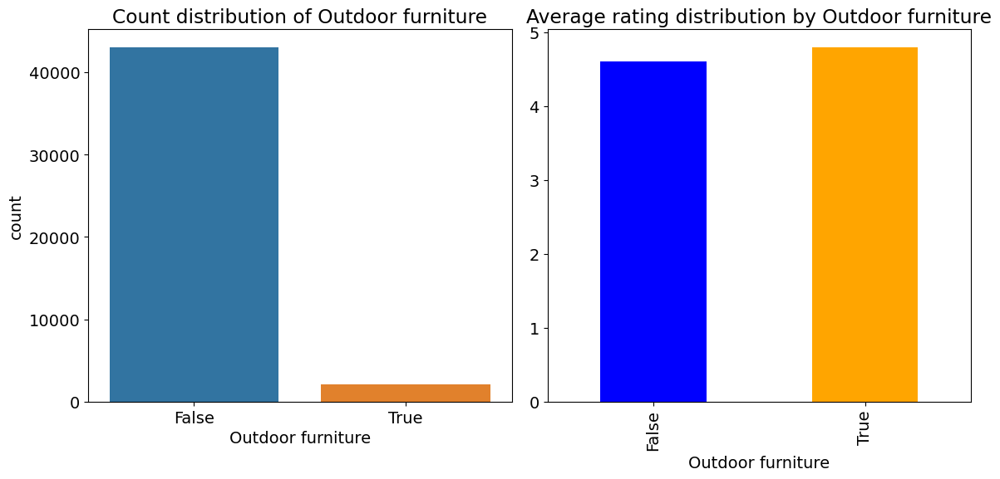

% Wise Split of Outdoor furniture:
Outdoor furniture
False    95.271078
True      4.728922
Name: proportion, dtype: float64

P-value for Outdoor furniture: 2.3199262147729483e-127
Outdoor furniture is statistically significant (p-value < 0.05)


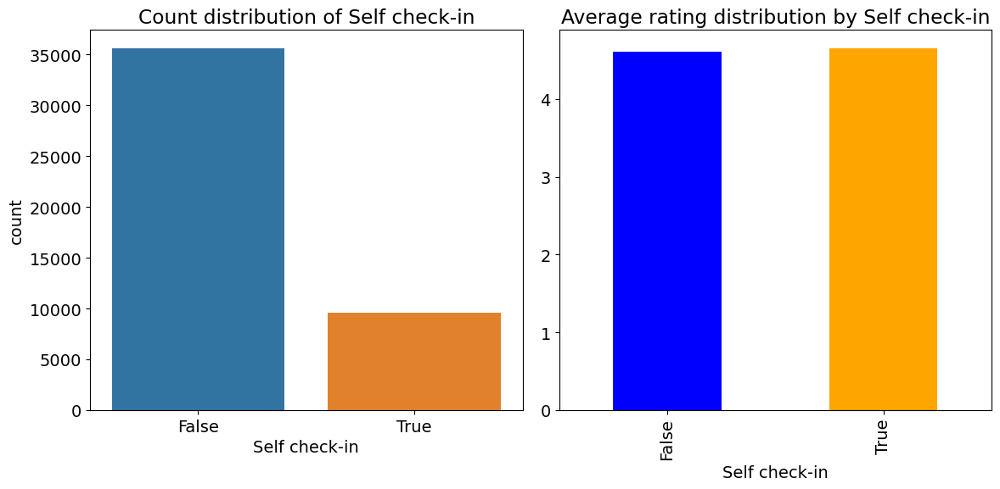

% Wise Split of Self check-in:
Self check-in
False    78.873645
True     21.126355
Name: proportion, dtype: float64

P-value for Self check-in: 1.6065914978058707e-18
Self check-in is statistically significant (p-value < 0.05)


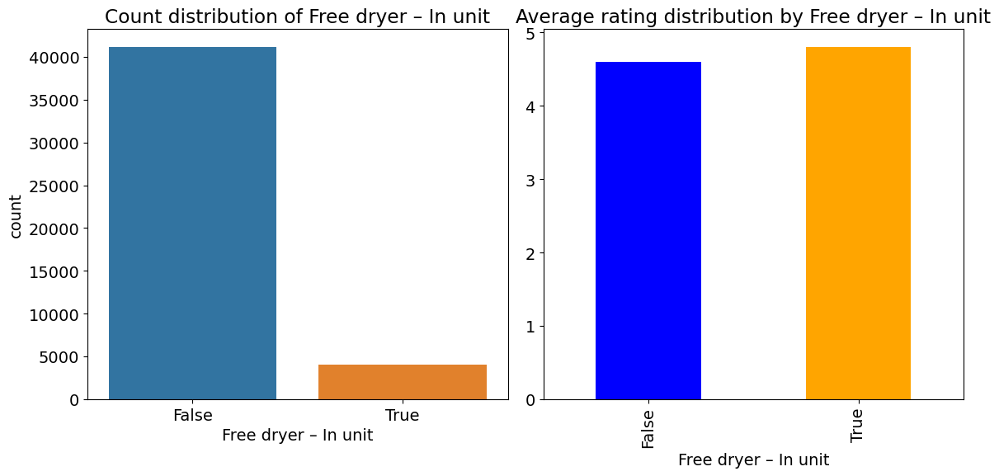

% Wise Split of Free dryer – In unit:
Free dryer – In unit
False    91.13742
True      8.86258
Name: proportion, dtype: float64

P-value for Free dryer – In unit: 2.7077823843403037e-275
Free dryer – In unit is statistically significant (p-value < 0.05)


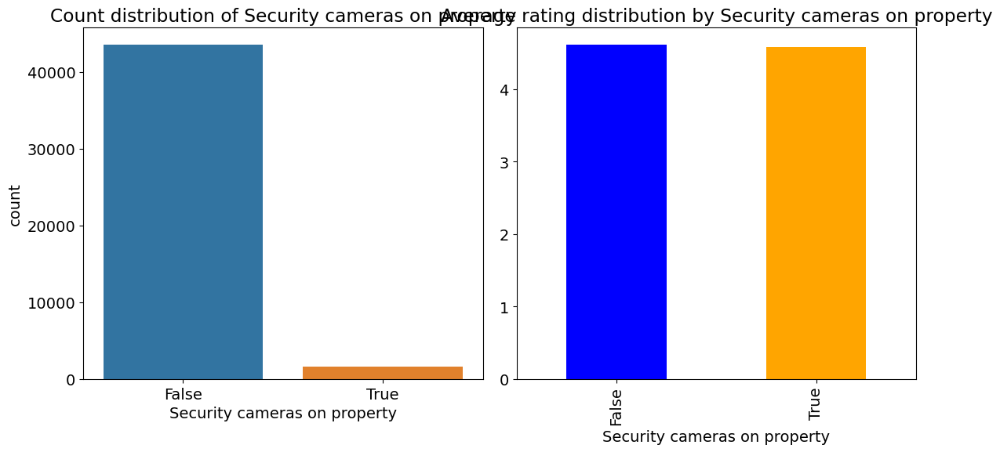

% Wise Split of Security cameras on property:
Security cameras on property
False    96.481522
True      3.518478
Name: proportion, dtype: float64

P-value for Security cameras on property: 0.010465720134909127
Security cameras on property is statistically significant (p-value < 0.05)


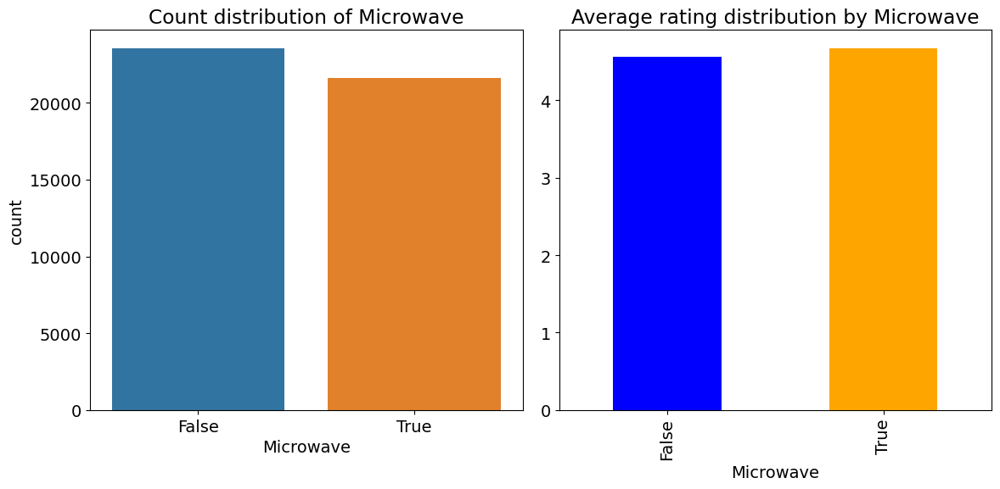

% Wise Split of Microwave:
Microwave
False    52.12879
True     47.87121
Name: proportion, dtype: float64

P-value for Microwave: 1.5857948958009486e-76
Microwave is statistically significant (p-value < 0.05)


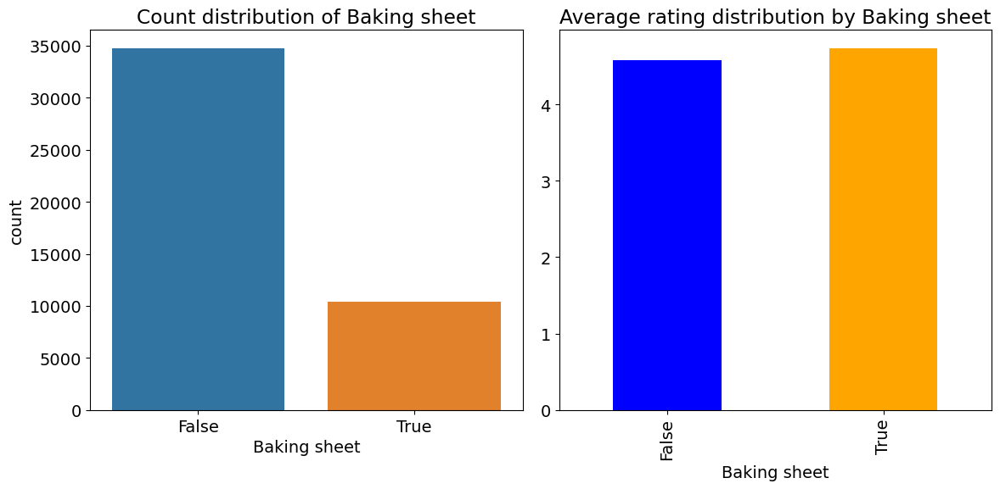

% Wise Split of Baking sheet:
Baking sheet
False    76.921885
True     23.078115
Name: proportion, dtype: float64

P-value for Baking sheet: 1.7952530234507515e-182
Baking sheet is statistically significant (p-value < 0.05)


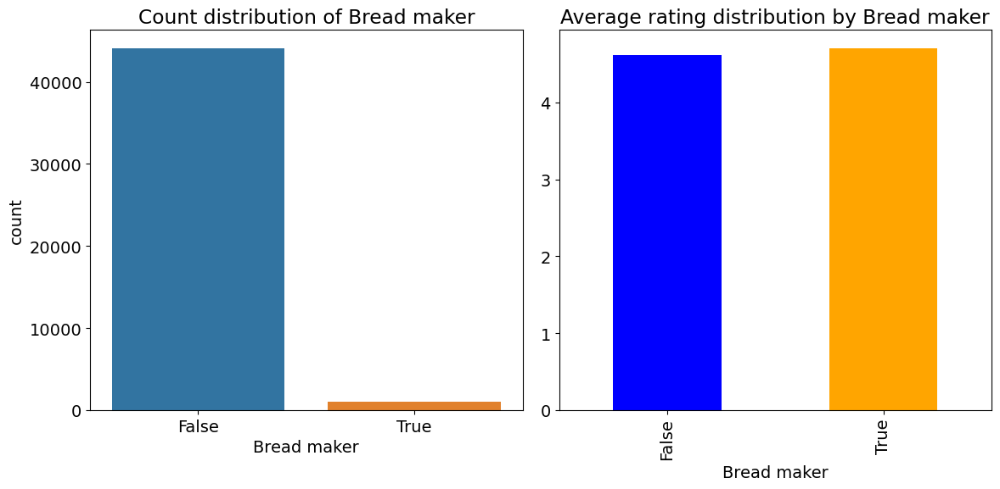

% Wise Split of Bread maker:
Bread maker
False    97.652135
True      2.347865
Name: proportion, dtype: float64

P-value for Bread maker: 7.20706315407593e-14
Bread maker is statistically significant (p-value < 0.05)


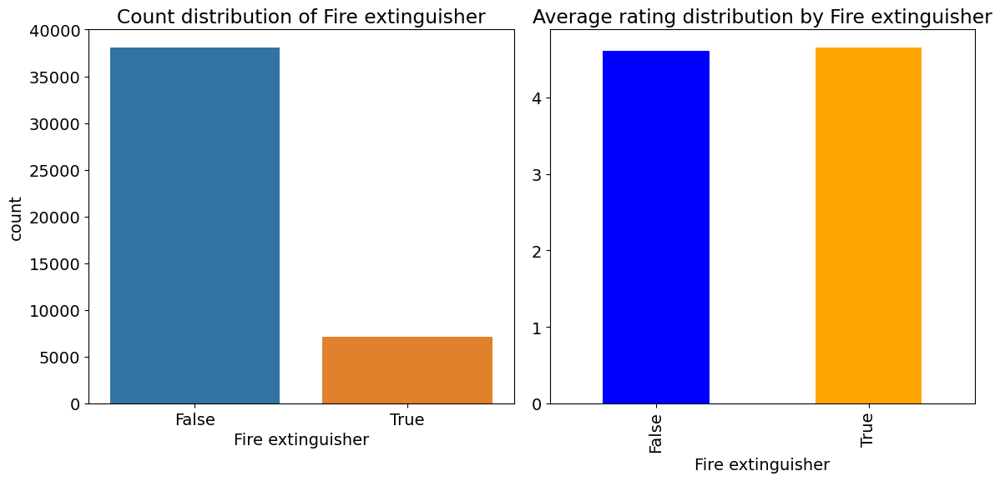

% Wise Split of Fire extinguisher:
Fire extinguisher
False    84.330604
True     15.669396
Name: proportion, dtype: float64

P-value for Fire extinguisher: 5.997652771441403e-12
Fire extinguisher is statistically significant (p-value < 0.05)


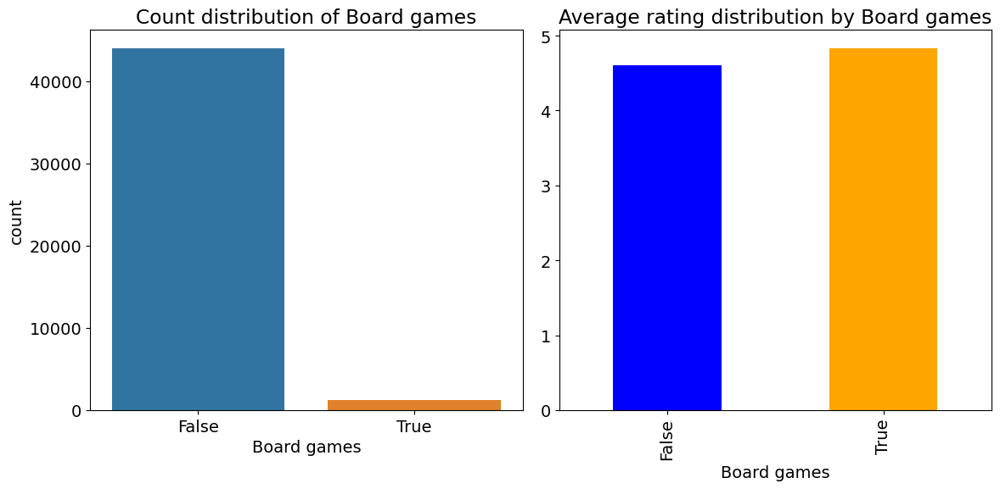

% Wise Split of Board games:
Board games
False    97.377738
True      2.622262
Name: proportion, dtype: float64

P-value for Board games: 8.731094911839588e-152
Board games is statistically significant (p-value < 0.05)


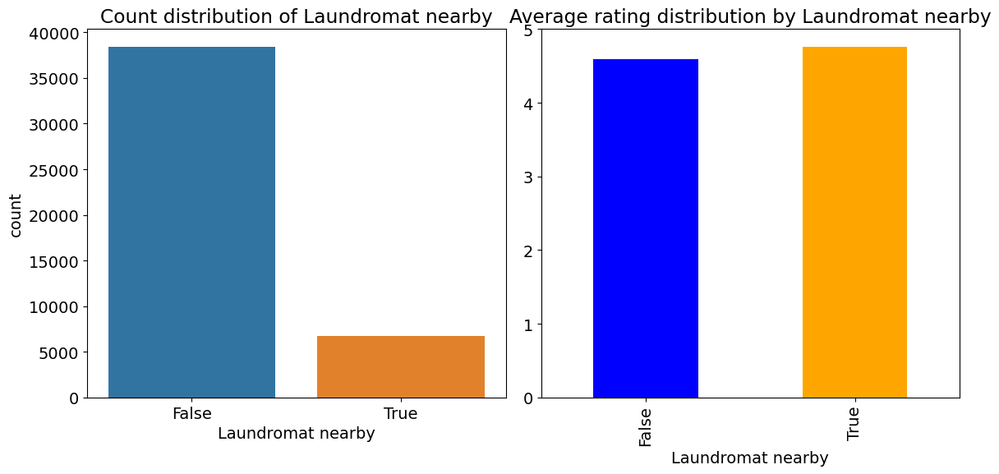

% Wise Split of Laundromat nearby:
Laundromat nearby
False    85.063067
True     14.936933
Name: proportion, dtype: float64

P-value for Laundromat nearby: 1.1969126380572587e-237
Laundromat nearby is statistically significant (p-value < 0.05)


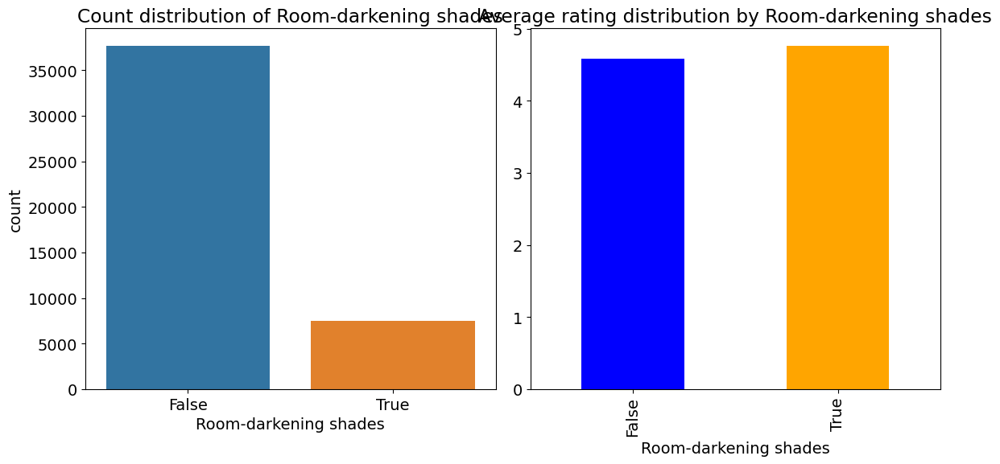

% Wise Split of Room-darkening shades:
Room-darkening shades
False    83.425537
True     16.574463
Name: proportion, dtype: float64

P-value for Room-darkening shades: 7.933694899630572e-242
Room-darkening shades is statistically significant (p-value < 0.05)


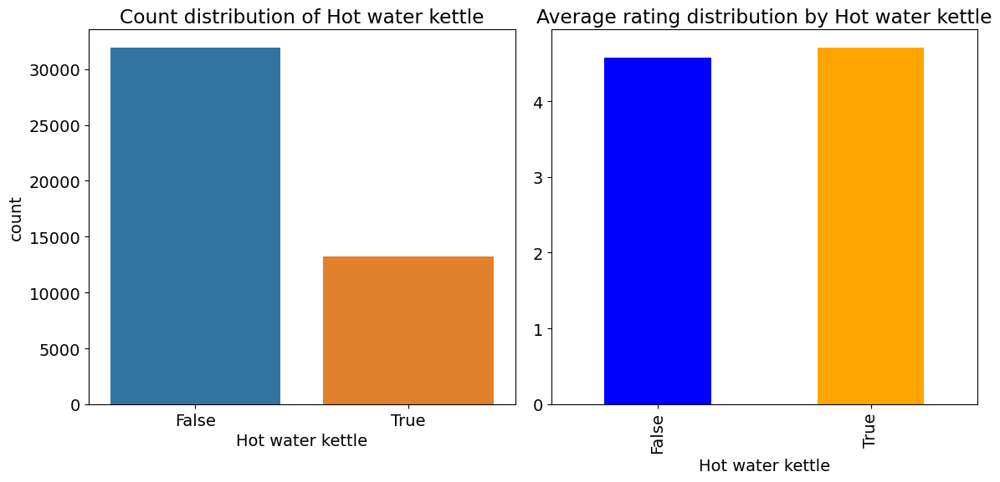

% Wise Split of Hot water kettle:
Hot water kettle
False    70.710334
True     29.289666
Name: proportion, dtype: float64

P-value for Hot water kettle: 6.480384275263563e-136
Hot water kettle is statistically significant (p-value < 0.05)


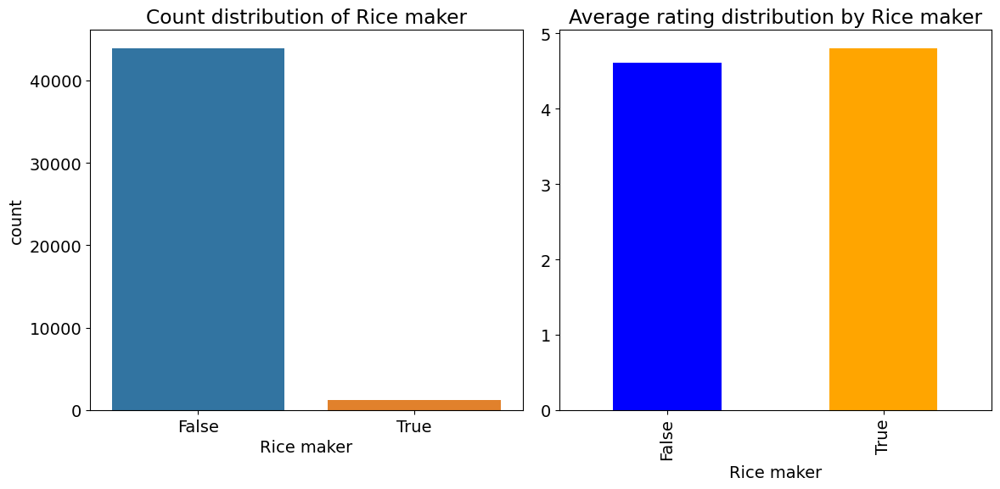

% Wise Split of Rice maker:
Rice maker
False    97.196282
True      2.803718
Name: proportion, dtype: float64

P-value for Rice maker: 1.0232686384569647e-116
Rice maker is statistically significant (p-value < 0.05)


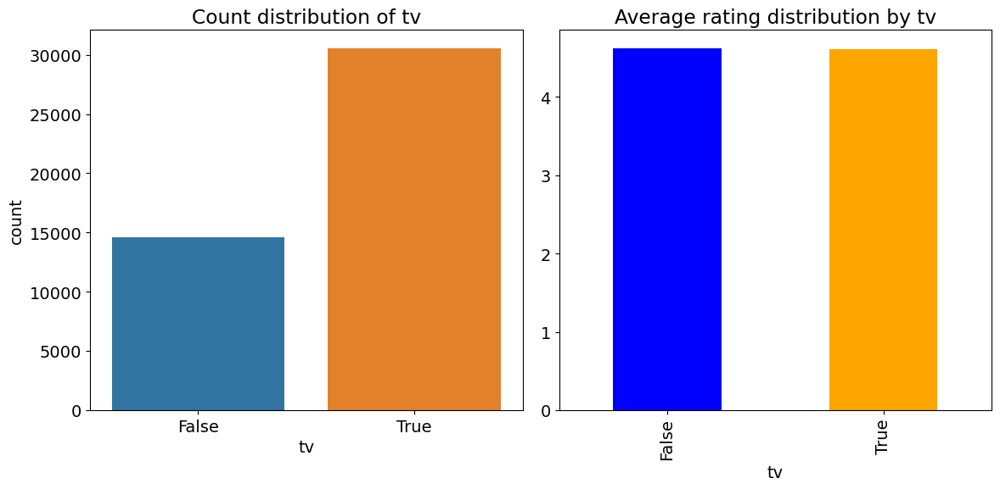

% Wise Split of tv:
tv
True     67.649923
False    32.350077
Name: proportion, dtype: float64

P-value for tv: 0.017989094552560782
tv is statistically significant (p-value < 0.05)


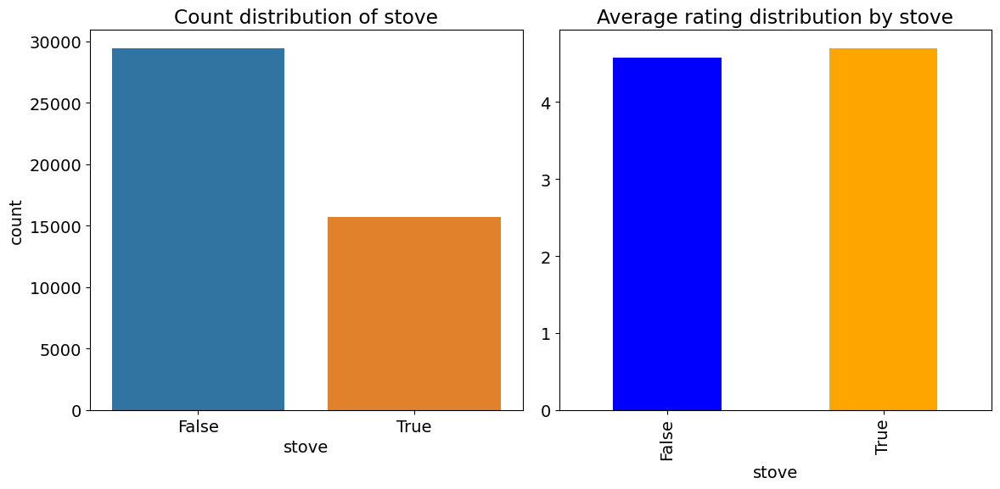

% Wise Split of stove:
stove
False    65.19584
True     34.80416
Name: proportion, dtype: float64

P-value for stove: 1.938763906093495e-120
stove is statistically significant (p-value < 0.05)


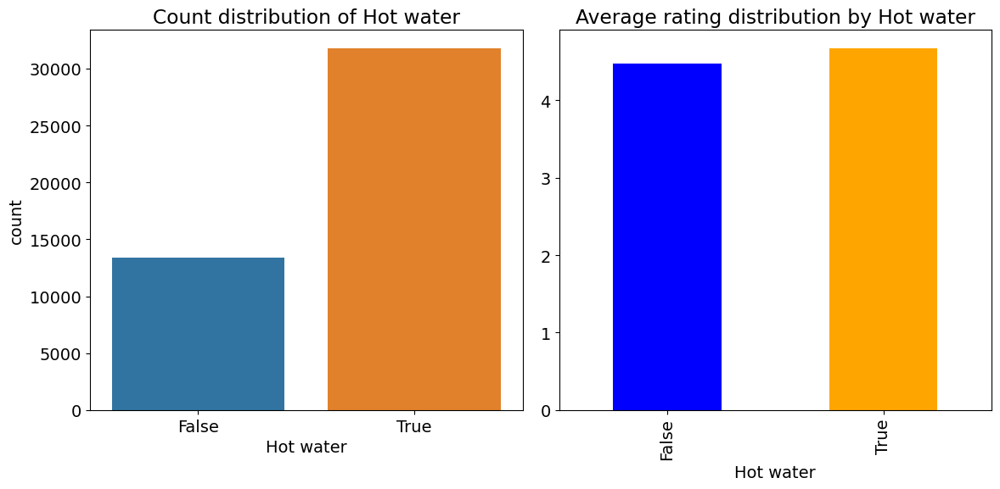

% Wise Split of Hot water:
Hot water
True     70.380615
False    29.619385
Name: proportion, dtype: float64

P-value for Hot water: 3.0000385713592015e-112
Hot water is statistically significant (p-value < 0.05)


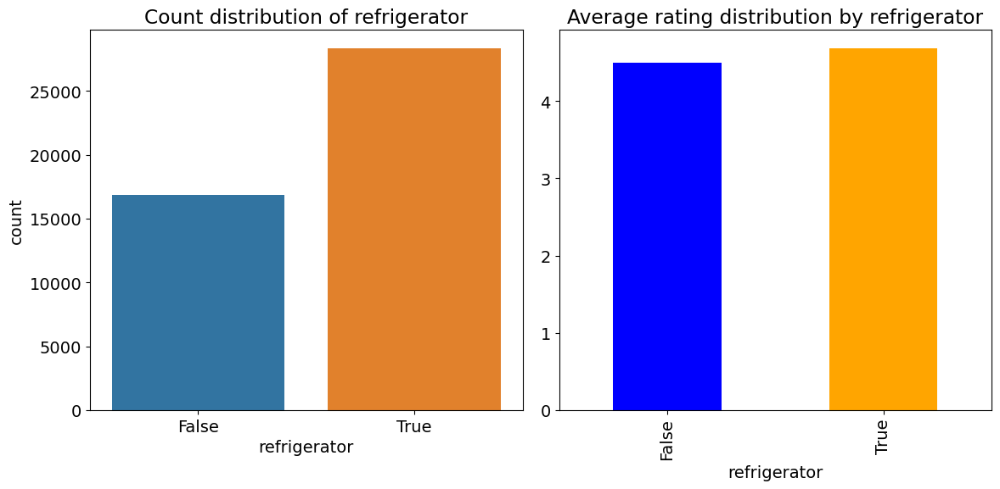

% Wise Split of refrigerator:
refrigerator
True     62.737331
False    37.262669
Name: proportion, dtype: float64

P-value for refrigerator: 3.616504753705656e-146
refrigerator is statistically significant (p-value < 0.05)


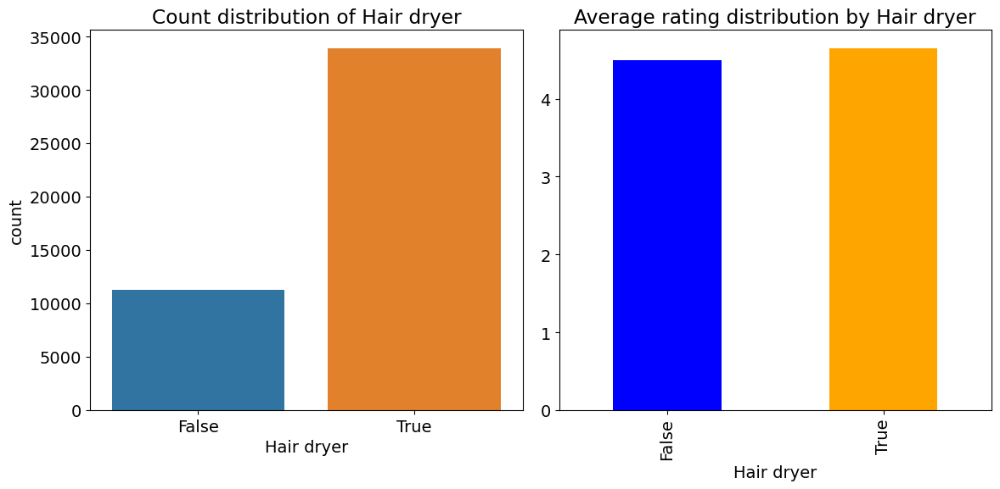

% Wise Split of Hair dryer:
Hair dryer
True     75.04979
False    24.95021
Name: proportion, dtype: float64

P-value for Hair dryer: 3.049884178946067e-68
Hair dryer is statistically significant (p-value < 0.05)


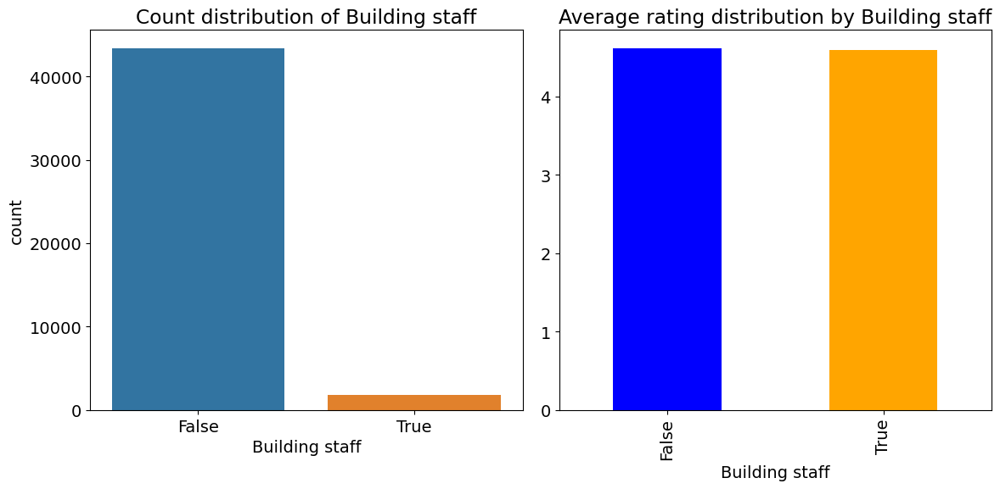

% Wise Split of Building staff:
Building staff
False    96.030095
True      3.969905
Name: proportion, dtype: float64

P-value for Building staff: 0.01837439283838995
Building staff is statistically significant (p-value < 0.05)


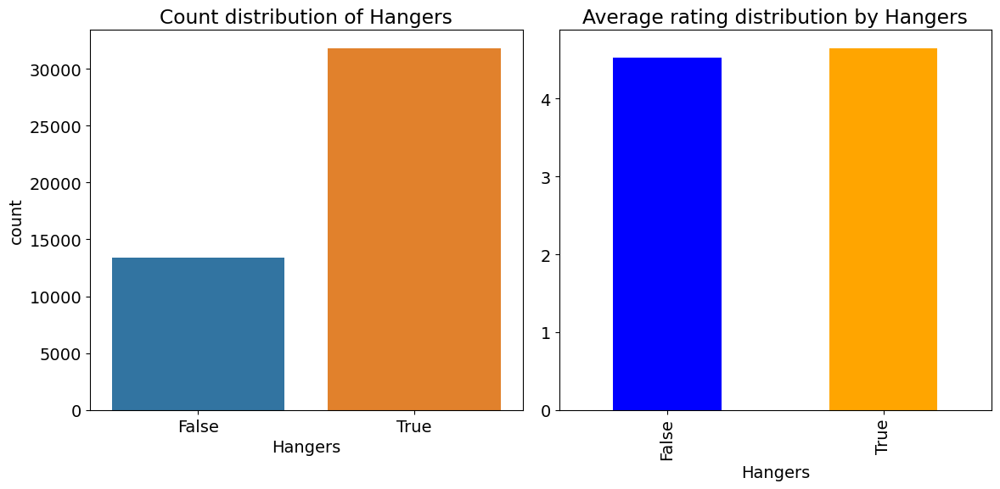

% Wise Split of Hangers:
Hangers
True     70.40717
False    29.59283
Name: proportion, dtype: float64

P-value for Hangers: 7.606223070876035e-57
Hangers is statistically significant (p-value < 0.05)


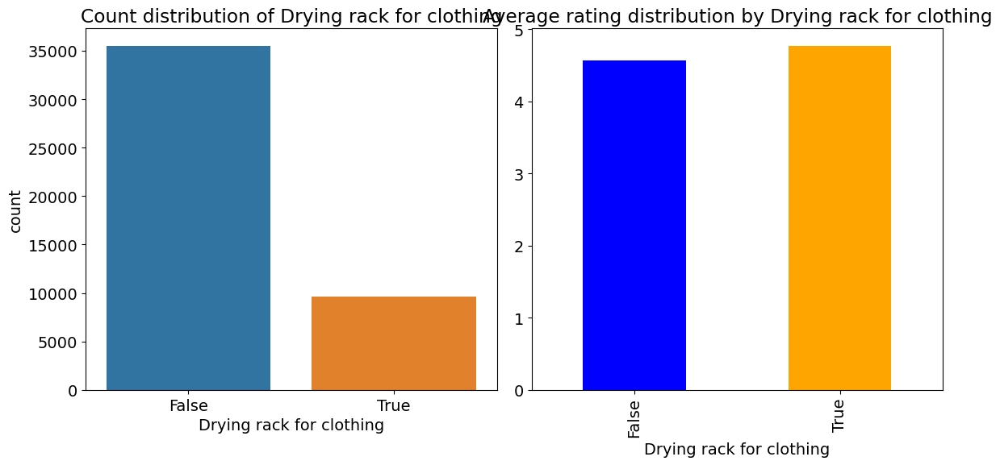

% Wise Split of Drying rack for clothing:
Drying rack for clothing
False    78.601461
True     21.398539
Name: proportion, dtype: float64

P-value for Drying rack for clothing: 0.0
Drying rack for clothing is statistically significant (p-value < 0.05)


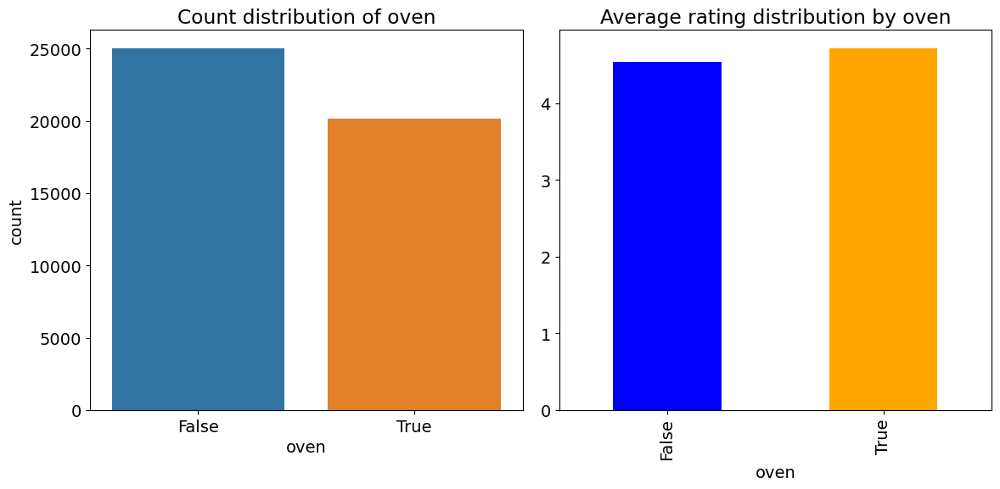

% Wise Split of oven:
oven
False    55.399425
True     44.600575
Name: proportion, dtype: float64

P-value for oven: 8.520798580749737e-211
oven is statistically significant (p-value < 0.05)


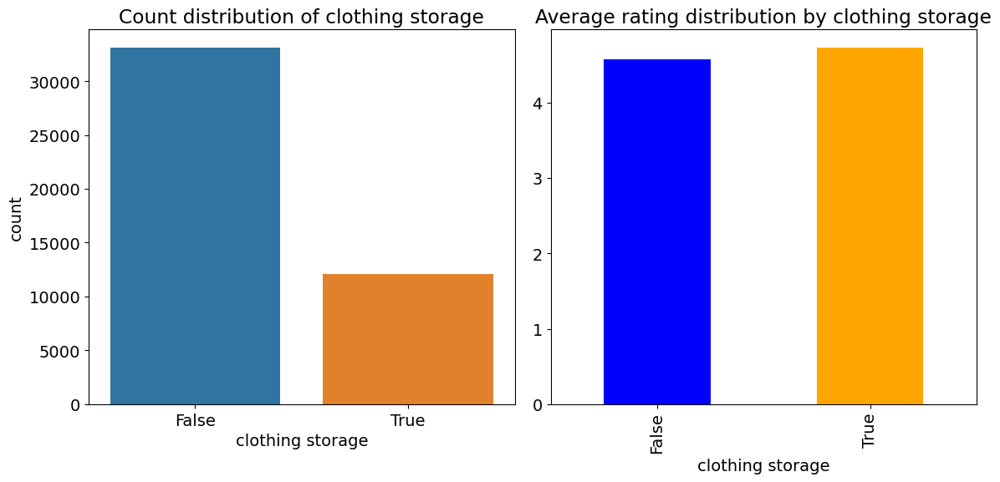

% Wise Split of clothing storage:
clothing storage
False    73.310467
True     26.689533
Name: proportion, dtype: float64

P-value for clothing storage: 7.344048086698437e-190
clothing storage is statistically significant (p-value < 0.05)


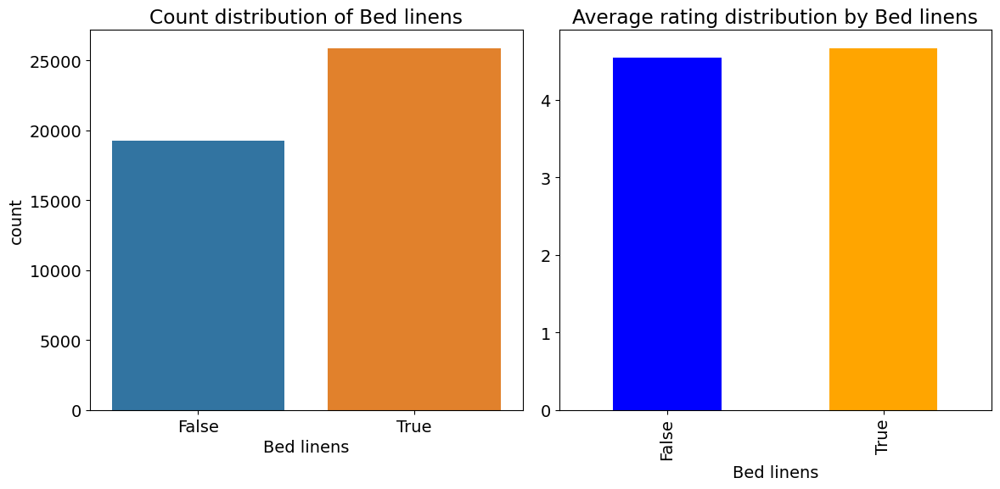

% Wise Split of Bed linens:
Bed linens
True     57.298075
False    42.701925
Name: proportion, dtype: float64

P-value for Bed linens: 1.0827087276194134e-79
Bed linens is statistically significant (p-value < 0.05)


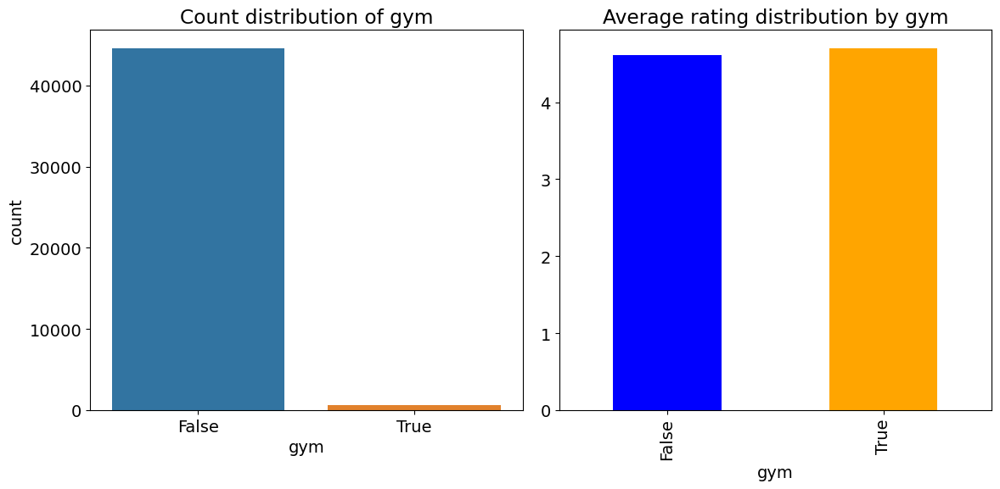

% Wise Split of gym:
gym
False    98.71653
True      1.28347
Name: proportion, dtype: float64

P-value for gym: 1.0634374795911607e-05
gym is statistically significant (p-value < 0.05)


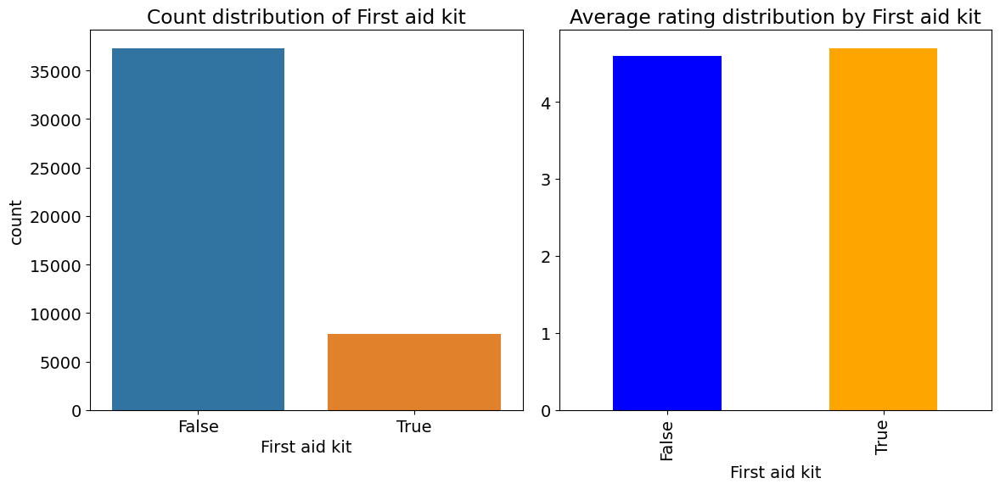

% Wise Split of First aid kit:
First aid kit
False    82.562514
True     17.437486
Name: proportion, dtype: float64

P-value for First aid kit: 7.210651735500972e-47
First aid kit is statistically significant (p-value < 0.05)


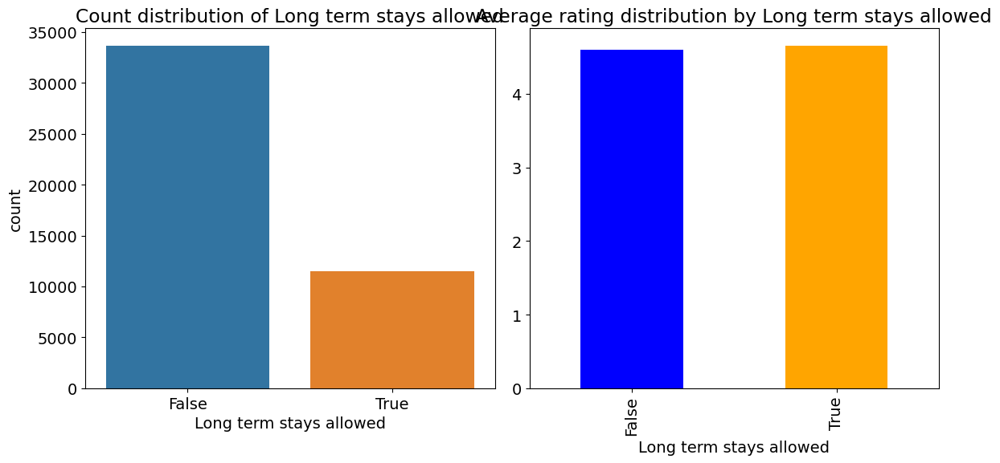

% Wise Split of Long term stays allowed:
Long term stays allowed
False    74.505422
True     25.494578
Name: proportion, dtype: float64

P-value for Long term stays allowed: 4.384944043644779e-21
Long term stays allowed is statistically significant (p-value < 0.05)


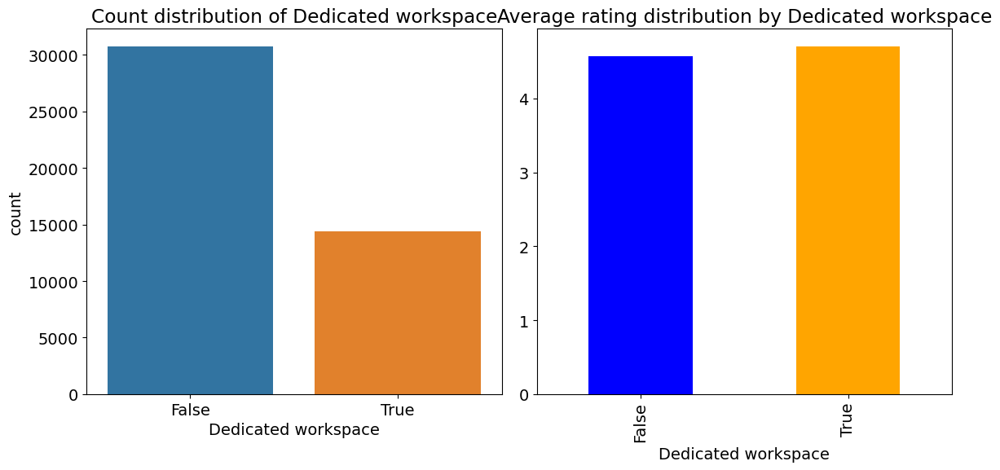

% Wise Split of Dedicated workspace:
Dedicated workspace
False    68.105776
True     31.894224
Name: proportion, dtype: float64

P-value for Dedicated workspace: 6.7417134266951736e-133
Dedicated workspace is statistically significant (p-value < 0.05)


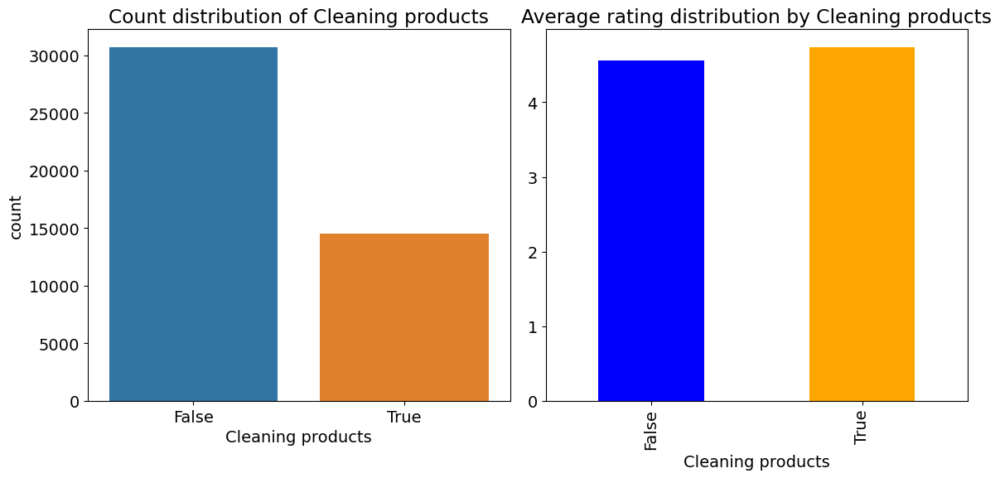

% Wise Split of Cleaning products:
Cleaning products
False    67.959726
True     32.040274
Name: proportion, dtype: float64

P-value for Cleaning products: 8.137991925164244e-271
Cleaning products is statistically significant (p-value < 0.05)


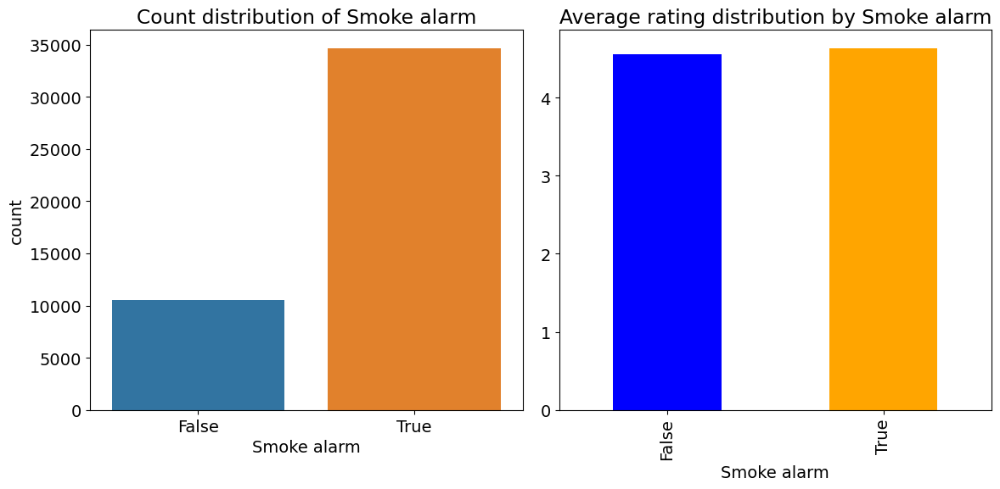

% Wise Split of Smoke alarm:
Smoke alarm
True     76.700597
False    23.299403
Name: proportion, dtype: float64

P-value for Smoke alarm: 8.237458629268084e-20
Smoke alarm is statistically significant (p-value < 0.05)


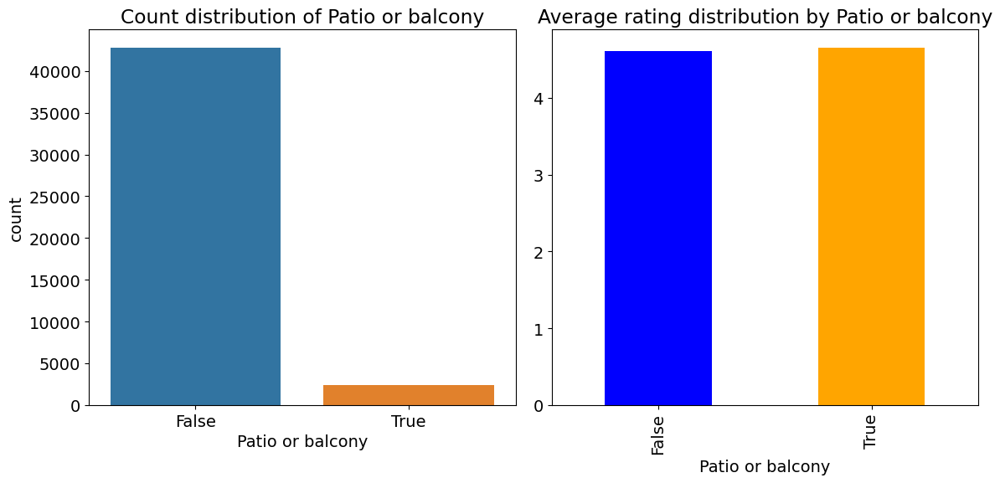

% Wise Split of Patio or balcony:
Patio or balcony
False    94.768754
True      5.231246
Name: proportion, dtype: float64

P-value for Patio or balcony: 0.0005517581734421063
Patio or balcony is statistically significant (p-value < 0.05)


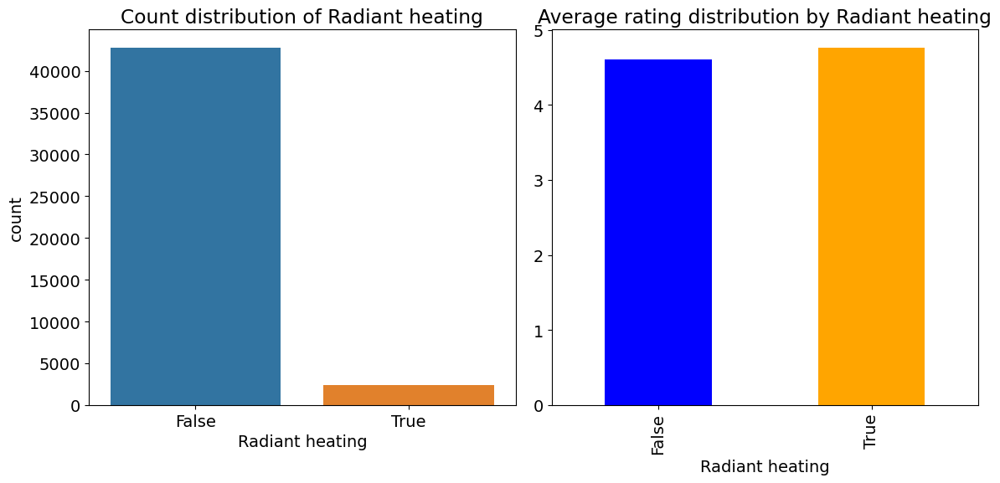

% Wise Split of Radiant heating:
Radiant heating
False    94.726709
True      5.273291
Name: proportion, dtype: float64

P-value for Radiant heating: 4.324736918787705e-93
Radiant heating is statistically significant (p-value < 0.05)


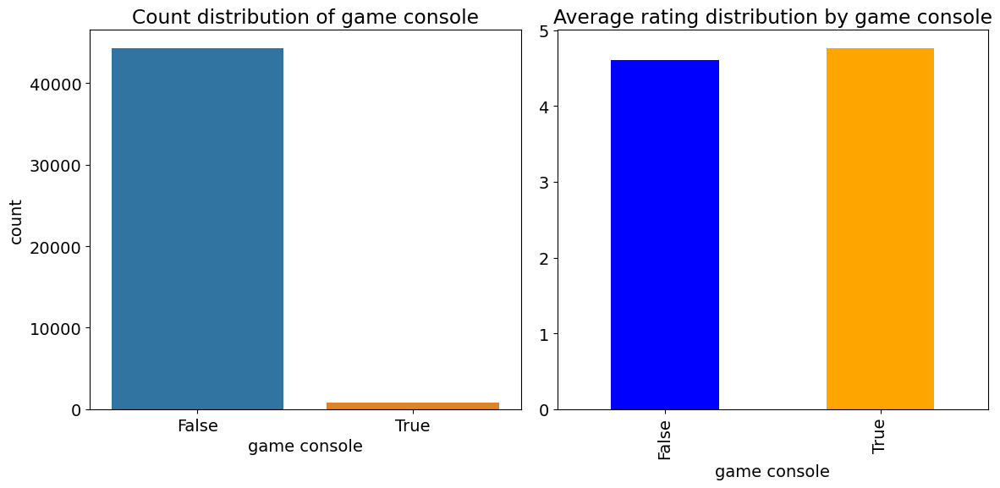

% Wise Split of game console:
game console
False    98.092498
True      1.907502
Name: proportion, dtype: float64

P-value for game console: 5.956250969590593e-29
game console is statistically significant (p-value < 0.05)


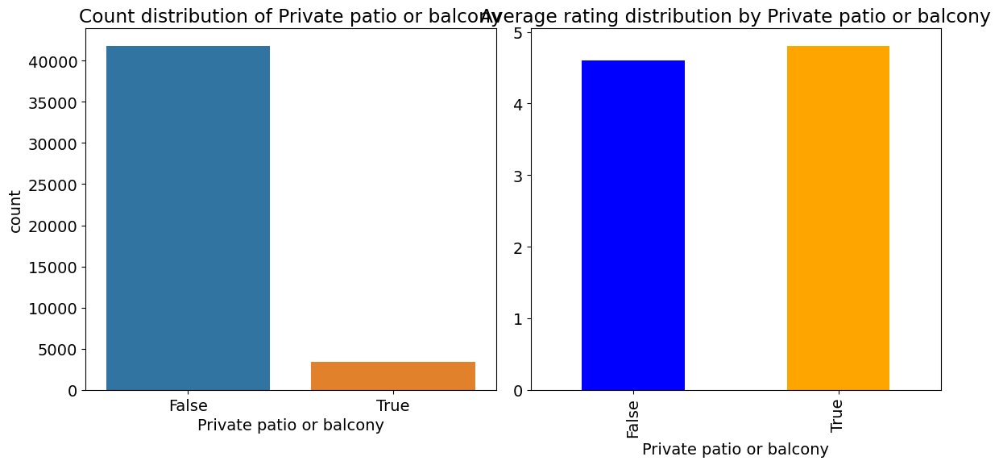

% Wise Split of Private patio or balcony:
Private patio or balcony
False    92.533746
True      7.466254
Name: proportion, dtype: float64

P-value for Private patio or balcony: 1.4521204994949805e-243
Private patio or balcony is statistically significant (p-value < 0.05)


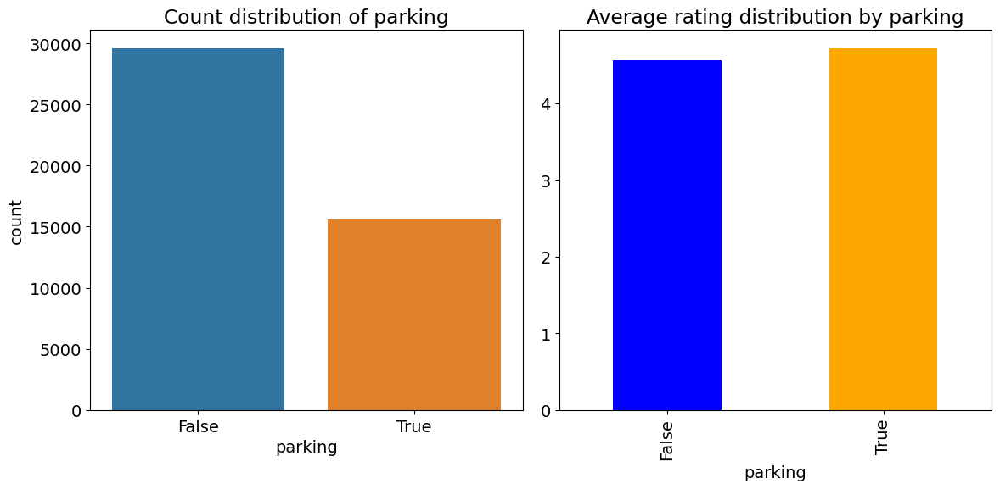

% Wise Split of parking:
parking
False    65.536623
True     34.463377
Name: proportion, dtype: float64

P-value for parking: 4.8087050636828154e-181
parking is statistically significant (p-value < 0.05)


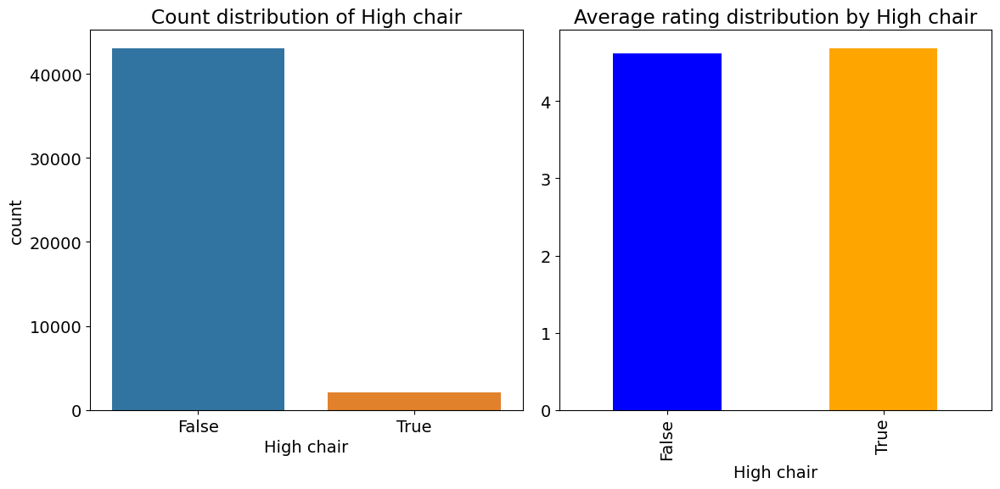

% Wise Split of High chair:
High chair
False    95.297632
True      4.702368
Name: proportion, dtype: float64

P-value for High chair: 6.664782427632313e-11
High chair is statistically significant (p-value < 0.05)


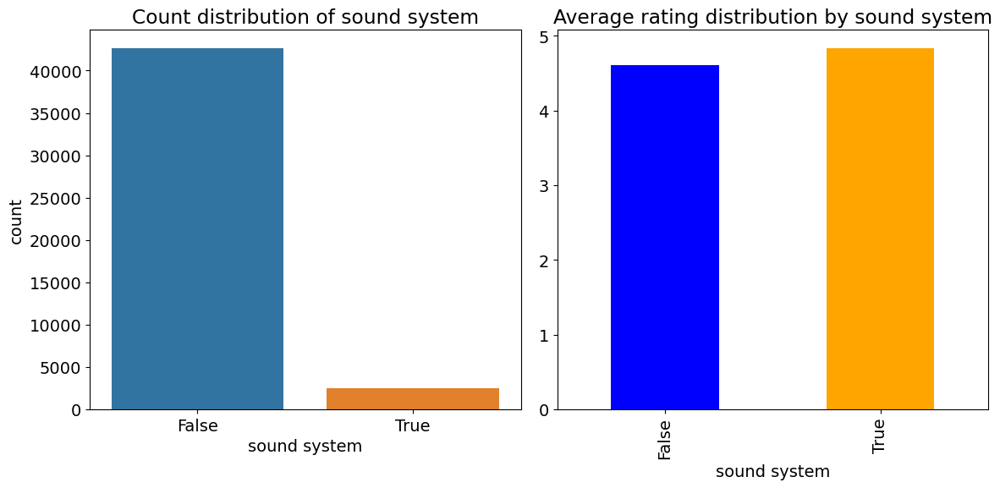

% Wise Split of sound system:
sound system
False    94.441248
True      5.558752
Name: proportion, dtype: float64

P-value for sound system: 0.0
sound system is statistically significant (p-value < 0.05)


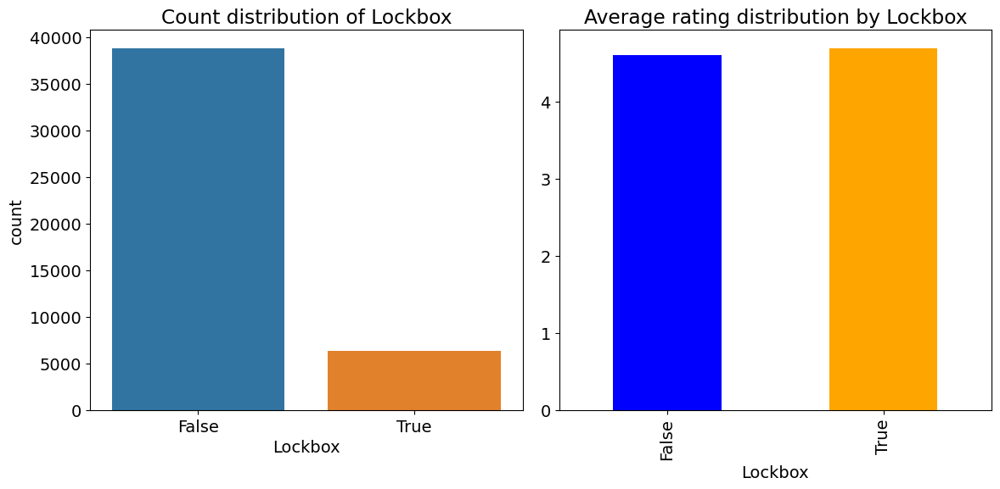

% Wise Split of Lockbox:
Lockbox
False    85.9106
True     14.0894
Name: proportion, dtype: float64

P-value for Lockbox: 9.911772245272555e-56
Lockbox is statistically significant (p-value < 0.05)


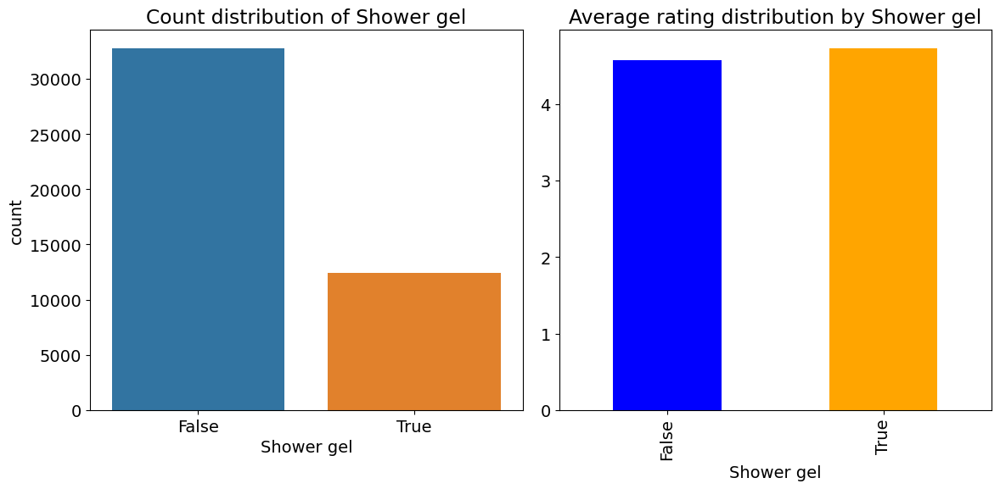

% Wise Split of Shower gel:
Shower gel
False    72.535959
True     27.464041
Name: proportion, dtype: float64

P-value for Shower gel: 1.9379132019082896e-201
Shower gel is statistically significant (p-value < 0.05)


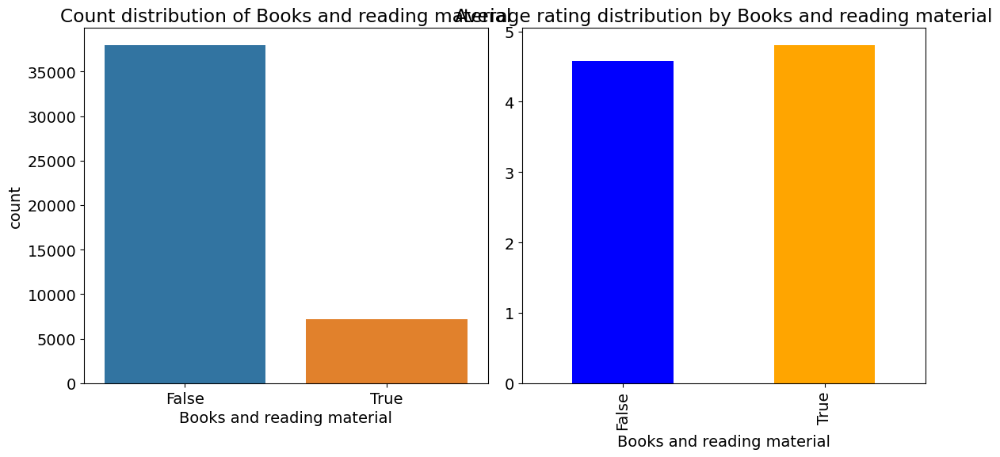

% Wise Split of Books and reading material:
Books and reading material
False    84.067272
True     15.932728
Name: proportion, dtype: float64

P-value for Books and reading material: 0.0
Books and reading material is statistically significant (p-value < 0.05)


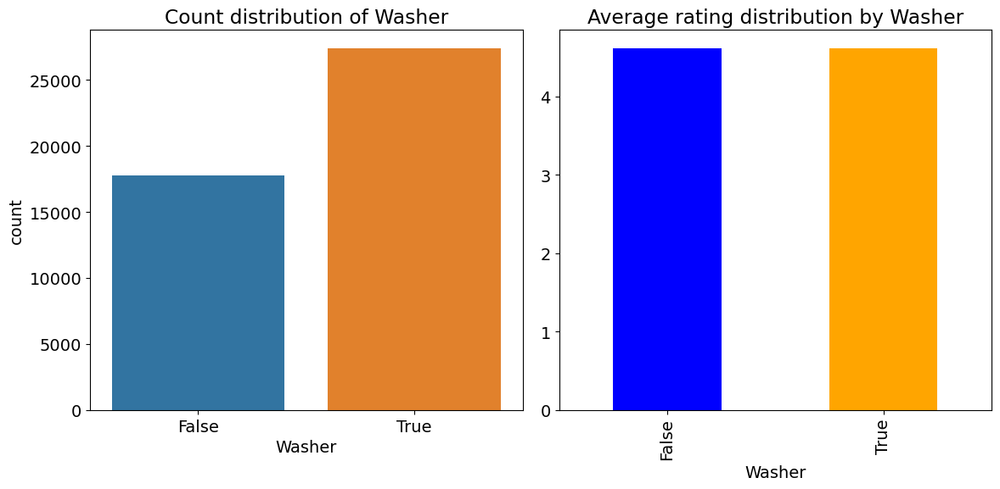

% Wise Split of Washer:
Washer
True     60.635096
False    39.364904
Name: proportion, dtype: float64

P-value for Washer: 0.27634888969791405
Washer is not statistically significant (p-value >= 0.05)


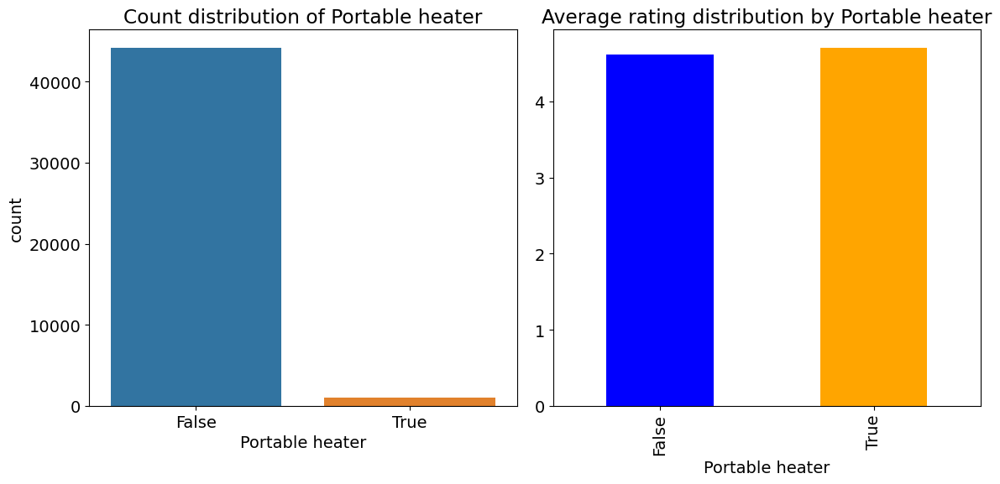

% Wise Split of Portable heater:
Portable heater
False    97.831379
True      2.168621
Name: proportion, dtype: float64

P-value for Portable heater: 5.793329290540965e-15
Portable heater is statistically significant (p-value < 0.05)


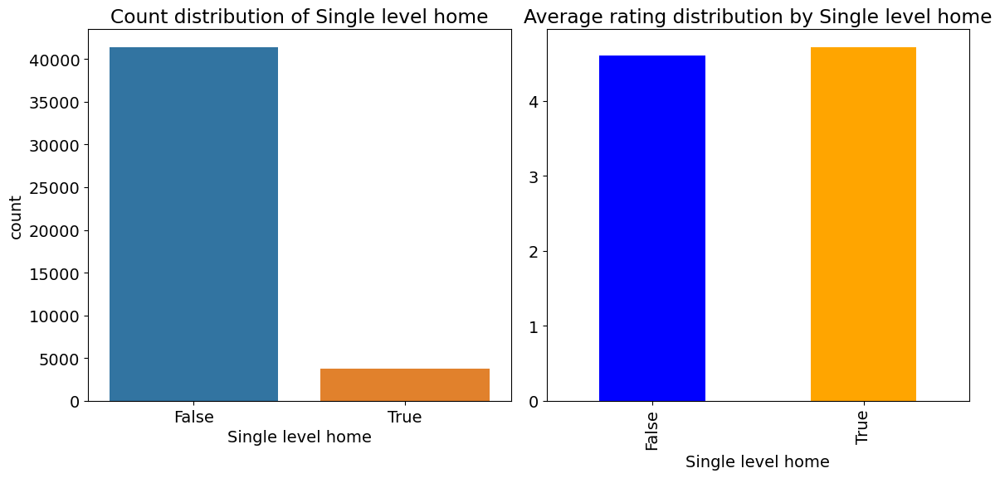

% Wise Split of Single level home:
Single level home
False    91.641956
True      8.358044
Name: proportion, dtype: float64

P-value for Single level home: 2.3259955489134472e-62
Single level home is statistically significant (p-value < 0.05)


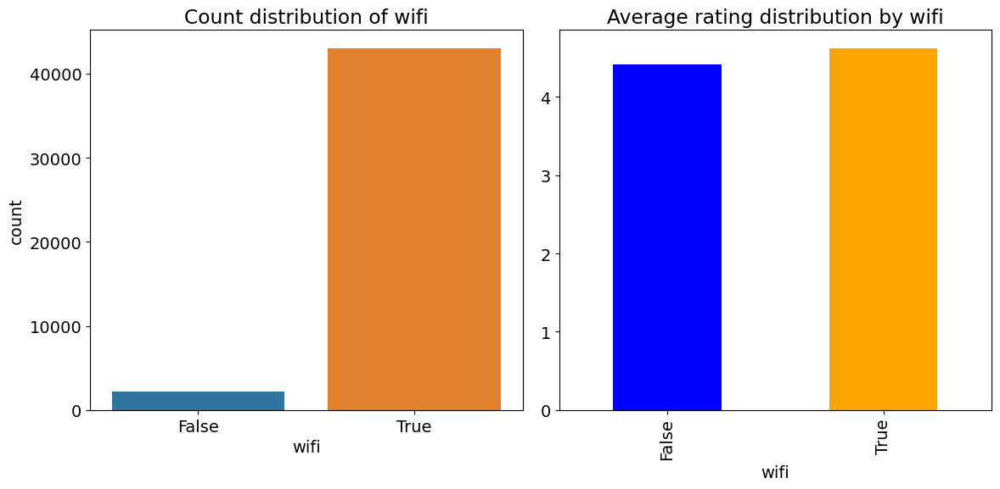

% Wise Split of wifi:
wifi
True     95.231246
False     4.768754
Name: proportion, dtype: float64

P-value for wifi: 9.117229679682693e-27
wifi is statistically significant (p-value < 0.05)


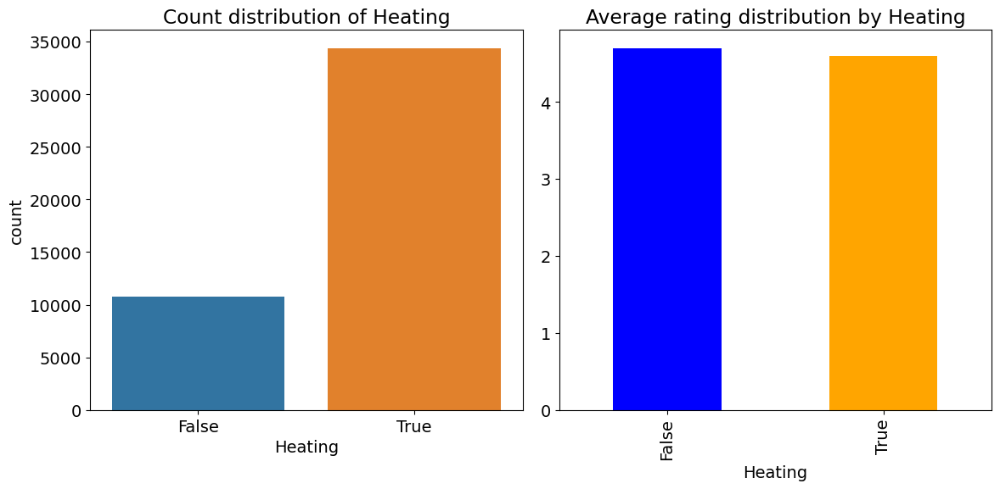

% Wise Split of Heating:
Heating
True     76.076566
False    23.923434
Name: proportion, dtype: float64

P-value for Heating: 4.5571508072197456e-60
Heating is statistically significant (p-value < 0.05)


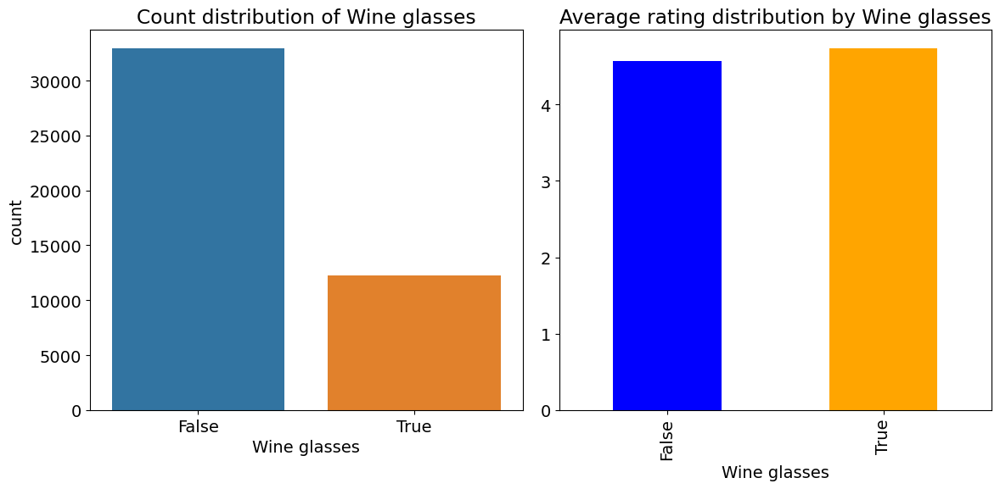

% Wise Split of Wine glasses:
Wine glasses
False    72.949768
True     27.050232
Name: proportion, dtype: float64

P-value for Wine glasses: 3.134095423779082e-231
Wine glasses is statistically significant (p-value < 0.05)


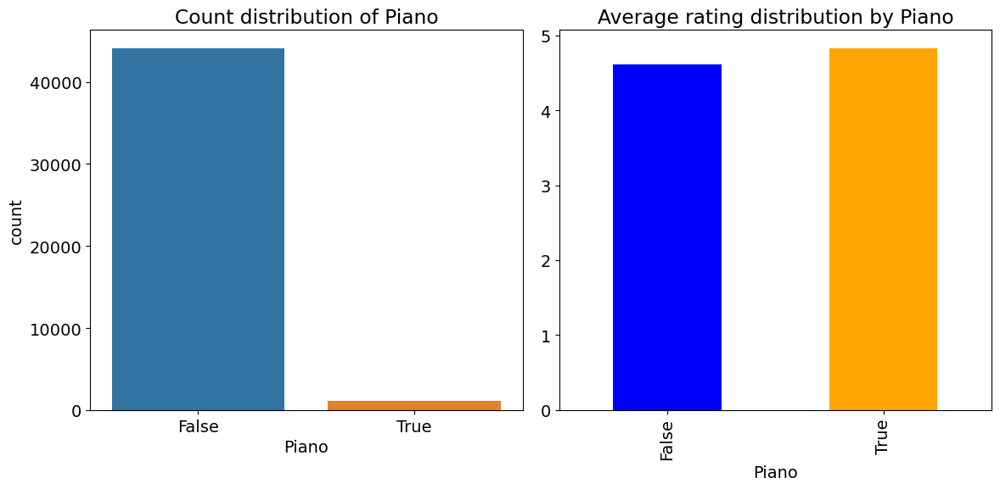

% Wise Split of Piano:
Piano
False    97.630007
True      2.369993
Name: proportion, dtype: float64

P-value for Piano: 5.297843762191427e-107
Piano is statistically significant (p-value < 0.05)


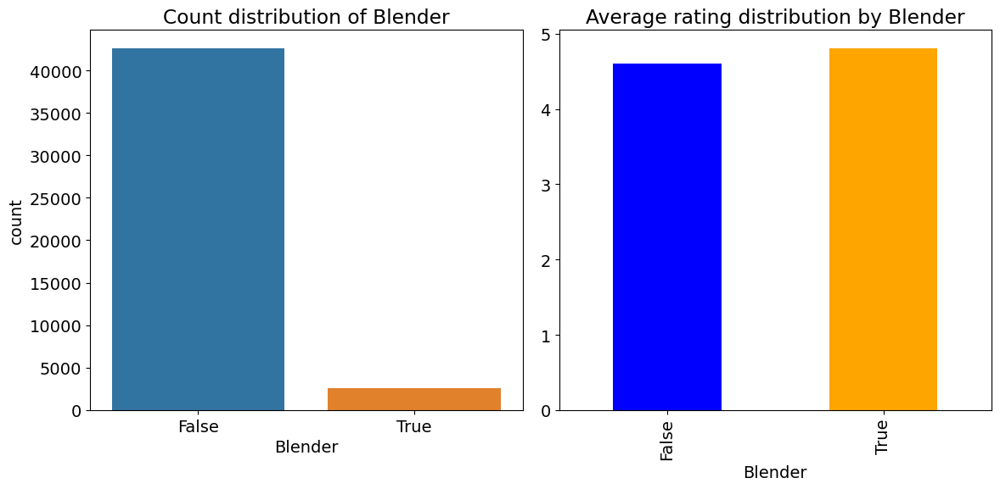

% Wise Split of Blender:
Blender
False    94.339456
True      5.660544
Name: proportion, dtype: float64

P-value for Blender: 1.0458934667281802e-226
Blender is statistically significant (p-value < 0.05)


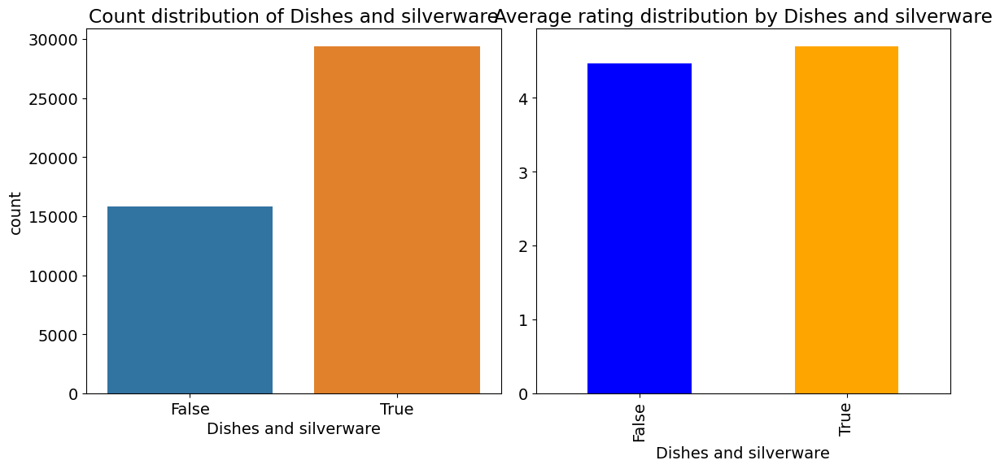

% Wise Split of Dishes and silverware:
Dishes and silverware
True     65.038725
False    34.961275
Name: proportion, dtype: float64

P-value for Dishes and silverware: 7.526510474132705e-197
Dishes and silverware is statistically significant (p-value < 0.05)


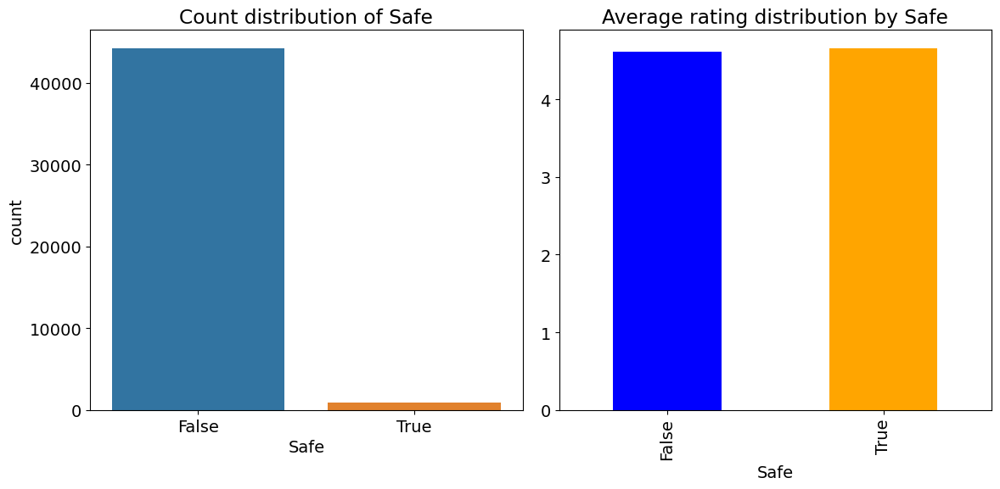

% Wise Split of Safe:
Safe
False    97.981854
True      2.018146
Name: proportion, dtype: float64

P-value for Safe: 0.0045811260872011365
Safe is statistically significant (p-value < 0.05)


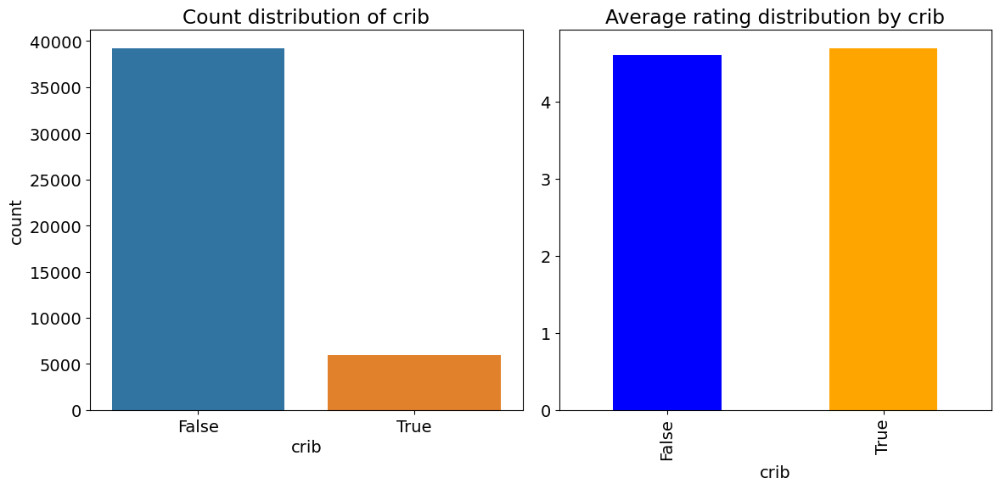

% Wise Split of crib:
crib
False    86.828944
True     13.171056
Name: proportion, dtype: float64

P-value for crib: 7.152857580131526e-48
crib is statistically significant (p-value < 0.05)


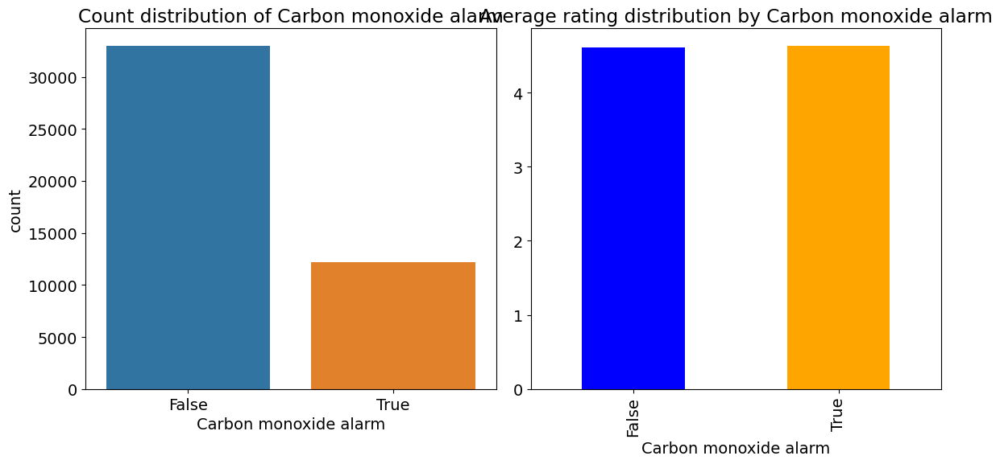

% Wise Split of Carbon monoxide alarm:
Carbon monoxide alarm
False    73.031644
True     26.968356
Name: proportion, dtype: float64

P-value for Carbon monoxide alarm: 4.391405851864343e-05
Carbon monoxide alarm is statistically significant (p-value < 0.05)


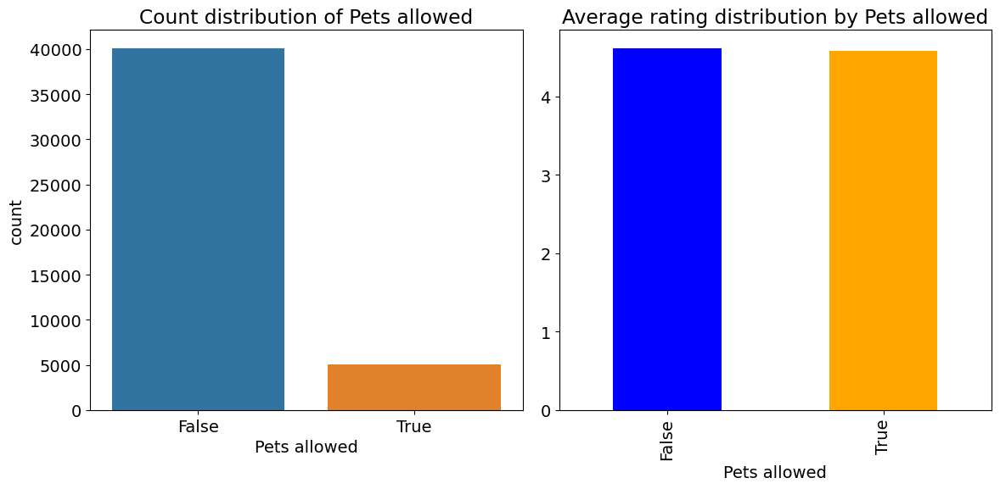

% Wise Split of Pets allowed:
Pets allowed
False    88.747511
True     11.252489
Name: proportion, dtype: float64

P-value for Pets allowed: 0.0007492747682046813
Pets allowed is statistically significant (p-value < 0.05)


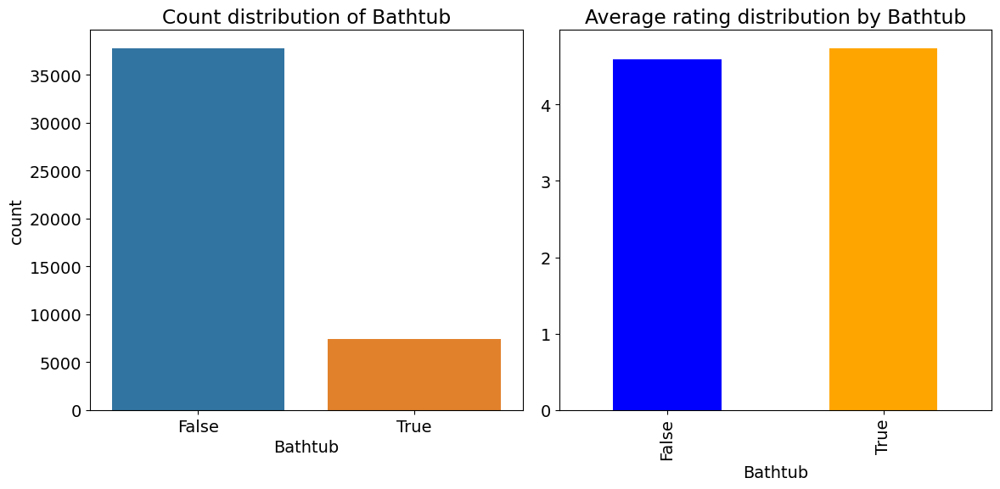

% Wise Split of Bathtub:
Bathtub
False    83.609206
True     16.390794
Name: proportion, dtype: float64

P-value for Bathtub: 8.347909026634923e-135
Bathtub is statistically significant (p-value < 0.05)


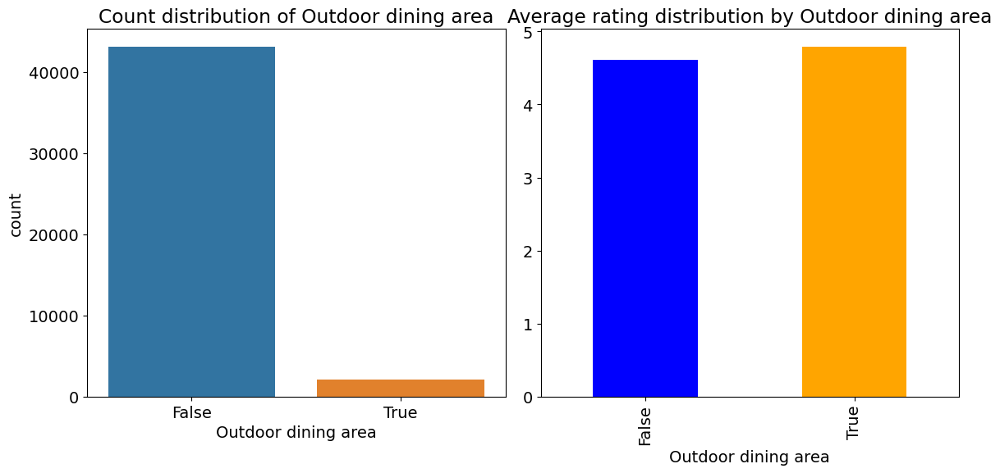

% Wise Split of Outdoor dining area:
Outdoor dining area
False    95.425979
True      4.574021
Name: proportion, dtype: float64

P-value for Outdoor dining area: 4.012283491984972e-104
Outdoor dining area is statistically significant (p-value < 0.05)


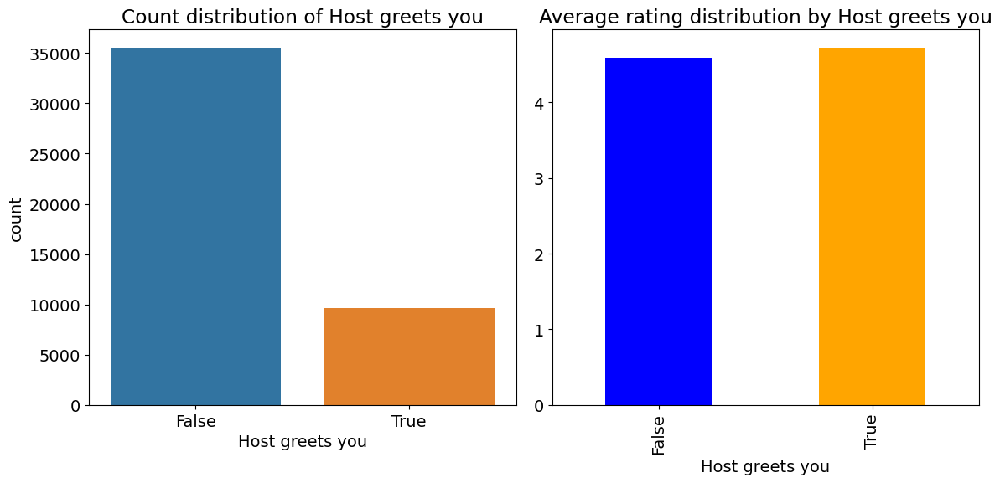

% Wise Split of Host greets you:
Host greets you
False    78.676698
True     21.323302
Name: proportion, dtype: float64

P-value for Host greets you: 2.5494783907991697e-124
Host greets you is statistically significant (p-value < 0.05)


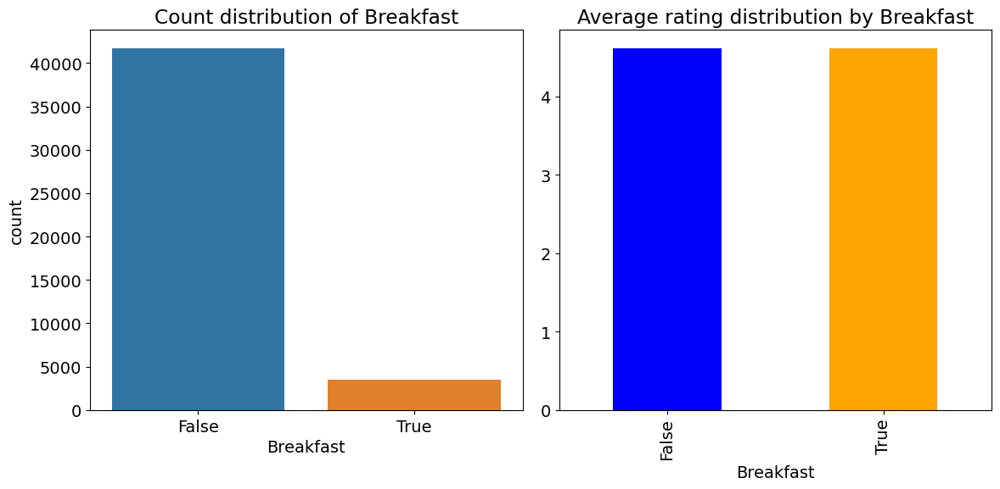

% Wise Split of Breakfast:
Breakfast
False    92.341226
True      7.658774
Name: proportion, dtype: float64

P-value for Breakfast: 0.9398221312677161
Breakfast is not statistically significant (p-value >= 0.05)


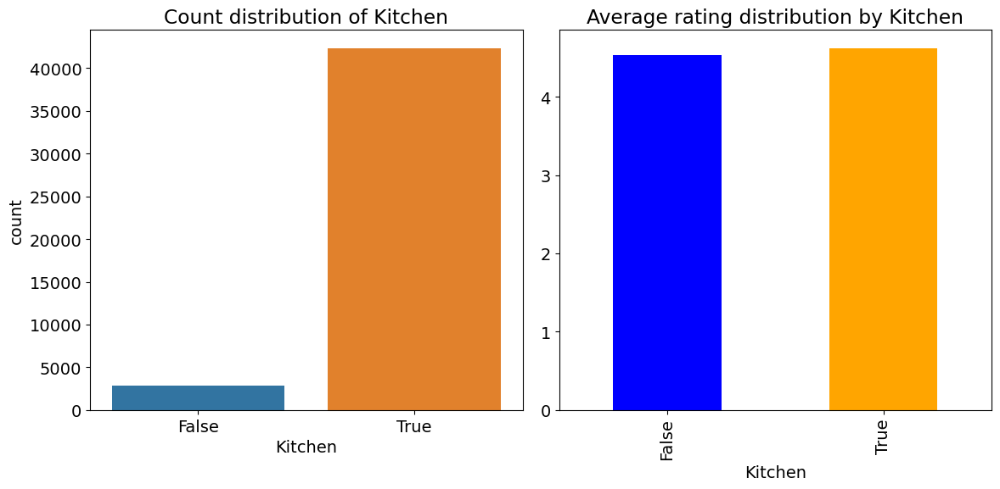

% Wise Split of Kitchen:
Kitchen
True     93.699934
False     6.300066
Name: proportion, dtype: float64

P-value for Kitchen: 3.7197270003074416e-11
Kitchen is statistically significant (p-value < 0.05)


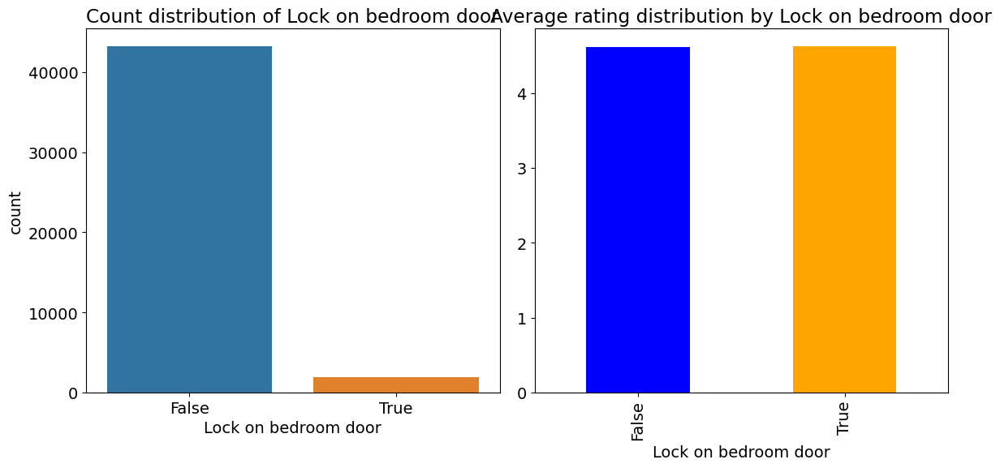

% Wise Split of Lock on bedroom door:
Lock on bedroom door
False    95.742421
True      4.257579
Name: proportion, dtype: float64

P-value for Lock on bedroom door: 0.3322846971349941
Lock on bedroom door is not statistically significant (p-value >= 0.05)


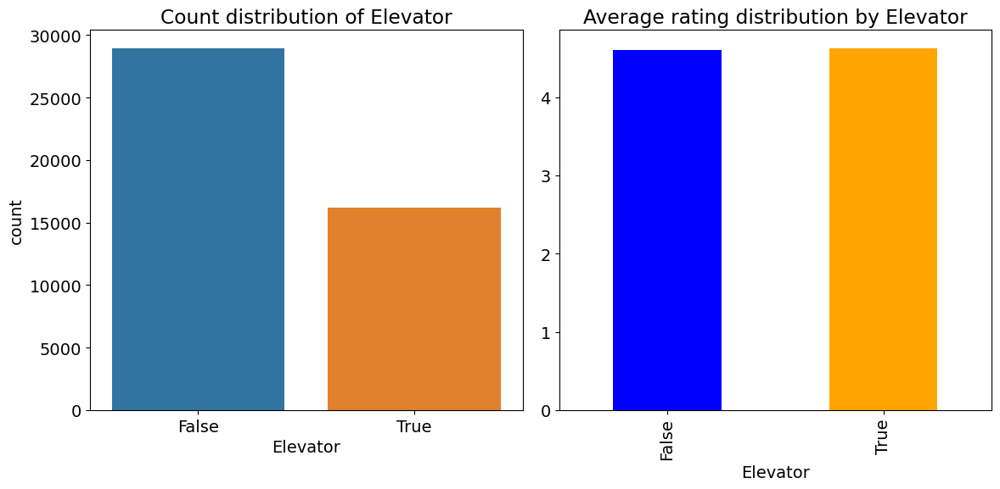

% Wise Split of Elevator:
Elevator
False    64.100465
True     35.899535
Name: proportion, dtype: float64

P-value for Elevator: 0.001871935178883293
Elevator is statistically significant (p-value < 0.05)


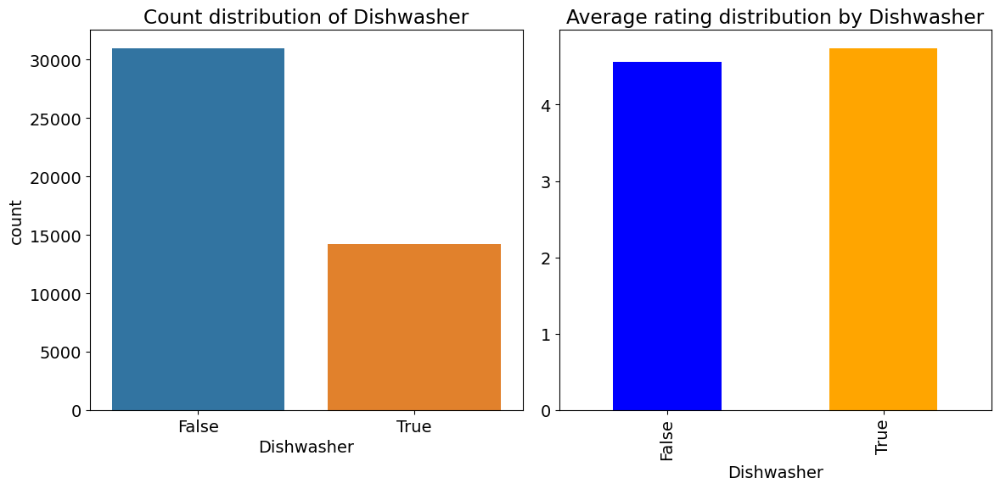

% Wise Split of Dishwasher:
Dishwasher
False    68.58597
True     31.41403
Name: proportion, dtype: float64

P-value for Dishwasher: 1.3452742077074916e-245
Dishwasher is statistically significant (p-value < 0.05)


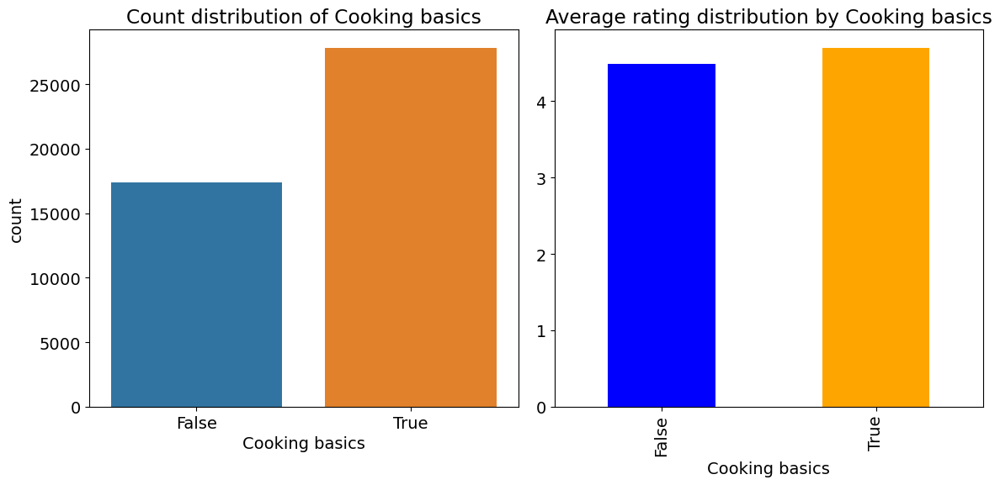

% Wise Split of Cooking basics:
Cooking basics
True     61.579996
False    38.420004
Name: proportion, dtype: float64

P-value for Cooking basics: 1.6565705319162263e-190
Cooking basics is statistically significant (p-value < 0.05)


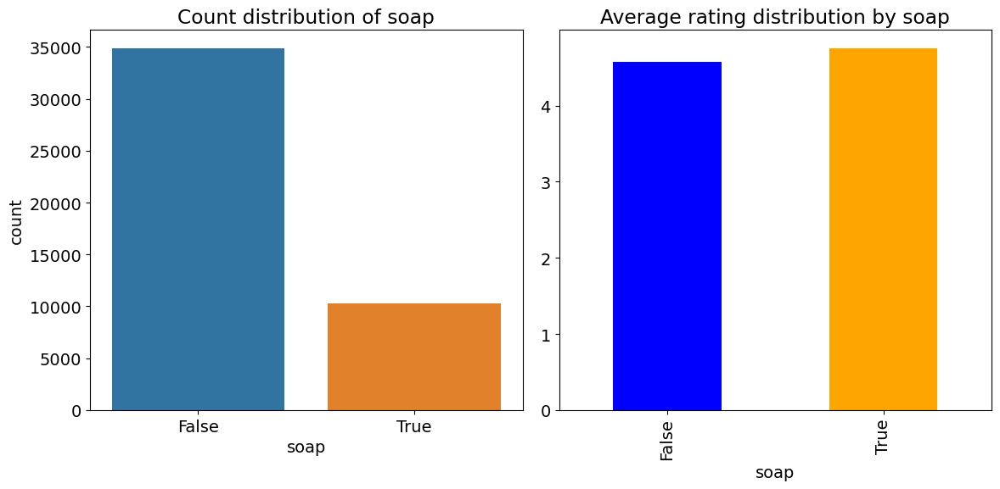

% Wise Split of soap:
soap
False    77.222837
True     22.777163
Name: proportion, dtype: float64

P-value for soap: 1.2508346810311337e-277
soap is statistically significant (p-value < 0.05)


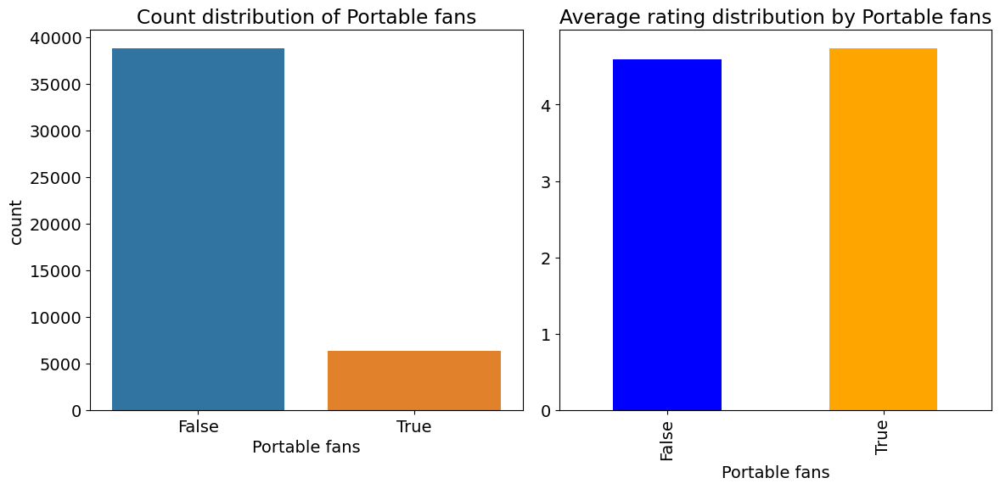

% Wise Split of Portable fans:
Portable fans
False    85.906174
True     14.093826
Name: proportion, dtype: float64

P-value for Portable fans: 4.2126148026576724e-141
Portable fans is statistically significant (p-value < 0.05)


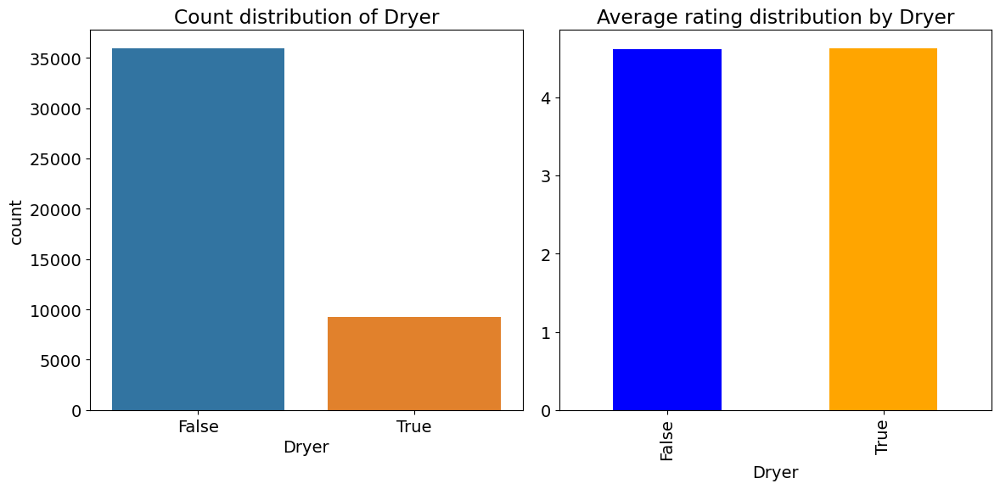

% Wise Split of Dryer:
Dryer
False    79.588405
True     20.411595
Name: proportion, dtype: float64

P-value for Dryer: 0.03062448400494745
Dryer is statistically significant (p-value < 0.05)


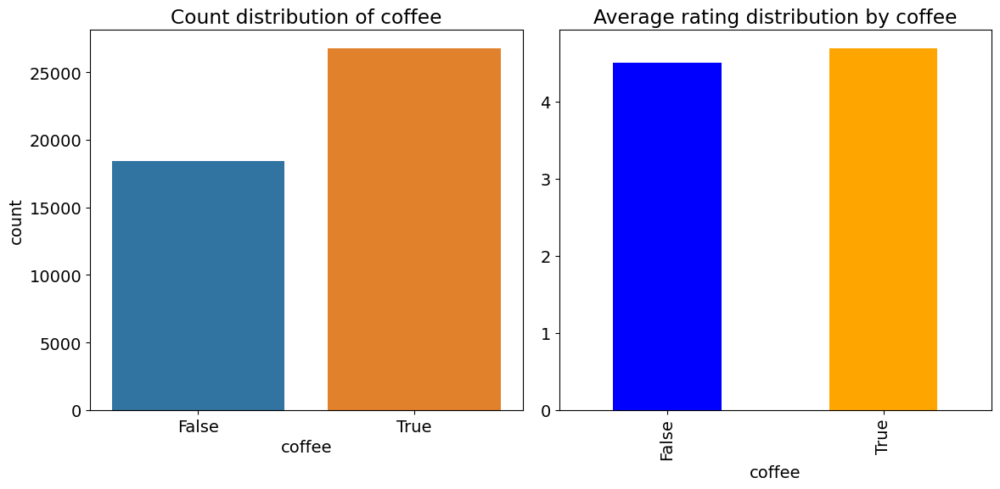

% Wise Split of coffee:
coffee
True     59.258686
False    40.741314
Name: proportion, dtype: float64

P-value for coffee: 3.081499756416684e-154
coffee is statistically significant (p-value < 0.05)


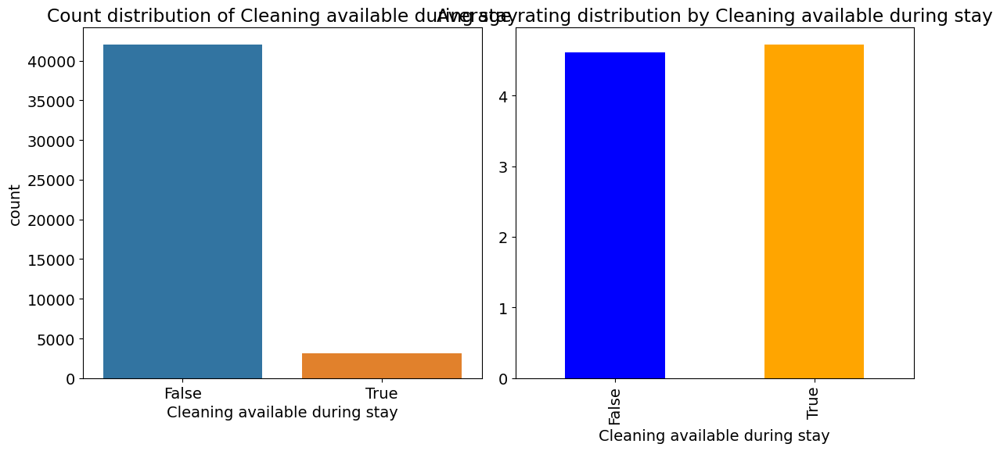

% Wise Split of Cleaning available during stay:
Cleaning available during stay
False    93.062624
True      6.937376
Name: proportion, dtype: float64

P-value for Cleaning available during stay: 4.530804298377103e-47
Cleaning available during stay is statistically significant (p-value < 0.05)


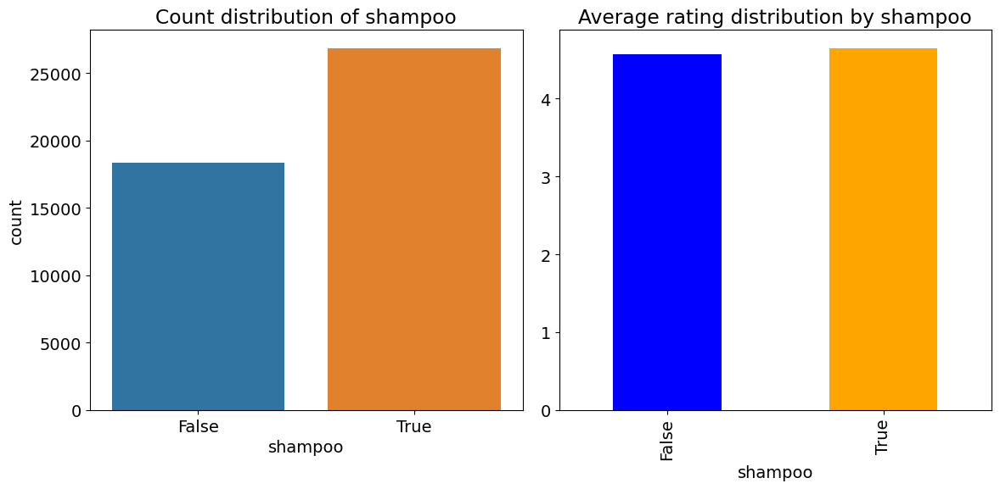

% Wise Split of shampoo:
shampoo
True     59.420226
False    40.579774
Name: proportion, dtype: float64

P-value for shampoo: 6.164554964689593e-34
shampoo is statistically significant (p-value < 0.05)


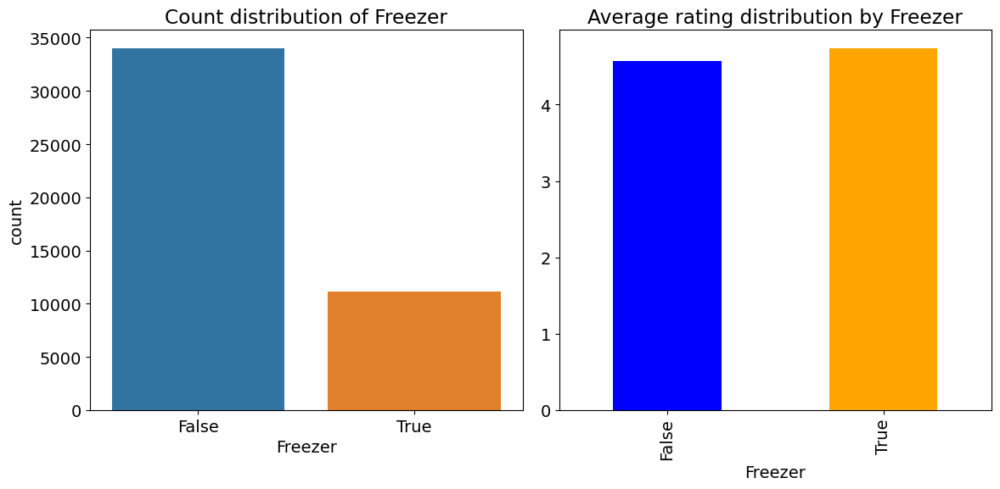

% Wise Split of Freezer:
Freezer
False    75.299845
True     24.700155
Name: proportion, dtype: float64

P-value for Freezer: 3.390412494533217e-223
Freezer is statistically significant (p-value < 0.05)


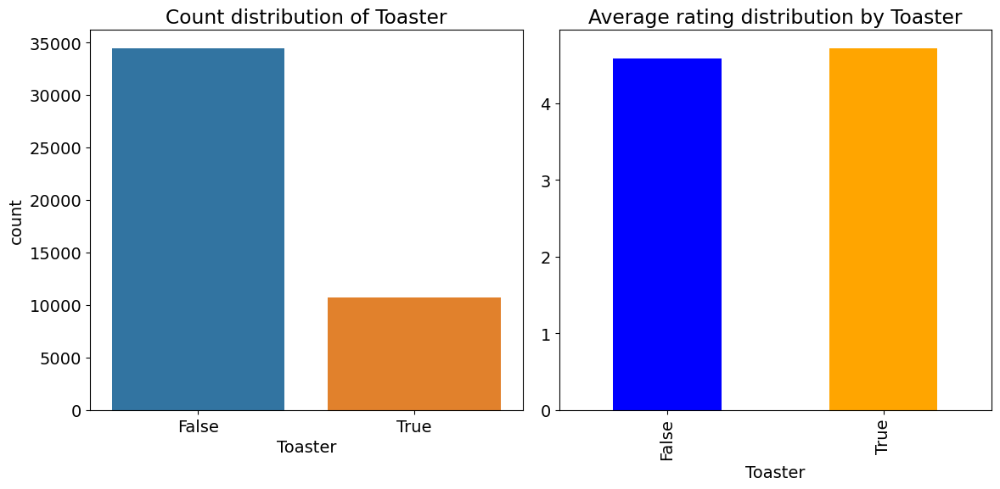

% Wise Split of Toaster:
Toaster
False    76.260235
True     23.739765
Name: proportion, dtype: float64

P-value for Toaster: 1.3821746880333325e-145
Toaster is statistically significant (p-value < 0.05)


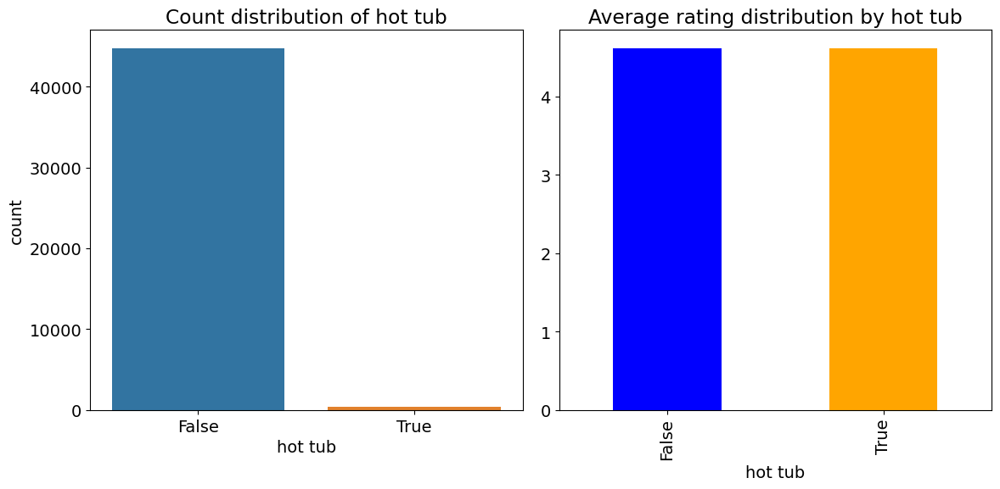

% Wise Split of hot tub:
hot tub
False    99.041823
True      0.958177
Name: proportion, dtype: float64

P-value for hot tub: 0.8878596693736569
hot tub is not statistically significant (p-value >= 0.05)


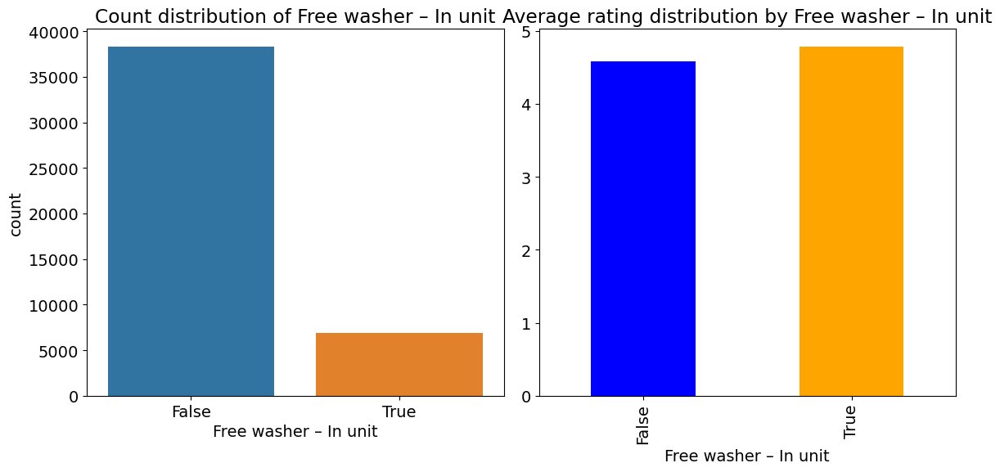

% Wise Split of Free washer – In unit:
Free washer – In unit
False    84.830715
True     15.169285
Name: proportion, dtype: float64

P-value for Free washer – In unit: 0.0
Free washer – In unit is statistically significant (p-value < 0.05)


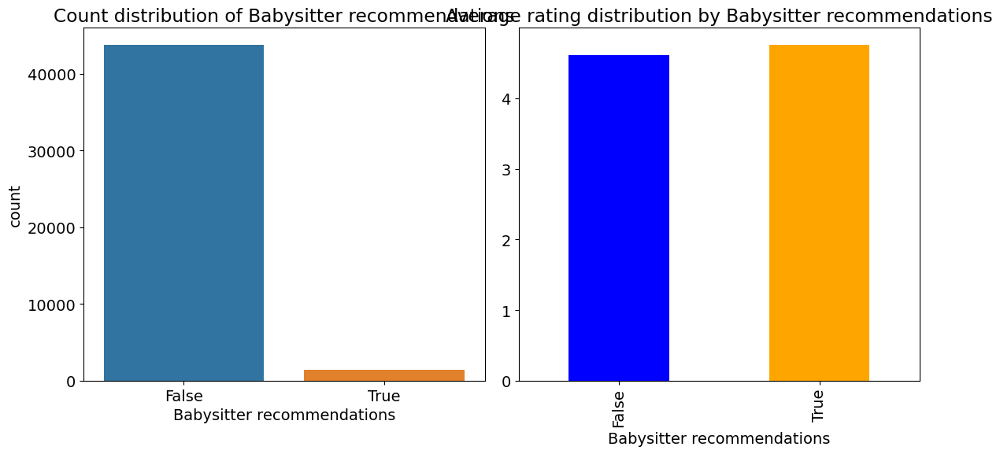

% Wise Split of Babysitter recommendations:
Babysitter recommendations
False    96.959504
True      3.040496
Name: proportion, dtype: float64

P-value for Babysitter recommendations: 2.571437433028722e-53
Babysitter recommendations is statistically significant (p-value < 0.05)


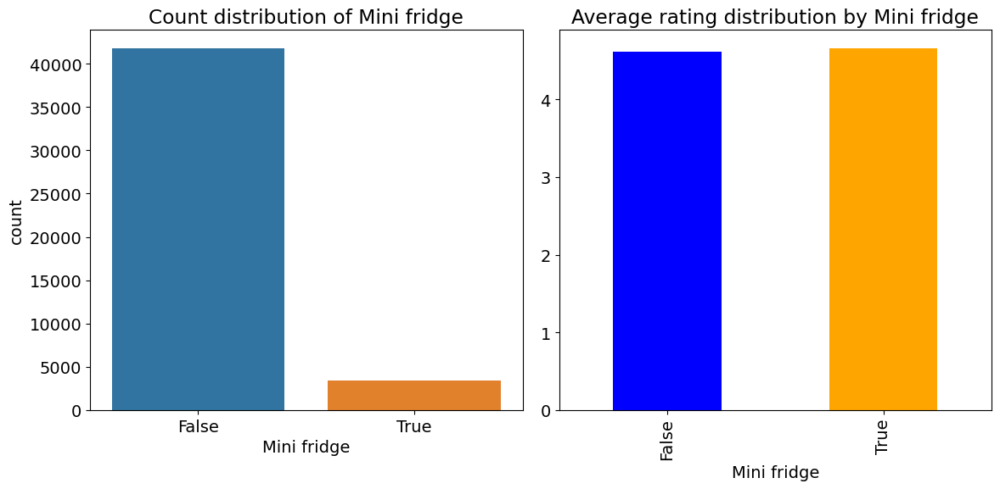

% Wise Split of Mini fridge:
Mini fridge
False    92.518256
True      7.481744
Name: proportion, dtype: float64

P-value for Mini fridge: 3.1127245465781614e-10
Mini fridge is statistically significant (p-value < 0.05)


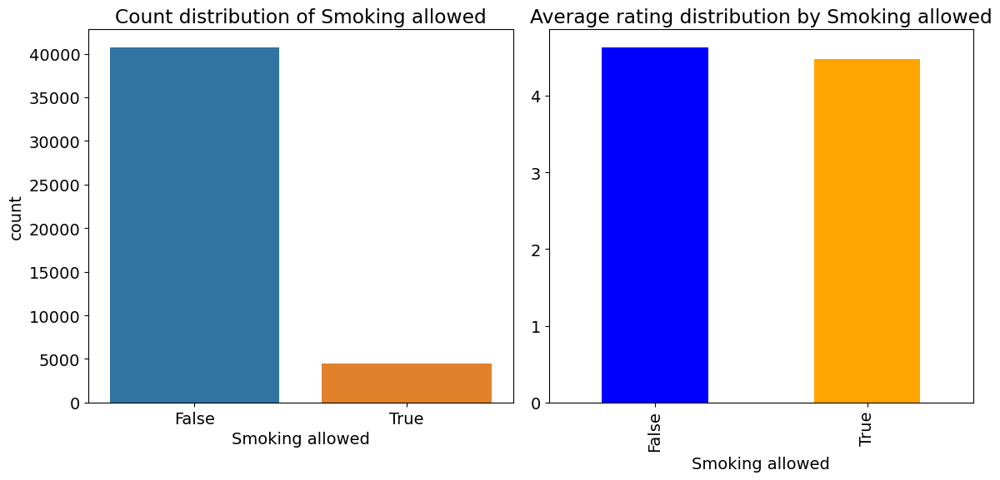

% Wise Split of Smoking allowed:
Smoking allowed
False    90.165966
True      9.834034
Name: proportion, dtype: float64

P-value for Smoking allowed: 1.466421963466314e-27
Smoking allowed is statistically significant (p-value < 0.05)


In [9]:
#now we are making a comparison against the rating and seeing if having the amenity might impact the rating

def binary_count_and_rating_plot(column_name,alpha=0.05):
    # Only taking the ones with reviews into consideration
    data = dataframe1[[column_name, 'review_scores_rating']].dropna()

    # Plot count distribution
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.countplot(x=column_name, data=data)
    plt.title(f'Count distribution of {column_name}')

    # Plot median price distribution
    plt.subplot(1, 2, 2)
    rating_mean = data.groupby(column_name)['review_scores_rating'].mean()
    rating_mean.plot(kind='bar', color=['blue', 'orange'])
    plt.title(f'Average rating distribution by {column_name}')
    plt.tight_layout()
    plt.show()

    # Calculate t-test for median prices
    true_ratings = data[data[column_name] == True]['review_scores_rating']
    false_ratings = data[data[column_name] == False]['review_scores_rating']
    t_stat, p_value = ttest_ind(true_ratings, false_ratings)
   
    # Display additional information
    percent_split = data[column_name].value_counts(normalize=True) * 100
    print(f'% Wise Split of {column_name}:\n{percent_split}')
    t_statistic, p_value = ttest_ind(true_ratings, false_ratings, equal_var=False)  # assuming unequal variances
    print(f'\nP-value for {column_name}: {p_value}')
    
    # Check if p-value is greater than or equal to alpha
    if p_value >= alpha:
        print(f"{column_name} is not statistically significant (p-value >= {alpha})")
        return column_name
    else:
        print(f"{column_name} is statistically significant (p-value < {alpha})")
        return None  # or any other value if needed
    
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = 20, 20
result = [binary_count_and_rating_plot(col) for col in dataframe1.iloc[:,51:-2].columns]

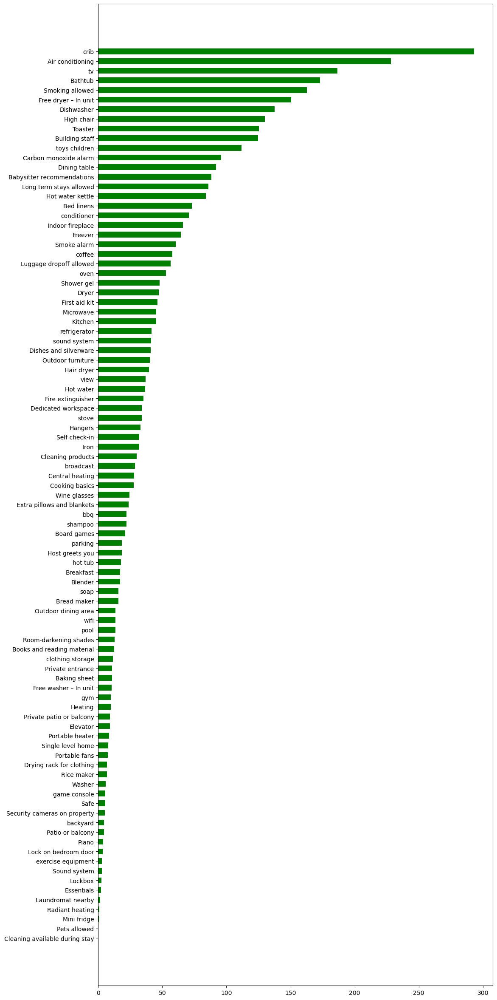

In [10]:
from collections import OrderedDict

def collect_pvalues(columns_of_interest):
    all_pvalues = {}

    for column_name in columns_of_interest:
        # Drop rows with missing values in the specified columns
        data = dataframe1[[column_name, 'price']].dropna()

        # Calculate t-test for median prices
        true_prices = data[data[column_name] == True]['price']
        false_prices = data[data[column_name] == False]['price']
        t_statistic, p_value = ttest_ind(true_prices, false_prices, equal_var=False)  # assuming unequal variances
        all_pvalues[column_name] = {'p_value': p_value, 't_statistic': t_statistic}

    return all_pvalues

columns_of_interest = dataframe1.iloc[:, 51:-2].columns.values
result = collect_pvalues(columns_of_interest)
# Extract p-values and create a dictionary

all_pvalues = {}
for column in result:
    p_value = result[column]['p_value']
    if isinstance(p_value, np.float64):
        all_pvalues[column] = p_value
    else:
        all_pvalues[column] = [float(val) for val in p_value]

import math
#P-values of effects of each amanity on price can be visualized using the 'Manhattan-plot' approach: taking the minus log of the P-value:
# -log Pvalues and order
all_pvalues.update({k: -1*np.log(v) for k, v in all_pvalues.items()})
ordereddict = OrderedDict(sorted(all_pvalues.items(), key=lambda t: t[1]))
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = 12, 30
plt.barh(list(ordereddict.keys()), list(ordereddict.values()),color='g', height=0.6)
plt.show()

Of the Airbnb hosts that are still listing on the site, the first joined on 17 April 2008, and the most recent joined on 12 March 2023.


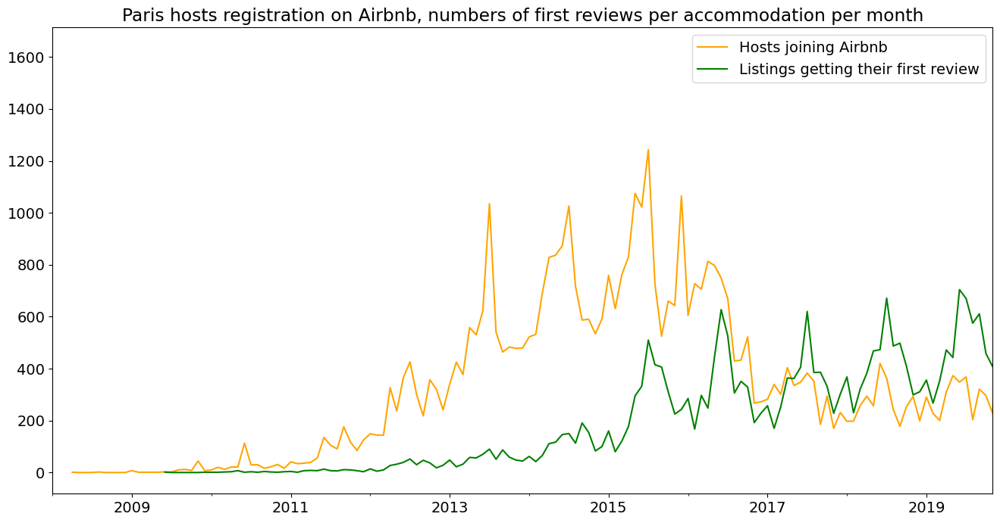

In [11]:
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = 16, 8

print(f"Of the Airbnb hosts that are still listing on the site, the first joined on {min(dataframe1.host_since).strftime('%d %B %Y')}, and the most recent joined on {max(dataframe1.host_since).strftime('%d %B %Y')}.")


dataframe1.set_index('host_since').resample('MS').size().plot(label='Hosts joining Airbnb', color='orange')
dataframe1.set_index('first_review').resample('MS').size().plot(label='Listings getting their first review', color='green')
plt.title('Paris hosts registration on Airbnb, numbers of first reviews per accommodation per month')
plt.legend()
plt.xlim('2008-01-01', '2019-11-30') # Limiting to whole months
plt.xlabel('')
plt.ylabel('')
plt.show()

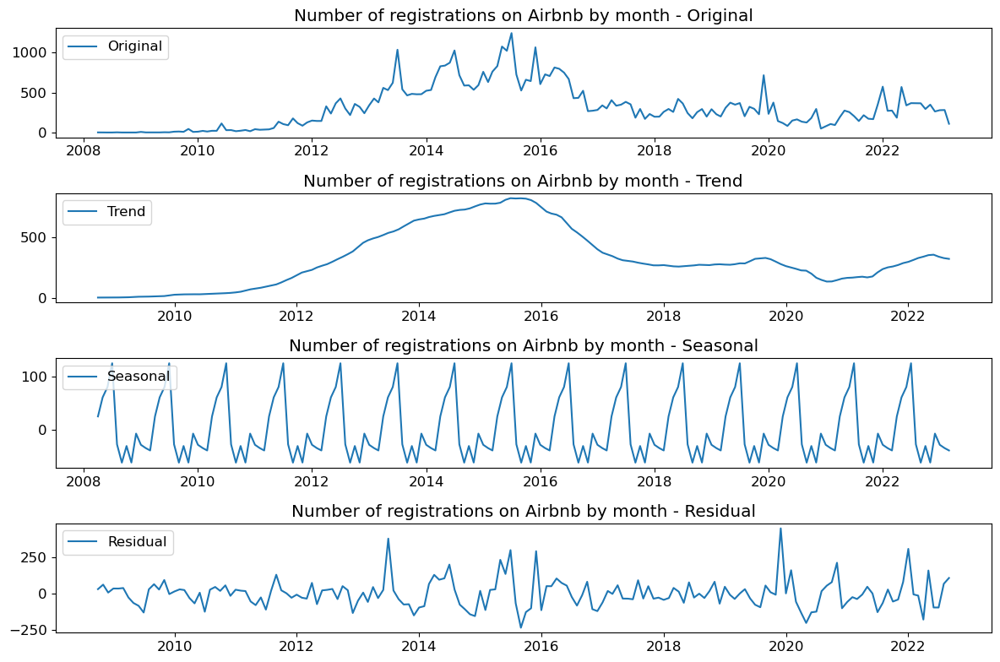

In [12]:
from statsmodels.tsa.seasonal import seasonal_decompose


def decompose_time_series(ts, title=''):
    decomposition = seasonal_decompose(ts)
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    plt.figure(figsize=(12, 8))

    plt.subplot(411)
    plt.plot(ts, label='Original')
    plt.legend(loc='upper left')
    plt.title(f'{title} - Original')

    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.legend(loc='upper left')
    plt.title(f'{title} - Trend')

    plt.subplot(413)
    plt.plot(seasonal, label='Seasonal')
    plt.legend(loc='upper left')
    plt.title(f'{title} - Seasonal')

    plt.subplot(414)
    plt.plot(residual, label='Residual')
    plt.legend(loc='upper left')
    plt.title(f'{title} - Residual')

    plt.tight_layout()
    plt.show()
    
# Creating dataframes for time series analysis
ts_host_since = pd.DataFrame(dataframe1.set_index('host_since').resample('MS').size())
ts_first_review = pd.DataFrame(dataframe1.set_index('first_review').resample('MS').size())

# Renaming columns
ts_host_since = ts_host_since.rename(columns={0: 'hosts'})
ts_host_since.index.rename('month', inplace=True)
ts_first_review = ts_first_review.rename(columns={0: 'reviews'})
ts_first_review.index.rename('month', inplace=True)

plt.rcParams['font.size'] = 12
plt.rcParams['figure.figsize'] = 50, 70
decompose_time_series(ts_host_since, title='Number of registrations on Airbnb by month')

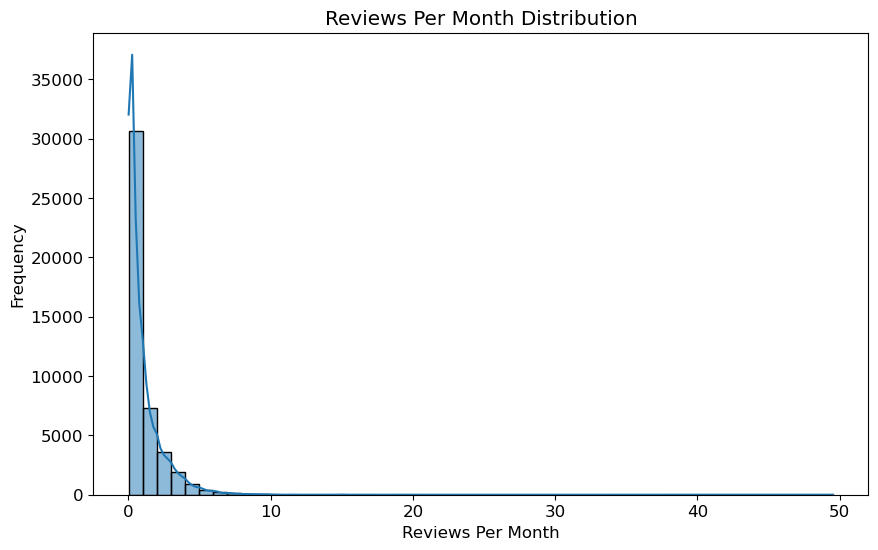

In [13]:
plt.figure(figsize=(10, 6))
sns.histplot(dataframe1['reviews_per_month'].dropna(), bins=50, kde=True)
plt.xlabel('Reviews Per Month')
plt.ylabel('Frequency')
plt.title('Reviews Per Month Distribution')
plt.show()

In [14]:
import folium
from folium.plugins import HeatMap

# Create a base map using the mean latitude and longitude values
mean_lat = dataframe1['latitude'].mean()
mean_lon = dataframe1['longitude'].mean()

m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Create a HeatMap layer with price as the intensity
heat_data = [[row['latitude'], row['longitude'], row['price']] for index, row in dataframe1.iterrows()]
HeatMap(heat_data, radius=15, blur=10).add_to(m)

# Display the map in Jupyter Notebook
m

In [15]:
# Finding out the neighborhoods that correspond with the rules we've established.
top_6 = (dataframe1.groupby(['neighbourhood'])['id'].count()
        .sort_values(ascending = False).head(6))

# Let's make a list containing all the 'top_6' Series neighborhoods.
desirable_neighborhoods = list(top_6.index)

# Here, we'll perform a group by. It will list all neighborhoods 
# and their property types available. Also, it will count the number of 
# dwellings each residence kind has.
property_types_count = dataframe1.groupby(['neighbourhood','property_type'], as_index = False)['id'].count()
property_types_count = (property_types_count.sort_values(by = 'id', ascending = False)) 

# Let's make a list containing all the 'top_6' Series neighborhoods.
desirable_neighborhoods = list(top_6.index)

# We'll  filter the DF so that it only contains residences registered 
# in the 'desirable_neighborhoods' list.
property_types_count = (property_types_count[property_types_count['neighbourhood']
                                             .isin(desirable_neighborhoods)])

# And that's it! We are set to plot the chart!
import plotly.express as px

# Unfortunately plotly has a bug for the sunburst plot 
# in which it does not recognize the 'id' column for the chart creation. 

# Hence we'll have to make a second column with the same data.
# We are going to call the new column 'Number of Dwellings'
property_types_count['Number of Dwellings'] = property_types_count['id']

# Finally plotting the sunburst chart!
figure = px.sunburst(property_types_count, values = 'Number of Dwellings', 
                     path = ['neighbourhood','property_type'], width = 600, height = 600, 
                     title = 'Dwelling Type Composition')

figure.update_traces(textinfo="label+percent parent")
figure.show()

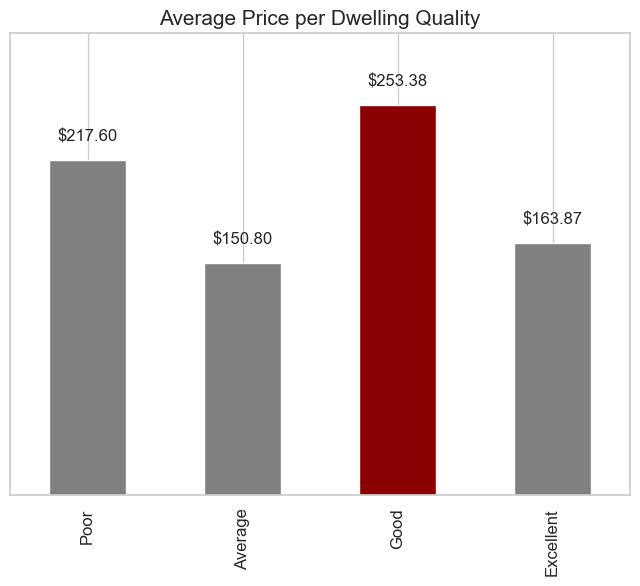

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cut the 'review_scores_value' into categories
categories = pd.cut(dataframe1['review_scores_value'].dropna(), 4, labels=['Poor', 'Average', 'Good', 'Excellent'])
dataframe1['Lodging Quality'] = categories

# Filter out residences with no customer evaluation
no_nan = dataframe1[~dataframe1['review_scores_value'].isnull()]

# Set seaborn style
sns.set(style='whitegrid')

# Group by 'Lodging Quality' and calculate the average price for each category
groups = no_nan.groupby('Lodging Quality')['price'].mean()

# Set the figure size
plt.figure(figsize=(8, 6))

# Plot the bar chart with adjusted ylim
chart = groups.plot(kind='bar', ylim=(0, 300), xlabel='', yticks=[], fontsize=12, color=['grey', 'grey', 'darkred', 'grey'])

# Display average prices on top of the bars
for i, price in enumerate(groups):
    plt.text(i, price + 10, f'${price:.2f}', ha='center', va='bottom', fontdict={'size': 12})

# Set the graph title
plt.title('Average Price per Dwelling Quality', fontdict={'size': 15})

# Show the plot
plt.show()

The percentage of listings with 1 bedroom(s) is: 62.35%
The percentage of listings with 0 bedroom(s) is: 15.71%
The percentage of listings with 2 bedroom(s) is: 15.70%
The percentage of listings with 3 bedroom(s) is: 4.81%
The percentage of listings with 4 bedroom(s) is: 1.16%
The percentage of listings with 5 bedroom(s) is: 0.22%
The percentage of listings with 6 bedroom(s) is: 0.05%
The percentage of listings with 7 bedroom(s) is: 0.01%


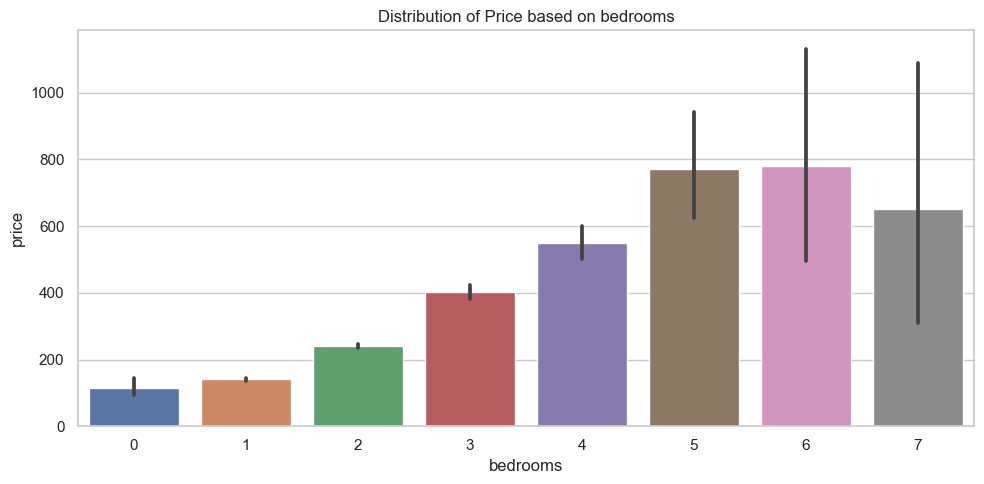

In [17]:
#showing the distribution between price and amount of bedrooms
figsize = (10, 5)
x = 'bedrooms'

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=figsize)
gs = gridspec.GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1)
ax1.set_title(f'Distribution of Price based on {x}')

# Calculate the percentage of each bedroom count relative to all listings
bedroom_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for bedrooms, percentage in bedroom_percentage.items():
    print(f'The percentage of listings with {bedrooms} bedroom(s) is: {percentage:.2f}%')


plt.tight_layout()
plt.show()

The percentage of listings with 1 bed(s) is: 55.34%
The percentage of listings with 2 bed(s) is: 29.34%
The percentage of listings with 3 bed(s) is: 9.23%
The percentage of listings with 4 bed(s) is: 3.76%
The percentage of listings with 5 bed(s) is: 1.39%
The percentage of listings with 6 bed(s) is: 0.57%
The percentage of listings with 7 bed(s) is: 0.18%
The percentage of listings with 8 bed(s) is: 0.12%
The percentage of listings with 9 bed(s) is: 0.05%
The percentage of listings with 10 bed(s) is: 0.02%
The percentage of listings with 11 bed(s) is: 0.01%


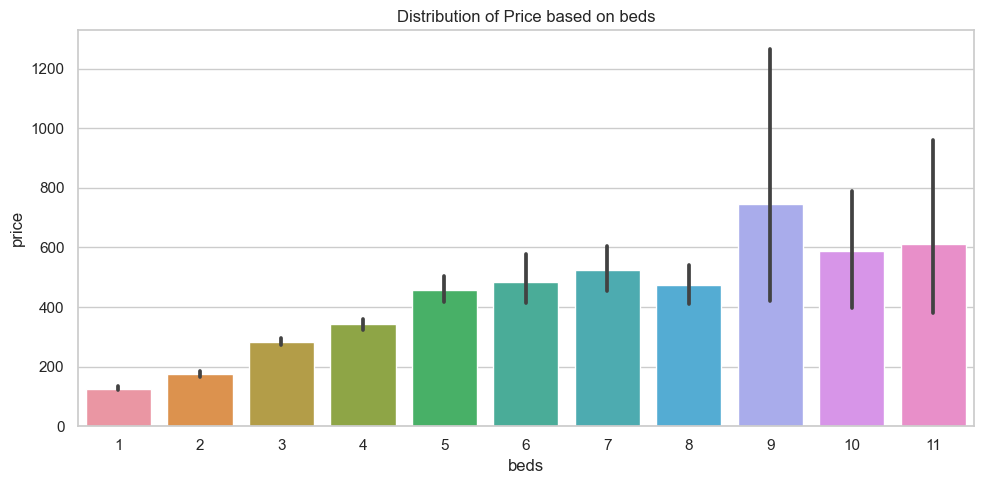

In [18]:
#showing the distribution between price and amount of beds
figsize = (10, 5)
x = 'beds'

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=figsize)
gs = gridspec.GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1)
ax1.set_title(f'Distribution of Price based on {x}')

# Calculate the percentage of each bedroom count relative to all listings
bed_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for beds, percentage in bed_percentage.items():
    print(f'The percentage of listings with {beds} bed(s) is: {percentage:.2f}%')


plt.tight_layout()
plt.show()

The percentage of listings with 1.0 bathroom(s) is: 86.02%
The percentage of listings with 2.0 bathroom(s) is: 6.14%
The percentage of listings with 1.5 bathroom(s) is: 5.38%
The percentage of listings with 2.5 bathroom(s) is: 1.11%
The percentage of listings with 3.0 bathroom(s) is: 0.77%
The percentage of listings with 0.0 bathroom(s) is: 0.22%
The percentage of listings with 3.5 bathroom(s) is: 0.15%
The percentage of listings with 4.0 bathroom(s) is: 0.11%
The percentage of listings with 5.0 bathroom(s) is: 0.05%
The percentage of listings with 4.5 bathroom(s) is: 0.03%
The percentage of listings with 6.0 bathroom(s) is: 0.02%


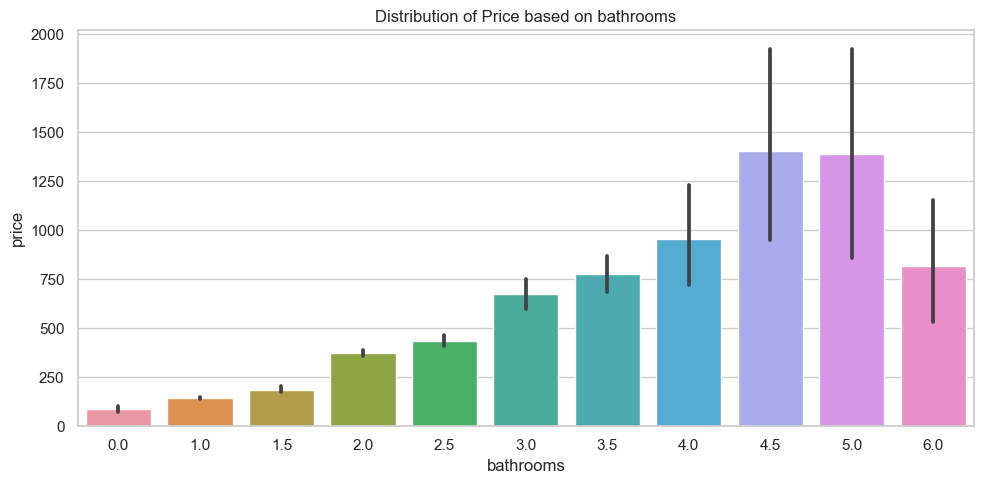

In [19]:
#showing the distribution between price and amount of bathrooms
figsize = (10, 5)
x = 'bathrooms'

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=figsize)
gs = gridspec.GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1)
ax1.set_title(f'Distribution of Price based on {x}')

# Calculate the percentage of each bedroom count relative to all listings
bathroom_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for bathrooms, percentage in bathroom_percentage.items():
    print(f'The percentage of listings with {bathrooms} bathroom(s) is: {percentage:.2f}%')


plt.tight_layout()
plt.show()

The percentage of listings with Entire home/apt room type(s) is: 85.46%
The percentage of listings with Private room room type(s) is: 12.56%
The percentage of listings with Hotel room room type(s) is: 1.47%
The percentage of listings with Shared room room type(s) is: 0.50%


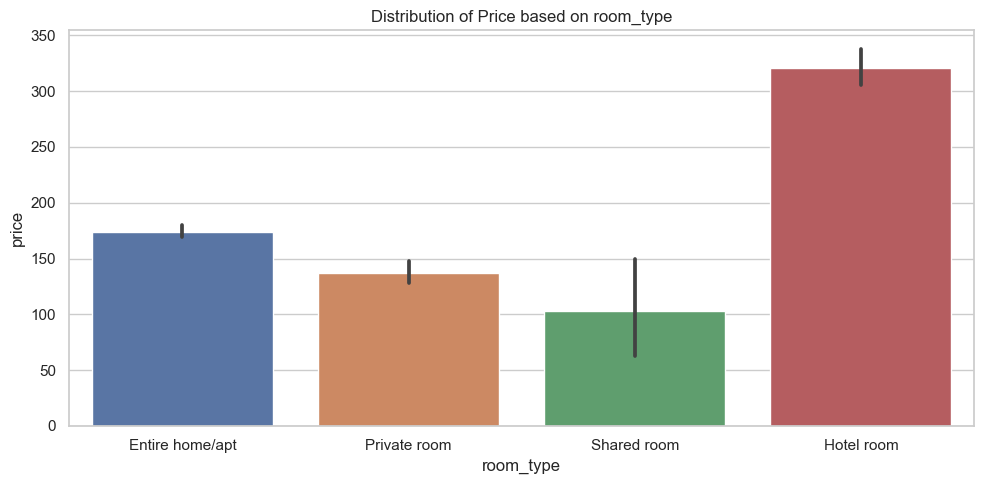

In [20]:
#showing the distribution between price and amount of bathrooms
figsize = (10, 5)
x = 'room_type'

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=figsize)
gs = gridspec.GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1)
ax1.set_title(f'Distribution of Price based on {x}')

# Calculate the percentage of each bedroom count relative to all listings
room_type_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for room_type, percentage in room_type_percentage.items():
    print(f'The percentage of listings with {room_type} room type(s) is: {percentage:.2f}%')


plt.tight_layout()
plt.show()

The percentage of listings with 2 accommodates is: 49.44%
The percentage of listings with 4 accommodates is: 24.51%
The percentage of listings with 3 accommodates is: 8.96%
The percentage of listings with 6 accommodates is: 5.93%
The percentage of listings with 1 accommodates is: 4.93%
The percentage of listings with 5 accommodates is: 3.49%
The percentage of listings with 8 accommodates is: 1.31%
The percentage of listings with 7 accommodates is: 0.65%
The percentage of listings with 10 accommodates is: 0.37%
The percentage of listings with 12 accommodates is: 0.13%
The percentage of listings with 9 accommodates is: 0.12%
The percentage of listings with 11 accommodates is: 0.05%
The percentage of listings with 14 accommodates is: 0.04%
The percentage of listings with 13 accommodates is: 0.03%
The percentage of listings with 15 accommodates is: 0.03%
The percentage of listings with 16 accommodates is: 0.02%


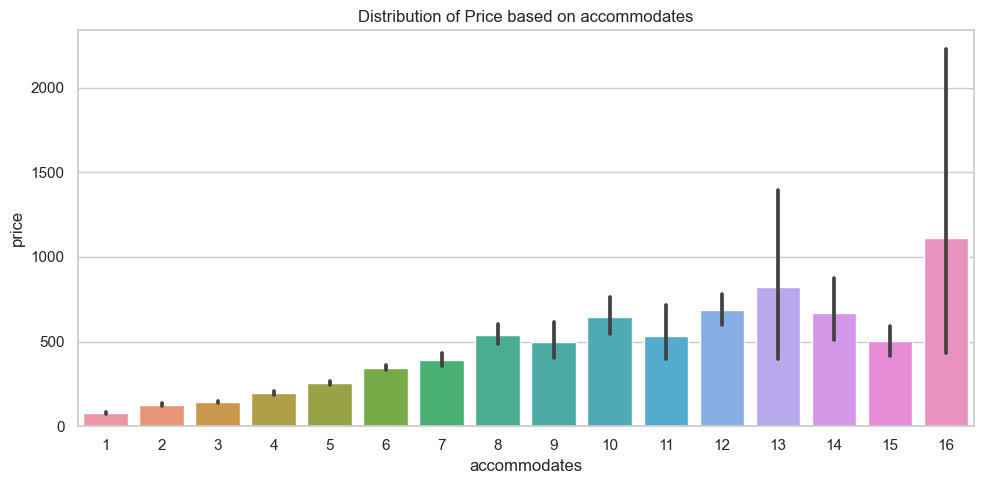

In [21]:
#showing the distribution between price and amount of bathrooms
figsize = (10, 5)
x = 'accommodates'

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=figsize)
gs = gridspec.GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1)
ax1.set_title(f'Distribution of Price based on {x}')

# Calculate the percentage of each bedroom count relative to all listings
accommodates_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for accommodates, percentage in accommodates_percentage.items():
    print(f'The percentage of listings with {accommodates} accommodates is: {percentage:.2f}%')


plt.tight_layout()
plt.show()

The percentage of listings with 22 total_amenities is: 3.84%
The percentage of listings with 20 total_amenities is: 3.84%
The percentage of listings with 18 total_amenities is: 3.82%
The percentage of listings with 24 total_amenities is: 3.61%
The percentage of listings with 16 total_amenities is: 3.54%
The percentage of listings with 26 total_amenities is: 3.36%
The percentage of listings with 14 total_amenities is: 3.06%
The percentage of listings with 28 total_amenities is: 2.94%
The percentage of listings with 30 total_amenities is: 2.87%
The percentage of listings with 44 total_amenities is: 2.83%
The percentage of listings with 48 total_amenities is: 2.77%
The percentage of listings with 42 total_amenities is: 2.71%
The percentage of listings with 50 total_amenities is: 2.69%
The percentage of listings with 46 total_amenities is: 2.68%
The percentage of listings with 40 total_amenities is: 2.67%
The percentage of listings with 38 total_amenities is: 2.65%
The percentage of listin

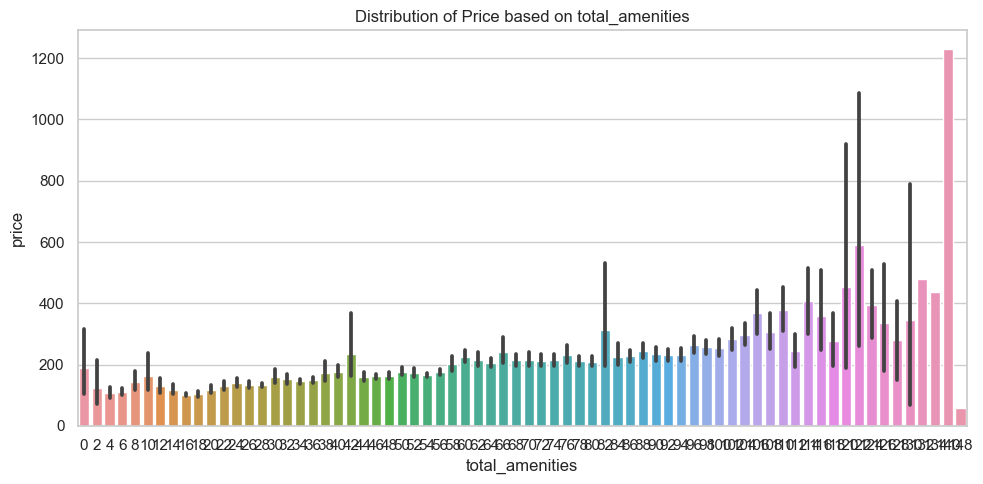

In [22]:
# Calculate the total number of amenities for each listing
dataframe1['total_amenities'] = dataframe1.iloc[:, 51:-1].sum(axis=1)

#showing the distribution between price and amount of bathrooms
figsize = (10, 5)
x = 'total_amenities'

# Create a grid with 2 rows and 1 column
fig = plt.figure(figsize=figsize)
gs = gridspec.GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1)
ax1.set_title(f'Distribution of Price based on {x}')

# Calculate the percentage of each bedroom count relative to all listings
total_amenities_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for total_amenities, percentage in total_amenities_percentage.items():
    print(f'The percentage of listings with {total_amenities} total_amenities is: {percentage:.2f}%')

plt.tight_layout()
plt.show()